The project involves an Indian mutual funds dataset. The dataset comprises 814 rows and 20 columns, encompassing 814 distinct mutual fund schemes managed by 39 Mutual Fund Houses. 

In this project, I am working with a mutual funds dataset from India. The dataset consists of 814 rows and 20 columns, which provide information on various aspects of the mutual fund schemes. Here is a rephrased description of the columns:

1. Scheme Name: The name of the mutual fund scheme.
2. Min sip: The minimum amount required for a systematic investment plan (SIP) to start.
3. Min lumpsum: The minimum amount required for a lump sum investment to start.
4. Expense ratio: The percentage of the scheme's average Net Asset Value (NAV) that represents the expenses.
5. Fund size: The total amount of money that a mutual fund manager oversees and invests.
6. Fund age: The number of years since the inception of the scheme.
7. Fund manager: The individual responsible for implementing the fund's investment strategy and managing trading activities.
8. Sortino: The Sortino ratio, which measures the risk-adjusted return of an investment asset, portfolio, or strategy.
9. Alpha: The excess returns of the scheme relative to a market benchmark for a given amount of risk taken.
10. Standard deviation: A measure of how much the returns of the mutual fund scheme are likely to deviate from its average annual returns.
11. Beta: A measure of a mutual fund's volatility in relation to its respective benchmark index.
12. Sharpe: The Sharpe Ratio, which reveals the potential risk-adjusted returns of a mutual fund.
13. Risk_level: A categorization of risk, ranging from  1 to 6. A higher number indicates an increased risk level. 
14. AMC name: The name of the mutual fund house managing the assets.
15. Rating: A rating assigned to the scheme, ranging from 0 to 5. A higher number indicates better fund performance. 
16. Category: The category to which the mutual fund belongs, such as equity, debt, or hybrid.
17. Sub-category: Additional classification within the category, such as small cap or large cap.
18. Return_1yr (%): The return percentage of the mutual fund scheme over 1 year.
19. Return_3yr (%): The return percentage of the mutual fund scheme over 3 years.
20. Return_5yr (%): The return percentage of the mutual fund scheme over 5 years.

Additionally, I have created five more columns for analysis purposes:

1. Money_Invested: A hypothetical column representing an individual's investment of 100,000 rupees in the first year, considering possible returns after 1, 3, and 5 years, after accounting for expenses.
2. Final_Value_1yr: The total amount of money at the end of the first year, calculated using the formula Initial Investment * (1 + return after the first year - expense ratio).
3. Final_Value_3yr: The total amount of money after three years of staying with the fund.
4. Final_Value_5yr: The total amount of money after five years of staying with the fund.
5. risk_level_cat: A column categorizing risk levels using descriptive labels, ranging from low risk to very high risk.
6. Fund_rating: A column assigning labels to ratings, ranging from disaster to excellent. 

It is important to note that the source of the dataset did not specify the rating criteria or the entity responsible for rating the funds. Hence, I will not make any assumptions or speculations regarding the rating process. My aim is to explore if any variables influenced the rating.

The analysis will be divided into several parts to explore different aspects of the mutual fund schemes:

The first part focuses on identifying the top-performing mutual fund schemes based on various numerical values.

In the second part, the analysis examines the distributions of selected numerical variables within the dataset.

The third part investigates the relationship between the numerical variables, categorized by risk level and fund rating.

The fourth part delves into the different subcategories present in the dataset, providing insights specific to each category.

The fifth part explores the relationships between selected variables to identify any potential correlations or patterns.

The sixth part evaluates the performance of individual fund managers and identifies the best-performing ones.

The seventh part assesses the performance of mutual fund houses to determine the best-performing entities.

The eighth part involves constructing multiple regression models to predict fund ratings based on various factors.

In the ninth and final part, a comparative analysis is conducted on low-rated, moderate-rated, and high-rated funds across different numerical variables. The aim is to identify factors that significantly influence fund ratings.

In [1631]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np 
import seaborn as sns
pd.set_option('display.max_rows',None)
import squarify as sq
import statsmodels.api as sm

# Inspecting and Cleaning the data

In [1156]:
df['amc_name'].nunique()

39

In [615]:
Mutual_Funds = pd.read_csv('comprehensive_mutual_funds_data.csv')

In [1360]:
Mutual_Funds.columns

Index(['scheme_name', 'min_sip', 'min_lumpsum', 'expense_ratio',
       'fund_size_cr', 'fund_age_yr', 'fund_manager', 'sortino', 'alpha', 'sd',
       'beta', 'sharpe', 'risk_level', 'amc_name', 'rating', 'category',
       'sub_category', 'returns_1yr', 'returns_3yr', 'returns_5yr',
       'Money_Invested', 'Final_Value_1yr', 'Final_Value_3yr',
       'Final_Value_5yr', 'risk_level_cat', 'Fund_rating'],
      dtype='object')

In [1361]:
df = Mutual_Funds

In [1363]:
df['risk_level'].value_counts()

6    418
2    127
3    124
4     65
1     53
5     27
Name: risk_level, dtype: int64

In [1364]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 814 entries, 0 to 813
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   scheme_name      814 non-null    object 
 1   min_sip          814 non-null    int64  
 2   min_lumpsum      814 non-null    int64  
 3   expense_ratio    814 non-null    float64
 4   fund_size_cr     814 non-null    float64
 5   fund_age_yr      814 non-null    int64  
 6   fund_manager     814 non-null    object 
 7   sortino          791 non-null    float64
 8   alpha            772 non-null    float64
 9   sd               790 non-null    float64
 10  beta             772 non-null    float64
 11  sharpe           791 non-null    float64
 12  risk_level       814 non-null    int64  
 13  amc_name         814 non-null    object 
 14  rating           814 non-null    int64  
 15  category         814 non-null    object 
 16  sub_category     814 non-null    object 
 17  returns_1yr     

In [618]:
df.sort_values(by='returns_1yr',ascending=False)

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,beta,sharpe,risk_level,amc_name,rating,category,sub_category,returns_1yr,returns_3yr,returns_5yr
89,Bank of India Credit Risk Fund,0,5000,1.54,161.00,8,Alok Singh,0.91,-13.36,77.72,-31.86,0.38,4,Bank of India Mutual Fund,5,Debt,Credit Risk Funds,130.8,12.8,-4.1
97,Bank of India Short Term Income – Direct Growth,1000,5000,0.98,72.00,10,Mithraem Bharucha,0.76,3.58,11.44,-0.99,0.43,2,Bank of India Mutual Fund,5,Debt,Short Duration Funds,28.3,8.8,4.0
321,ICICI Pru Infrastructure Fund,100,5000,1.64,2269.00,10,Ihab Dalwai,4.04,11.76,20.09,0.78,1.83,6,ICICI Prudential Mutual Fund,5,Equity,Sectoral / Thematic Mutual Funds,24.3,44.0,15.1
451,Kotak Infrastructure & Ecoc. Reform-SP-DirGrowth,1000,5000,1.00,727.00,10,Harish Krishnan,4.55,14.15,16.65,0.6,2,6,Kotak Mahindra Mutual Fund,4,Equity,Sectoral / Thematic Mutual Funds,23.2,39.7,13.9
88,Bank of India Conservative Hybrid Fund,1000,10000,2.20,63.00,10,Alok Singh,4.71,6.44,11.85,0.64,0.93,3,Bank of India Mutual Fund,4,Hybrid,Conservative Hybrid Mutual Funds,22.3,15.5,6.4
300,ICICI Pru BHARAT 22 FOF – Direct Growth,1000,5000,0.08,89.00,5,Kayzad Eghlim,2.76,9.68,20.2,0.88,1.47,6,ICICI Prudential Mutual Fund,5,Other,FoFs Domestic,22.1,35.0,NaN
34,Aditya Birla SL Medium Term Plan – Direct Growth,1000,1000,0.86,1652.00,10,Sunaina da Cunha,2.29,9.65,10.73,1.12,0.93,4,Aditya Birla Sun Life Mutual Fund,5,Debt,Medium Duration Funds,22.1,14.5,8.6
314,ICICI Pru FMCG Fund,100,5000,1.44,1156.00,10,Priyanka Khandelwal,3.73,7.44,11.56,0.47,1.61,6,ICICI Prudential Mutual Fund,0,Equity,Sectoral / Thematic Mutual Funds,21.1,24.5,13.5
566,Nippon India Power & Infra Fund,100,5000,1.58,1871.00,10,Sanjay Doshi,3.52,9.72,19.09,0.7,1.67,6,Nippon India Mutual Fund,3,Equity,Sectoral / Thematic Mutual Funds,20.4,37.2,10.1
741,Tata Small Cap Fund,150,5000,0.26,3300.00,4,Chandraprakash Padiyar,3.98,11.28,17.43,0.77,2.12,6,Tata Mutual Fund,4,Equity,Small Cap Mutual Funds,17.1,44.1,NaN


In [619]:
df.isna().sum()

scheme_name        0
min_sip            0
min_lumpsum        0
expense_ratio      0
fund_size_cr       0
fund_age_yr        0
fund_manager       0
sortino            0
alpha              0
sd                 0
beta               0
sharpe             0
risk_level         0
amc_name           0
rating             0
category           0
sub_category       0
returns_1yr        0
returns_3yr       21
returns_5yr      167
dtype: int64

In [761]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 814 entries, 0 to 813
Data columns (total 26 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   scheme_name      814 non-null    object 
 1   min_sip          814 non-null    int64  
 2   min_lumpsum      814 non-null    int64  
 3   expense_ratio    814 non-null    float64
 4   fund_size_cr     814 non-null    float64
 5   fund_age_yr      814 non-null    int64  
 6   fund_manager     814 non-null    object 
 7   sortino          814 non-null    object 
 8   alpha            814 non-null    object 
 9   sd               814 non-null    object 
 10  beta             814 non-null    object 
 11  sharpe           814 non-null    object 
 12  risk_level       814 non-null    int64  
 13  amc_name         814 non-null    object 
 14  rating           814 non-null    int64  
 15  category         814 non-null    object 
 16  sub_category     814 non-null    object 
 17  returns_1yr     

In [1366]:
df['alpha']=pd.to_numeric(df['alpha'],errors = 'coerce')
df['sortino']=pd.to_numeric(df['sortino'],errors = 'coerce')
df['sharpe']=pd.to_numeric(df['sharpe'],errors = 'coerce')
df['sd']=pd.to_numeric(df['sd'],errors='coerce')
df['beta']=pd.to_numeric(df['beta'],errors = 'coerce')

During the data cleaning process, I encountered the following issues in the dataset:

Missing Returns: There are 21 missing values in the "Return_3yr" column and 167 missing values in the "Return_5yr" column. The reason for these missing values is that some mutual fund schemes have been operating for less than three years or less than five years, hence not having returns data for those periods.

Data Type Conversion: To address another issue, I changed the data type of the "Alpha," "Sortino," "Sharpe," "Beta," and "Standard Deviation" columns from object to numeric. This was necessary because Python was not recognizing them as numbers due to the minus sign (-) present in some of the values. To convert the data type, I used the pd.to_numeric(df['column_name'], errors='coerce') function, which instructs Python to ignore any non-numeric characters and convert the values accordingly.

By applying this data type conversion, you can now work with these columns as numeric values, enabling further analysis and calculations.

In [621]:
df.describe()

,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating,returns_1yr,returns_3yr,returns_5yr
count,814.000000,814.000000,814.000000,814.000000,814.000000,814.000000,814.000000,814.000000,793.000000,647.000000
mean,528.500000,3047.468059,0.713231,3812.854214,8.319410,4.400491,2.641278,3.921376,18.525347,9.490726
std,369.184517,2514.619513,0.482161,7181.479475,2.640622,1.814741,1.463476,6.675502,12.108476,3.714015
min,0.000000,0.000000,0.000000,2.380000,1.000000,1.000000,0.000000,-19.700000,3.300000,-4.100000
25%,150.000000,500.000000,0.310000,175.250000,6.000000,3.000000,2.000000,1.500000,6.200000,6.700000
50%,500.000000,5000.000000,0.615000,940.500000,10.000000,6.000000,3.000000,4.400000,18.500000,8.900000
75%,1000.000000,5000.000000,1.030000,3819.000000,10.000000,6.000000,4.000000,5.600000,27.100000,12.200000
max,2000.000000,25000.000000,2.590000,57052.000000,17.000000,6.000000,5.000000,130.800000,71.400000,23.200000


In [1157]:
df.head()

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,100,100,0.0027,10.0,10,Kaustubh Gupta,0.32,2.24,9.39,...,FoFs Domestic,0.040,0.065,0.069,100000,103730.0,106230.0,106630.0,Moderate,Ok
1,Aditya Birla SL Arbitrage Fund,1000,1000,0.0036,4288.0,10,Lovelish Solanki,1.33,1.53,0.72,...,Arbitrage Mutual Funds,0.056,0.048,0.055,100000,105240.0,104440.0,105140.0,Low_Risk,Ok
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,1000,1000,0.0053,157.0,10,Vinod Narayan Bhat,3.44,2.67,10.58,...,FoFs Domestic,0.020,0.189,0.097,100000,101470.0,118370.0,109170.0,High,Ok
3,Aditya Birla SL Bal Bhavishya Yojna – Dir Growth,500,1000,0.0076,637.0,4,Atul Penkar,2.18,-6.37,14.99,...,Childrens Funds,-0.007,0.171,NaN,100000,98540.0,116340.0,NaN,Very_high,Bad
4,Aditya Birla SL Balanced Advantage Fund,100,100,0.0061,6386.0,10,Mohit Sharma,3.69,1.99,10.38,...,Dynamic Asset Allocation or Balanced Advantage,0.045,0.186,0.097,100000,103890.0,117990.0,109090.0,Very_high,Good


In [1158]:
df['category'].value_counts()

Equity               308
Debt                 282
Hybrid               116
Other                 80
Solution Oriented     28
Name: category, dtype: int64

Within the dataset, we observe that mutual fund schemes specialize in and invest in five distinct asset classes. Here is a rephrased description of the distribution:

Out of the 814 mutual fund schemes in the dataset:

308 schemes (approximately 37.8% of the total) invest primarily in equities.
282 schemes (approximately 34.6% of the total) focus on debt instruments, such as bonds.
116 schemes (approximately 14.3% of the total) have investments in both equities and debt instruments.
80 schemes (approximately 9.8% of the total) invest in asset classes not specified explicitly.
28 schemes (approximately 3.4% of the total) are directed towards solution-oriented investment vehicles, including retirement funds, children's education funds, tax-saving funds, and other similar options.


# Top Performing Mutual Fund Schemes - Part I

In [624]:
fund_manager=df['fund_manager'].value_counts().reset_index().head(10)
fund_manager.rename(columns={'index':"Fund_manager",'fund_manager':"Frequency"},inplace=True)
fund_manager
sns.barplot(data=fund_manager,y='Frequency',x='Fund_manager')
plt.xlabel('Fund Manager')
plt.title('Top 10 Fund Managers with the greatest number of Mutual Funds Managed')
plt.xticks(rotation=60)
sns.despine()
plt.yticks([0,2,4,6,8,10,12,14,16,18])
plt.show()
The graph illustrates the top 10 Mutual Fund Managers based on the number of mutual fund schemes they manage. Among all the mutual fund managers, 
Rohit Seksaria stands out with the highest number of mutual fund schemes managed, specifically 18 schemes.

In [628]:
mutual_fund=df.sort_values(by='fund_age_yr',ascending=False).head(10)[['scheme_name','fund_age_yr']]
mutual_fund

,scheme_name,fund_age_yr
613,Quantum Liquid Fund,17
614,Quantum Long Term Equity Value Fund,17
616,Quantum Tax Saving Fund,14
611,Quantum Equity Fund,14
612,Quantum Gold Savings Fund,12
615,Quantum Multi Asset Fund,11
468,LIC MF Debt Hybrid Fund,10
469,LIC MF Equity Hybrid Fund,10
470,LIC MF Flexi Cap Fund,10
471,LIC MF G-Sec Fund,10


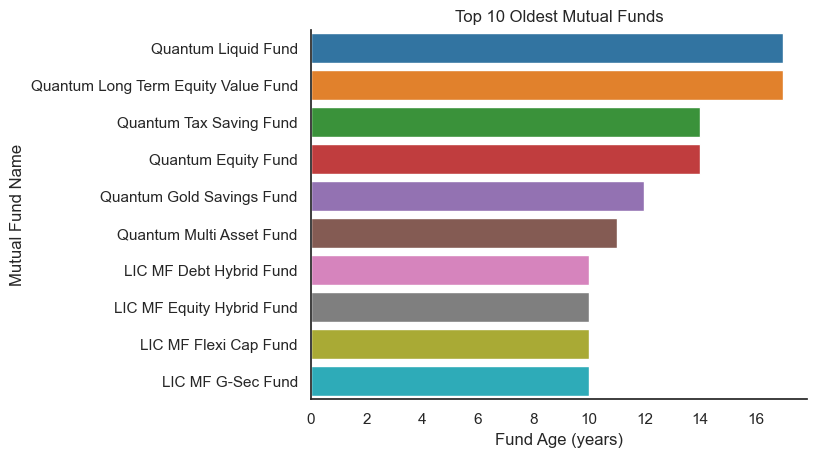

In [1640]:
sns.barplot(data=mutual_fund,x='fund_age_yr',y='scheme_name')
plt.title('Top 10 Oldest Mutual Funds')
plt.xlabel('Fund Age (years)')
plt.ylabel('Mutual Fund Name')
sns.despine()



plt.show()


In this graph, we are examining the oldest mutual fund schemes within our dataset. The Quantum Liquid Fund and Quantum Long Term Equity Value Fund hold the distinction of being the two oldest fund schemes, both having started 17 years ago.

In [630]:
df.head()

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,beta,sharpe,risk_level,amc_name,rating,category,sub_category,returns_1yr,returns_3yr,returns_5yr
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,100,100,0.27,10.0,10,Kaustubh Gupta,0.32,2.24,9.39,0.01,0.24,3,Aditya Birla Sun Life Mutual Fund,3,Other,FoFs Domestic,4.0,6.5,6.9
1,Aditya Birla SL Arbitrage Fund,1000,1000,0.36,4288.0,10,Lovelish Solanki,1.33,1.53,0.72,0.56,1.1,1,Aditya Birla Sun Life Mutual Fund,3,Hybrid,Arbitrage Mutual Funds,5.6,4.8,5.5
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,1000,1000,0.53,157.0,10,Vinod Narayan Bhat,3.44,2.67,10.58,0.67,1.42,5,Aditya Birla Sun Life Mutual Fund,3,Other,FoFs Domestic,2.0,18.9,9.7
3,Aditya Birla SL Bal Bhavishya Yojna – Dir Growth,500,1000,0.76,637.0,4,Atul Penkar,2.18,-6.37,14.99,0.85,0.9,6,Aditya Birla Sun Life Mutual Fund,2,Solution Oriented,Childrens Funds,-0.7,17.1,NaN
4,Aditya Birla SL Balanced Advantage Fund,100,100,0.61,6386.0,10,Mohit Sharma,3.69,1.99,10.38,0.68,1.39,6,Aditya Birla Sun Life Mutual Fund,4,Hybrid,Dynamic Asset Allocation or Balanced Advantage,4.5,18.6,9.7


In [631]:
df['Money_Invested'] = 100000

In [632]:
df['expense_ratio'] = df['expense_ratio'] / 100

In [633]:
df['expense_ratio']

0      0.0027
1      0.0036
2      0.0053
3      0.0076
4      0.0061
5      0.0117
6      0.0037
7      0.0129
8      0.0031
9      0.0069
10     0.0088
11     0.0173
12     0.0064
13     0.0114
14     0.0101
15     0.0121
16     0.0086
17     0.0023
18     0.0106
19     0.0022
20     0.0034
21     0.0036
22     0.0103
23     0.0070
24     0.0015
25     0.0029
26     0.0049
27     0.0082
28     0.0170
29     0.0175
30     0.0215
31     0.0021
32     0.0039
33     0.0156
34     0.0086
35     0.0120
36     0.0021
37     0.0032
38     0.0007
39     0.0112
40     0.0092
41     0.0106
42     0.0107
43     0.0063
44     0.0085
45     0.0034
46     0.0038
47     0.0104
48     0.0093
49     0.0022
50     0.0031
51     0.0070
52     0.0033
53     0.0063
54     0.0106
55     0.0022
56     0.0081
57     0.0026
58     0.0089
59     0.0088
60     0.0070
61     0.0016
62     0.0074
63     0.0013
64     0.0000
65     0.0039
66     0.0017
67     0.0059
68     0.0015
69     0.0085
70     0.0057
71    

In [634]:

df

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sharpe,risk_level,amc_name,rating,category,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,100,100,0.0027,10.00,10,Kaustubh Gupta,0.32,2.24,9.39,...,0.24,3,Aditya Birla Sun Life Mutual Fund,3,Other,FoFs Domestic,4.0,6.5,6.9,100000
1,Aditya Birla SL Arbitrage Fund,1000,1000,0.0036,4288.00,10,Lovelish Solanki,1.33,1.53,0.72,...,1.1,1,Aditya Birla Sun Life Mutual Fund,3,Hybrid,Arbitrage Mutual Funds,5.6,4.8,5.5,100000
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,1000,1000,0.0053,157.00,10,Vinod Narayan Bhat,3.44,2.67,10.58,...,1.42,5,Aditya Birla Sun Life Mutual Fund,3,Other,FoFs Domestic,2.0,18.9,9.7,100000
3,Aditya Birla SL Bal Bhavishya Yojna – Dir Growth,500,1000,0.0076,637.00,4,Atul Penkar,2.18,-6.37,14.99,...,0.9,6,Aditya Birla Sun Life Mutual Fund,2,Solution Oriented,Childrens Funds,-0.7,17.1,NaN,100000
4,Aditya Birla SL Balanced Advantage Fund,100,100,0.0061,6386.00,10,Mohit Sharma,3.69,1.99,10.38,...,1.39,6,Aditya Birla Sun Life Mutual Fund,4,Hybrid,Dynamic Asset Allocation or Balanced Advantage,4.5,18.6,9.7,100000
5,Aditya Birla SL Banking&Financial Services-Dir...,1000,1000,0.0117,2384.00,9,Dhaval Gala,2.07,1.24,25.53,...,0.97,6,Aditya Birla Sun Life Mutual Fund,2,Equity,Sectoral / Thematic Mutual Funds,5.3,24.6,9.2,100000
6,Aditya Birla SL Banking&PSU Debt Fund,1000,1000,0.0037,7994.00,10,Kaustubh Gupta,1.92,4.46,1.91,...,1.09,3,Aditya Birla Sun Life Mutual Fund,4,Debt,Banking and PSU Mutual Funds,4.5,6.8,7.3,100000
7,Aditya Birla SL CEF – Global Agri Plan-Direct ...,1000,1000,0.0129,15.00,10,Vinod Narayan Bhat,1.42,-,20.18,...,1.06,6,Aditya Birla Sun Life Mutual Fund,0,Equity,Sectoral / Thematic Mutual Funds,-10.3,29.4,9.3,100000
8,Aditya Birla SL Corporate Bond Fund,100,100,0.0031,12120.00,10,Kaustubh Gupta,2.28,2.38,1.93,...,1.35,2,Aditya Birla Sun Life Mutual Fund,4,Debt,Corporate Bond Mutual Funds,4.9,7.1,7.4,100000
9,Aditya Birla SL Credit Risk Fund,100,100,0.0069,1032.00,8,Sunaina da Cunha,1.82,3.01,2.9,...,1.47,4,Aditya Birla Sun Life Mutual Fund,4,Debt,Credit Risk Funds,8.7,9.0,7.2,100000


In [635]:
df['returns_1yr'] = df['returns_1yr'] / 100

In [636]:
df['returns_3yr'] = df['returns_3yr'] / 100

In [637]:
df['returns_5yr'] = df['returns_5yr'] / 100

In [638]:
df

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sharpe,risk_level,amc_name,rating,category,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,100,100,0.0027,10.00,10,Kaustubh Gupta,0.32,2.24,9.39,...,0.24,3,Aditya Birla Sun Life Mutual Fund,3,Other,FoFs Domestic,0.040,0.065,0.069,100000
1,Aditya Birla SL Arbitrage Fund,1000,1000,0.0036,4288.00,10,Lovelish Solanki,1.33,1.53,0.72,...,1.1,1,Aditya Birla Sun Life Mutual Fund,3,Hybrid,Arbitrage Mutual Funds,0.056,0.048,0.055,100000
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,1000,1000,0.0053,157.00,10,Vinod Narayan Bhat,3.44,2.67,10.58,...,1.42,5,Aditya Birla Sun Life Mutual Fund,3,Other,FoFs Domestic,0.020,0.189,0.097,100000
3,Aditya Birla SL Bal Bhavishya Yojna – Dir Growth,500,1000,0.0076,637.00,4,Atul Penkar,2.18,-6.37,14.99,...,0.9,6,Aditya Birla Sun Life Mutual Fund,2,Solution Oriented,Childrens Funds,-0.007,0.171,NaN,100000
4,Aditya Birla SL Balanced Advantage Fund,100,100,0.0061,6386.00,10,Mohit Sharma,3.69,1.99,10.38,...,1.39,6,Aditya Birla Sun Life Mutual Fund,4,Hybrid,Dynamic Asset Allocation or Balanced Advantage,0.045,0.186,0.097,100000
5,Aditya Birla SL Banking&Financial Services-Dir...,1000,1000,0.0117,2384.00,9,Dhaval Gala,2.07,1.24,25.53,...,0.97,6,Aditya Birla Sun Life Mutual Fund,2,Equity,Sectoral / Thematic Mutual Funds,0.053,0.246,0.092,100000
6,Aditya Birla SL Banking&PSU Debt Fund,1000,1000,0.0037,7994.00,10,Kaustubh Gupta,1.92,4.46,1.91,...,1.09,3,Aditya Birla Sun Life Mutual Fund,4,Debt,Banking and PSU Mutual Funds,0.045,0.068,0.073,100000
7,Aditya Birla SL CEF – Global Agri Plan-Direct ...,1000,1000,0.0129,15.00,10,Vinod Narayan Bhat,1.42,-,20.18,...,1.06,6,Aditya Birla Sun Life Mutual Fund,0,Equity,Sectoral / Thematic Mutual Funds,-0.103,0.294,0.093,100000
8,Aditya Birla SL Corporate Bond Fund,100,100,0.0031,12120.00,10,Kaustubh Gupta,2.28,2.38,1.93,...,1.35,2,Aditya Birla Sun Life Mutual Fund,4,Debt,Corporate Bond Mutual Funds,0.049,0.071,0.074,100000
9,Aditya Birla SL Credit Risk Fund,100,100,0.0069,1032.00,8,Sunaina da Cunha,1.82,3.01,2.9,...,1.47,4,Aditya Birla Sun Life Mutual Fund,4,Debt,Credit Risk Funds,0.087,0.090,0.072,100000


In [639]:
 df['Final_Value_1yr']=df['Money_Invested'] * (1+ (df['returns_1yr']-df['expense_ratio']))

In [640]:
 df['Final_Value_3yr']=df['Money_Invested'] * (1+ (df['returns_3yr']-df['expense_ratio']))

In [641]:
 df['Final_Value_5yr']=df['Money_Invested'] * (1+ (df['returns_5yr']-df['expense_ratio']))

In [642]:
df[['expense_ratio','returns_1yr','returns_3yr','returns_5yr','Money_Invested','Final_Value_1yr','Final_Value_3yr',
    'Final_Value_5yr']]

,expense_ratio,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr
0,0.0027,0.040,0.065,0.069,100000,103730.0,106230.0,106630.0
1,0.0036,0.056,0.048,0.055,100000,105240.0,104440.0,105140.0
2,0.0053,0.020,0.189,0.097,100000,101470.0,118370.0,109170.0
3,0.0076,-0.007,0.171,NaN,100000,98540.0,116340.0,NaN
4,0.0061,0.045,0.186,0.097,100000,103890.0,117990.0,109090.0
5,0.0117,0.053,0.246,0.092,100000,104130.0,123430.0,108030.0
6,0.0037,0.045,0.068,0.073,100000,104130.0,106430.0,106930.0
7,0.0129,-0.103,0.294,0.093,100000,88410.0,128110.0,108010.0
8,0.0031,0.049,0.071,0.074,100000,104590.0,106790.0,107090.0
9,0.0069,0.087,0.090,0.072,100000,108010.0,108310.0,106510.0


In [1161]:
risk_mapping = {
                1:'Low_Risk',
                2:'Low_to_moderate',
                3:'Moderate',
                4:'Moderately_high',
                5:'High',
                6:'Very_high' } 

df['risk_level_cat'] = df['risk_level'].replace(risk_mapping)

I created the risk_leve_cat column to label the risk levels. 

In [645]:
df[['risk_level_cat','risk_level']]

,risk_level_cat,risk_level
0,Moderate,3
1,Low_Risk,1
2,High,5
3,Very_high,6
4,Very_high,6
5,Very_high,6
6,Moderate,3
7,Very_high,6
8,Low_to_moderate,2
9,Moderately_high,4


In [646]:
rating_mapping = {
    0:'Disaster',
    1:'Poor',
    2:'Bad',
    3:'Ok',
    4:'Good',
    5:'Excellent'
}

In [1163]:
df['Fund_rating']= df['rating'].replace(rating_mapping)

I created a Fund_rating column to count the number of observations by category. This column will provide a convenient way to categorize and analyze the risk levels of the schemes.

In [648]:
df[['Fund_rating','rating']]

,Fund_rating,rating
0,Ok,3
1,Ok,3
2,Ok,3
3,Bad,2
4,Good,4
5,Bad,2
6,Good,4
7,Disaster,0
8,Good,4
9,Good,4


In [649]:
top_return_1yr=df.sort_values('Final_Value_1yr',ascending=False).head(10)
top_return_1yr

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
89,Bank of India Credit Risk Fund,0,5000,0.0154,161.0,8,Alok Singh,0.91,-13.36,77.72,...,Credit Risk Funds,1.308,0.128,-0.041,100000,229260.0,111260.0,94360.0,Moderately_high,Excellent
97,Bank of India Short Term Income – Direct Growth,1000,5000,0.0098,72.0,10,Mithraem Bharucha,0.76,3.58,11.44,...,Short Duration Funds,0.283,0.088,0.040,100000,127320.0,107820.0,103020.0,Low_to_moderate,Excellent
321,ICICI Pru Infrastructure Fund,100,5000,0.0164,2269.0,10,Ihab Dalwai,4.04,11.76,20.09,...,Sectoral / Thematic Mutual Funds,0.243,0.440,0.151,100000,122660.0,142360.0,113460.0,Very_high,Excellent
451,Kotak Infrastructure & Ecoc. Reform-SP-DirGrowth,1000,5000,0.0100,727.0,10,Harish Krishnan,4.55,14.15,16.65,...,Sectoral / Thematic Mutual Funds,0.232,0.397,0.139,100000,122200.0,138700.0,112900.0,Very_high,Good
300,ICICI Pru BHARAT 22 FOF – Direct Growth,1000,5000,0.0008,89.0,5,Kayzad Eghlim,2.76,9.68,20.2,...,FoFs Domestic,0.221,0.350,NaN,100000,122020.0,134920.0,NaN,Very_high,Excellent
34,Aditya Birla SL Medium Term Plan – Direct Growth,1000,1000,0.0086,1652.0,10,Sunaina da Cunha,2.29,9.65,10.73,...,Medium Duration Funds,0.221,0.145,0.086,100000,121240.0,113640.0,107740.0,Moderately_high,Excellent
88,Bank of India Conservative Hybrid Fund,1000,10000,0.0220,63.0,10,Alok Singh,4.71,6.44,11.85,...,Conservative Hybrid Mutual Funds,0.223,0.155,0.064,100000,120100.0,113300.0,104200.0,Moderate,Good
314,ICICI Pru FMCG Fund,100,5000,0.0144,1156.0,10,Priyanka Khandelwal,3.73,7.44,11.56,...,Sectoral / Thematic Mutual Funds,0.211,0.245,0.135,100000,119660.0,123060.0,112060.0,Very_high,Disaster
566,Nippon India Power & Infra Fund,100,5000,0.0158,1871.0,10,Sanjay Doshi,3.52,9.72,19.09,...,Sectoral / Thematic Mutual Funds,0.204,0.372,0.101,100000,118820.0,135620.0,108520.0,Very_high,Ok
741,Tata Small Cap Fund,150,5000,0.0026,3300.0,4,Chandraprakash Padiyar,3.98,11.28,17.43,...,Small Cap Mutual Funds,0.171,0.441,NaN,100000,116840.0,143840.0,NaN,Very_high,Good


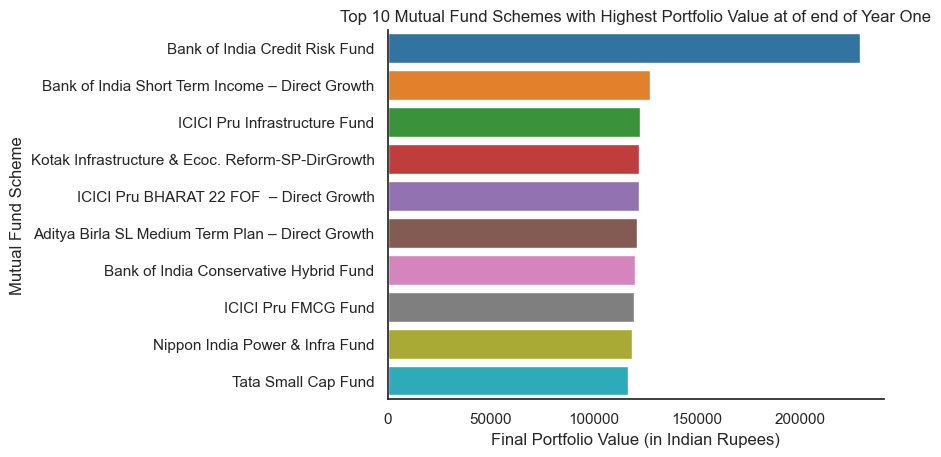

In [1644]:
sns.barplot(data=top_return_1yr, y='scheme_name',x='Final_Value_1yr')
sns.despine()
plt.title('Top 10 Mutual Fund Schemes with Highest Portfolio Value at of end of Year One')
plt.xlabel('Final Portfolio Value (in Indian Rupees)')
plt.ylabel('Mutual Fund Scheme')


plt.show()

The graph represents the top ten mutual fund schemes that generated the highest monetary returns at the end of the first year, after accounting for expenses. It provides insights into the potential growth of an initial investment of 100,000 Indian rupees.

According to the graph, if you had invested 100,000 rupees in the Bank of India Credit Risk Fund, your investment would have grown to approximately 230,000 Indian rupees at the end of the first year after expenses. Similarly, investing in the Tata Small Cap Fund would have resulted in around 116,000 Indian rupees after expenses.

In [651]:
top_return_3yr=df.sort_values('Final_Value_3yr',ascending=False).head(10)
top_return_3yr

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
608,Quant Small Cap Fund,1000,5000,0.0064,3301.0,10,Sanjeev Sharma,3.71,19.16,24.75,...,Small Cap Mutual Funds,0.054,0.714,0.232,100000,104760.0,170760.0,122560.0,Very_high,Excellent
603,Quant Infrastructure Fund,1000,5000,0.0064,822.0,10,Vasav Sahgal,3.44,27.24,19.24,...,Sectoral / Thematic Mutual Funds,0.056,0.615,0.211,100000,104960.0,160860.0,120460.0,Very_high,Excellent
609,Quant Tax Plan- Direct Growth,500,500,0.0057,2779.0,10,Vasav Sahgal,3.5,17.63,19.74,...,ELSS Mutual Funds,0.009,0.549,0.222,100000,100330.0,154330.0,121630.0,Very_high,Excellent
142,Canara Robeco Small Cap Fund,1000,5000,0.0047,4831.0,4,Shridatta Bhandwaldar,4.62,12.23,17.75,...,Small Cap Mutual Funds,-0.006,0.518,NaN,100000,98930.0,151330.0,NaN,Very_high,Excellent
601,Quant Flexi Cap Fund,1000,5000,0.0058,1044.0,10,Vasav Sahgal,3.65,15.93,19.16,...,Flexi Cap Funds,0.068,0.477,0.182,100000,106220.0,147120.0,117620.0,Very_high,Excellent
571,Nippon India Small Cap Fund,100,5000,0.0086,23910.0,10,Samir Rachh,4.2,10.01,19.31,...,Small Cap Mutual Funds,0.087,0.476,0.168,100000,107840.0,146740.0,115940.0,Very_high,Good
98,Bank of India Small Cap Fund,1000,5000,0.0152,414.0,4,Dhruv Bhatia,4.16,8.58,18.44,...,Small Cap Mutual Funds,-0.010,0.477,NaN,100000,97480.0,146180.0,NaN,Very_high,Good
695,Sundaram LT Tax Advantage Fund,0,500,0.0130,18.0,5,Rohit Seksaria,4.32,13.41,18.95,...,ELSS Mutual Funds,0.054,0.469,NaN,100000,104100.0,145600.0,NaN,Very_high,Disaster
600,Quant Active Fund,1000,5000,0.0058,3531.0,10,Sanjeev Sharma,3.33,13.82,19.65,...,Multi Cap Funds,0.010,0.455,0.199,100000,100420.0,144920.0,119320.0,Very_high,Disaster
606,Quant Mid Cap Fund,1000,5000,0.0063,1550.0,10,Sanjeev Sharma,3.58,11.21,18.73,...,Mid Cap Mutual Funds,0.088,0.451,0.198,100000,108170.0,144470.0,119170.0,Very_high,Excellent


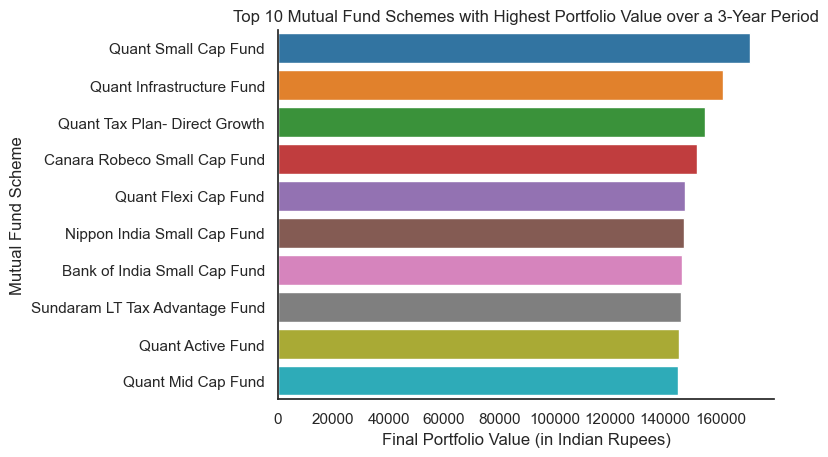

In [1646]:
sns.barplot(data=top_return_3yr, y='scheme_name',x='Final_Value_3yr')
sns.despine()
plt.title('Top 10 Mutual Fund Schemes with Highest Portfolio Value over a 3-Year Period')
plt.xlabel('Final Portfolio Value (in Indian Rupees)')
plt.ylabel('Mutual Fund Scheme')


plt.show()


The graph showcases the top ten mutual fund schemes that achieved the highest monetary returns after a period of three years, while considering the impact of expenses. Notably, the Quant Small Cap Fund emerged as the fund with the highest portfolio value after three years, amounting to approximately 170,000 Indian rupees.

In [1168]:
top_return_5yr=df.sort_values('Final_Value_5yr',ascending=False).head(10)
top_return_5yr

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
608,Quant Small Cap Fund,1000,5000,0.0064,3301.0,10,Sanjeev Sharma,3.71,19.16,24.75,...,Small Cap Mutual Funds,0.054,0.714,0.232,100000,104760.0,170760.0,122560.0,Very_high,Excellent
715,Tata Digital India Fund,150,5000,0.0031,6765.0,7,Meeta Shetty,2.29,6.11,22.78,...,Sectoral / Thematic Mutual Funds,-0.160,0.390,0.221,100000,83690.0,138690.0,121790.0,Very_high,Disaster
609,Quant Tax Plan- Direct Growth,500,500,0.0057,2779.0,10,Vasav Sahgal,3.50,17.63,19.74,...,ELSS Mutual Funds,0.009,0.549,0.222,100000,100330.0,154330.0,121630.0,Very_high,Excellent
347,ICICI Pru Technology Fund,100,5000,0.0099,8993.0,10,Vaibhav Dusad,2.41,9.30,23.40,...,Sectoral / Thematic Mutual Funds,-0.197,0.453,0.216,100000,79310.0,144310.0,120610.0,Very_high,Disaster
603,Quant Infrastructure Fund,1000,5000,0.0064,822.0,10,Vasav Sahgal,3.44,27.24,19.24,...,Sectoral / Thematic Mutual Funds,0.056,0.615,0.211,100000,104960.0,160860.0,120460.0,Very_high,Excellent
10,Aditya Birla SL Digital India Fund,100,1000,0.0088,3338.0,10,Kunal Sangoi,2.42,9.37,21.12,...,Sectoral / Thematic Mutual Funds,-0.146,0.398,0.211,100000,84520.0,138920.0,120220.0,Very_high,Disaster
664,SBI Technology Opportunities Fund,500,5000,0.0087,2861.0,10,Saurabh Pant,2.36,8.38,19.71,...,Sectoral / Thematic Mutual Funds,-0.087,0.371,0.210,100000,90430.0,136230.0,120130.0,Very_high,Disaster
663,SBI Tax Advantage Fund,0,500,0.0176,28.0,9,R Srinivasan,4.10,9.96,16.07,...,ELSS Mutual Funds,0.019,0.411,0.218,100000,100140.0,139340.0,120040.0,Moderately_high,Disaster
607,Quant Multi Asset Fund,1000,5000,0.0056,634.0,10,Vasav Sahgal,3.23,19.52,18.63,...,Multi Asset Allocation Mutual Funds,0.106,0.426,0.205,100000,110040.0,142040.0,119940.0,Very_high,Excellent
600,Quant Active Fund,1000,5000,0.0058,3531.0,10,Sanjeev Sharma,3.33,13.82,19.65,...,Multi Cap Funds,0.010,0.455,0.199,100000,100420.0,144920.0,119320.0,Very_high,Disaster


In [1171]:
df['returns_5yr'].mean()

0.09490726429675429

In [1173]:
df['returns_3yr'].mean()

0.18525346784363203

In [1174]:
df['returns_1yr'].mean()

0.03921375921375919

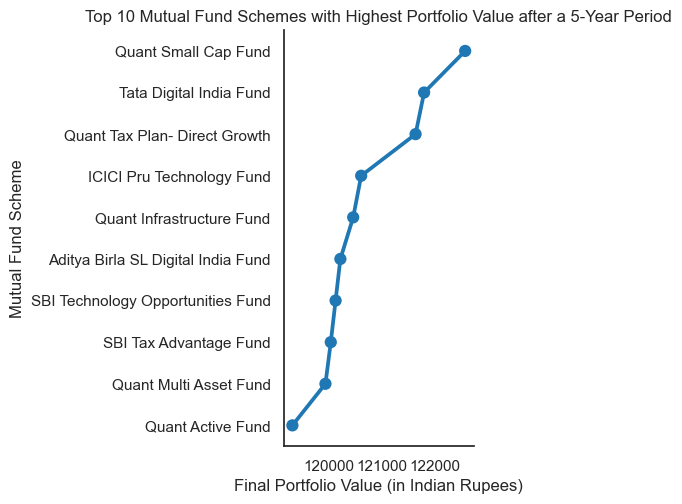

In [1649]:
sns.catplot(data=top_return_5yr, y='scheme_name',x='Final_Value_5yr',kind='point')
sns.despine()
plt.title('Top 10 Mutual Fund Schemes with Highest Portfolio Value after a 5-Year Period')
plt.xlabel('Final Portfolio Value (in Indian Rupees)')
plt.ylabel('Mutual Fund Scheme')

plt.show()

The graph represents the top ten mutual fund schemes that achieved the highest monetary returns after staying invested for a period of over five years, while considering the impact of expenses. Notably, the Quant Small Cap Fund emerged as the fund with the highest portfolio value after five years, amounting to approximately 122,000 Indian rupees.

Upon comparing the returns from the third to the fifth year, we observe a decrease in returns for all funds in the top ten. All funds that were among the top ten best-performing funds after a three-year period had a final portfolio value ranging from around 140,000 to 170,000 Indian rupees. In contrast, funds in the top ten best-performing funds after a five-year period had a final portfolio value ranging from approximately 119,000 to 122,000 Indian rupees. This indicates that the returns decreased over the additional two-year period.

The average return in the first year was approximately 3.92%.
Over a period of three years, the average return was around 18.5%.
Over a period of five years, the average return was approximately 9.42%.


From the end of the first year to the end of the third year, the returns increased by approximately 370%.
From the end of the third year to the end of the fifth year, the returns decreased by approximately 96%.

In [655]:
top_fund=df.sort_values(by='fund_size_cr',ascending=False).head(10)
top_fund

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
638,SBI Liquid Fund,500,500,0.0018,57052.0,10,R Arun,4.07,1.35,0.38,...,Liquid Mutual Funds,0.056,0.043,0.053,100000,105420.0,104120.0,105120.0,Low_to_moderate,Ok
627,SBI Equity Hybrid Fund,500,1000,0.0079,54492.0,10,R Srinivasan,2.77,0.1,11.8,...,Aggressive Hybrid Mutual Funds,-0.019,0.184,0.108,100000,97310.0,117610.0,110010.0,Very_high,Ok
223,HDFC Balanced Advantage Fund,100,100,0.0088,51042.0,10,Gopal Agrawal,3.38,7.38,14.82,...,Dynamic Asset Allocation or Balanced Advantage,0.144,0.293,0.129,100000,113520.0,128420.0,112020.0,Very_high,Good
245,HDFC Liquid Fund,300,5000,0.0020,49008.0,10,Anupam Joshi,3.68,1.34,0.38,...,Liquid Mutual Funds,0.056,0.043,0.053,100000,105400.0,104100.0,105100.0,Low_to_moderate,Bad
323,ICICI Pru Liquid Fund,99,99,0.0020,47245.0,10,Rahul Goswami,4.39,1.39,0.38,...,Liquid Mutual Funds,0.056,0.043,0.053,100000,105400.0,104100.0,105100.0,Moderate,Bad
297,ICICI Pru Balanced Advantage Fund,100,500,0.0091,44515.0,10,Sankaran Naren,5.59,5.34,8.33,...,Dynamic Asset Allocation or Balanced Advantage,0.067,0.197,0.104,100000,105790.0,118790.0,109490.0,High,Good
443,Kotak Flexi Cap Fund,500,5000,0.0068,35775.0,10,Harsha Upadhyaya,2.7,0.11,15.22,...,Flexi Cap Funds,0.038,0.250,0.117,100000,103120.0,124320.0,111020.0,Very_high,Ok
248,HDFC Mid-Cap Opportunities Fund,100,100,0.0095,35009.0,10,Chirag Setalvad,3.64,2.45,16.86,...,Mid Cap Mutual Funds,0.119,0.342,0.131,100000,110950.0,133250.0,112150.0,Very_high,Ok
302,ICICI Pru Bluechip Fund,100,100,0.0106,34198.0,10,Anish Tawakley,3.59,3.05,15.23,...,Large Cap Mutual Funds,0.044,0.282,0.123,100000,103340.0,127140.0,111240.0,Very_high,Good
620,SBI BlueChip Fund,500,5000,0.0090,33987.0,10,Sohini Andani,3.98,1.08,16.39,...,Large Cap Mutual Funds,0.042,0.270,0.114,100000,103300.0,126100.0,110500.0,Very_high,Ok


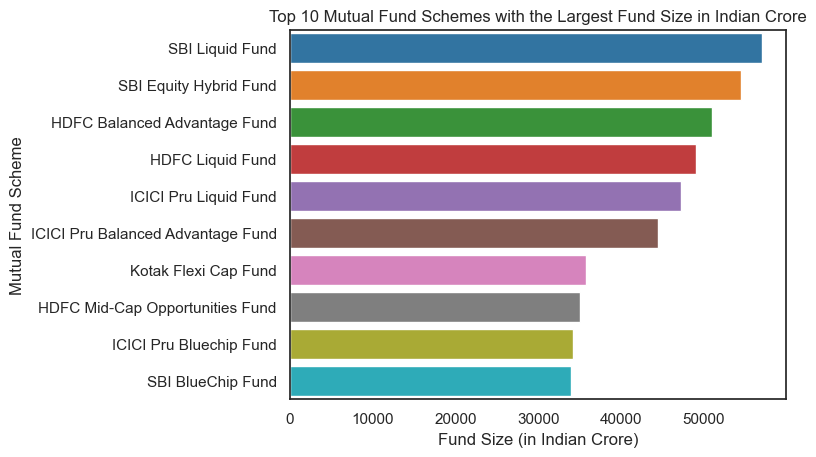

In [1651]:
sns.barplot(data=top_fund,y='scheme_name',x='fund_size_cr')
plt.title('Top 10 Mutual Fund Schemes with the Largest Fund Size in Indian Crore')
plt.xlabel('Fund Size (in Indian Crore)')
plt.ylabel('Mutual Fund Scheme')



plt.show()

The graph displays the top ten Mutual Fund Schemes with the largest Fund Size for investment. Among them, SBI Liquid Funds holds the highest Fund Size, with a value of 57,000 Indian crores, which is approximately equivalent to 7 billion USD. SBI also has another mutual fund scheme ranked in the second position, with a Fund Size of around 6.65 billion USD.

These figures indicate the significant size and magnitude of the funds managed by SBI in terms of assets under management

In [657]:
top_sharpe=df.sort_values(by='sharpe',ascending=False).head(10)
top_sharpe['sharpe'] = top_sharpe['sharpe'].astype('float64')


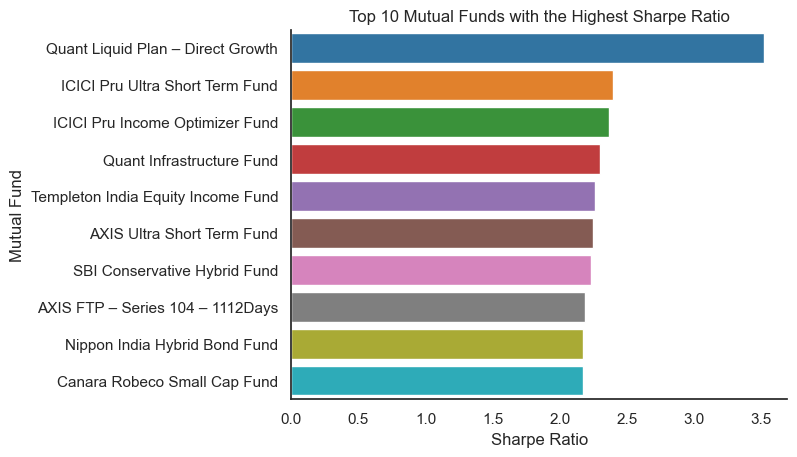

In [1652]:
sns.barplot(data=top_sharpe,y='scheme_name',x='sharpe')
plt.title('Top 10 Mutual Funds with the Highest Sharpe Ratio')
plt.xlabel('Sharpe Ratio')
plt.ylabel('Mutual Fund')
sns.despine()
plt.show()


The graph showcases the top ten mutual funds with the largest Sharpe ratio. The Sharpe ratio is a measure of risk-adjusted performance, calculated as the excess return of the portfolio (i.e., the expected return minus the risk-free rate) divided by the standard deviation of the portfolio.

A larger Sharpe ratio indicates a better risk-adjusted performance, as it reflects a higher excess return relative to the portfolio's volatility or risk. Therefore, the mutual funds included in the graph with the highest Sharpe ratios are considered to have performed well in terms of risk-adjusted returns.

In [659]:
top_sortino=df.sort_values(by='sortino',ascending=False).head(10)
top_sortino['sortino'] = top_sortino['sortino'].astype('float64')
top_sortino

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
605,Quant Liquid Plan – Direct Growth,1000,5000,0.0029,1561.0,10,Sanjeev Sharma,8.60,1.58,0.27,...,Liquid Mutual Funds,0.056,0.049,0.059,100000,105310.0,104610.0,105610.0,Low_to_moderate,Excellent
808,UTI-Ultra Short Term Fund,500,500,0.0044,2130.0,10,Ritesh Nambiar,7.60,2.62,1.51,...,Ultra Short Duration Funds,0.054,0.061,0.057,100000,104960.0,105660.0,105260.0,Moderate,Excellent
63,AXIS FTP – Series 104 – 1112Days,0,0,0.0013,110.0,4,Devang Shah,7.27,5.29,-,...,Fixed Maturity Plans,0.112,0.145,0.140,100000,111070.0,114370.0,113870.0,Low_to_moderate,Disaster
190,Edelweiss Liquid Fund,500,5000,0.0015,1543.0,10,Rahul Dedhia,6.74,1.47,0.38,...,Liquid Mutual Funds,0.056,0.044,0.054,100000,105450.0,104250.0,105250.0,Moderate,Good
807,UTI-Treasury Advantage Fund,500,500,0.0033,2565.0,10,Anurag Mittal,6.28,3.18,2.63,...,Low Duration Funds,0.052,0.073,0.048,100000,104870.0,106970.0,104470.0,Low_to_moderate,Excellent
498,Mirae Asset Cash Management Fund,1000,5000,0.0017,5983.0,10,Abhishek Iyer,6.12,1.3,0.37,...,Liquid Mutual Funds,0.056,0.043,0.053,100000,105430.0,104130.0,105130.0,Low_to_moderate,Ok
296,ICICI Pru Asset Allocator Fund,1000,5000,0.0018,18393.0,10,Dharmesh Kakkad,5.89,7.45,8.68,...,FoFs Domestic,0.088,0.216,0.128,100000,108620.0,121420.0,112620.0,Moderately_high,Good
362,IDBI Liquid Fund,500,5000,0.0013,763.0,10,Raju Sharma,5.73,1.43,0.36,...,Liquid Mutual Funds,0.056,0.044,0.054,100000,105470.0,104270.0,105270.0,Low_to_moderate,Good
297,ICICI Pru Balanced Advantage Fund,100,500,0.0091,44515.0,10,Sankaran Naren,5.59,5.34,8.33,...,Dynamic Asset Allocation or Balanced Advantage,0.067,0.197,0.104,100000,105790.0,118790.0,109490.0,High,Good
767,Union Liquid Fund,2000,5000,0.0007,1688.0,10,Devesh Thacker,5.48,1.4,0.38,...,Liquid Mutual Funds,0.057,0.044,0.046,100000,105630.0,104330.0,104530.0,Low_to_moderate,Good


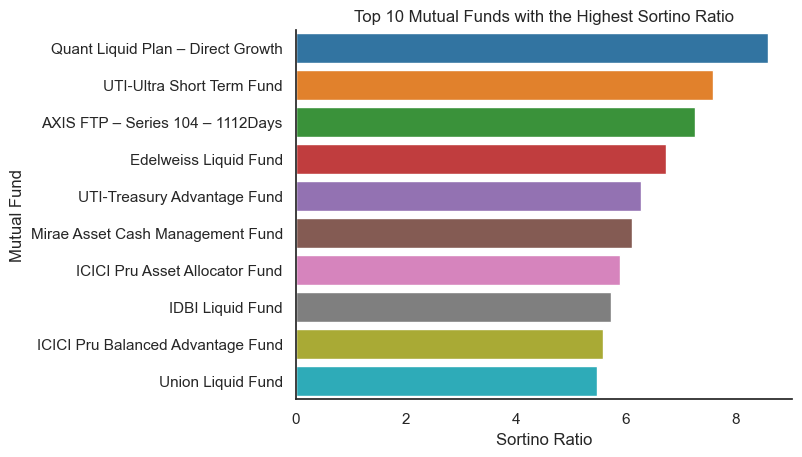

In [1653]:
sns.barplot(data=top_sortino,y='scheme_name',x='sortino')

plt.title('Top 10 Mutual Funds with the Highest Sortino Ratio')
plt.xlabel('Sortino Ratio')
plt.ylabel('Mutual Fund')
sns.despine()
plt.show()


The bar graph represents the mutual fund schemes with the highest Sortino ratios. The Sortino ratio, similar to the Sharpe ratio, is a measure of risk-adjusted performance that evaluates the excess return of an investment relative to its downside risk. However, the Sortino ratio specifically focuses on the volatility or deviation of negative returns, which is why it is also referred to as "semideviation'.

In [1183]:
top_alpha=df.sort_values(by='alpha',ascending=False).head(10)
top_alpha['alpha'] = top_alpha['alpha'].astype('float64')
top_alpha

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
603,Quant Infrastructure Fund,1000,5000,0.0064,822.0,10,Vasav Sahgal,3.44,27.24,19.24,...,Sectoral / Thematic Mutual Funds,0.056,0.615,0.211,100000,104960.0,160860.0,120460.0,Very_high,Excellent
163,DSP Natural Resources & New Energy – Direct Gr...,500,500,0.0121,673.0,10,Rohit Singhania,2.31,21.48,23.46,...,Sectoral / Thematic Mutual Funds,-0.007,0.443,0.120,100000,98090.0,143090.0,110790.0,Very_high,Disaster
607,Quant Multi Asset Fund,1000,5000,0.0056,634.0,10,Vasav Sahgal,3.23,19.52,18.63,...,Multi Asset Allocation Mutual Funds,0.106,0.426,0.205,100000,110040.0,142040.0,119940.0,Very_high,Excellent
608,Quant Small Cap Fund,1000,5000,0.0064,3301.0,10,Sanjeev Sharma,3.71,19.16,24.75,...,Small Cap Mutual Funds,0.054,0.714,0.232,100000,104760.0,170760.0,122560.0,Very_high,Excellent
609,Quant Tax Plan- Direct Growth,500,500,0.0057,2779.0,10,Vasav Sahgal,3.50,17.63,19.74,...,ELSS Mutual Funds,0.009,0.549,0.222,100000,100330.0,154330.0,121630.0,Very_high,Excellent
599,Quant Absolute Fund,1000,5000,0.0056,1013.0,10,Sanjeev Sharma,3.75,16.98,14.41,...,Aggressive Hybrid Mutual Funds,0.073,0.382,0.191,100000,106740.0,137640.0,118540.0,Very_high,Excellent
735,Tata Resources & Energy Fund,150,5000,0.0091,232.0,7,Satish Chandra Mishra,2.48,16.72,20.36,...,Sectoral / Thematic Mutual Funds,-0.034,0.347,0.155,100000,95690.0,133790.0,114590.0,Very_high,Disaster
601,Quant Flexi Cap Fund,1000,5000,0.0058,1044.0,10,Vasav Sahgal,3.65,15.93,19.16,...,Flexi Cap Funds,0.068,0.477,0.182,100000,106220.0,147120.0,117620.0,Very_high,Excellent
693,Sundaram LT MC Tax Advantage Fund,0,500,0.0123,31.0,5,Rohit Seksaria,4.10,15.38,20.47,...,ELSS Mutual Funds,0.038,0.448,0.098,100000,102570.0,143570.0,108570.0,Very_high,Disaster
623,SBI Contra Fund,500,5000,0.0091,8340.0,10,Dinesh Balachandran,4.43,15.26,16.56,...,Contra Funds,0.150,0.434,0.156,100000,114090.0,142490.0,114690.0,Very_high,Excellent


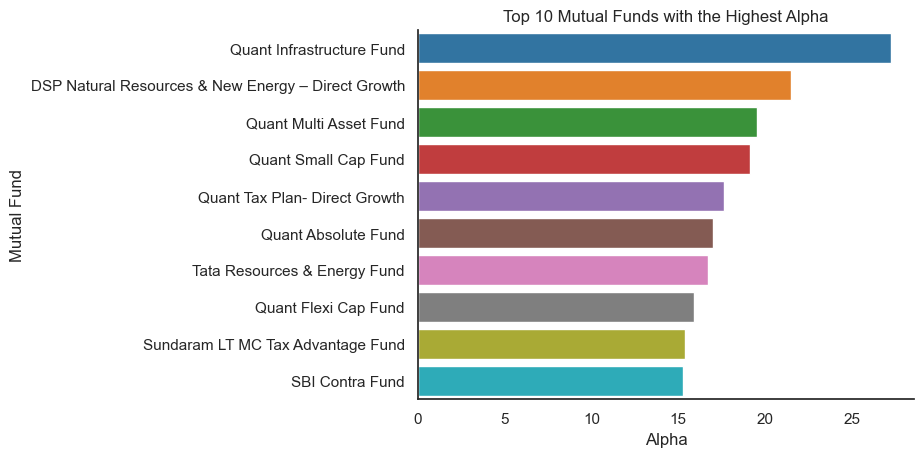

In [1654]:
sns.barplot(data=top_alpha,y='scheme_name',x='alpha')

plt.title('Top 10 Mutual Funds with the Highest Alpha')
plt.xlabel('Alpha')
plt.ylabel('Mutual Fund')
sns.despine()
plt.show()

The alpha represents the excess return of an investment, taking into account the risk associated with that investment. A positive alpha value, such as an alpha of 10, indicates that the mutual fund scheme has outperformed the benchmark or overall market by 10 percentage points after adjusting for market risk. 

In the case of the Quant Infrastructure Fund, having an alpha of 27.24 signifies that it has exhibited exceptional performance and has outperformed the benchmark or market by a significant margin. This makes it one of the most successful fund schemes in our dataset, as it has generated substantial excess returns relative to its risk.

The range between the first and tenth placed funds in terms of alpha values is  27.24 - 15.29 = 11.95. This range highlights the variation in the excess returns generated by the different mutual fund schemes, with the top-performing funds demonstrating higher alpha values.

In [1368]:
top_sd=df.sort_values(by='sd',ascending=False).head(10)
top_sd

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
89,Bank of India Credit Risk Fund,0,5000,0.0154,161.0,8,Alok Singh,0.91,-13.36,77.72,...,Credit Risk Funds,1.308,0.128,-0.041,100000,229260.0,111260.0,94360.0,Moderately_high,Excellent
177,DSP World Gold Fund,500,500,0.0181,777.0,10,Jay Kothari,1.11,NaN,36.51,...,FoFs Overseas,-0.090,0.148,0.102,100000,89190.0,112990.0,108390.0,Very_high,Disaster
178,DSP World Mining Fund,500,500,0.0150,188.0,10,Jay Kothari,1.68,NaN,28.33,...,FoFs Overseas,-0.054,0.371,0.150,100000,93100.0,135600.0,113500.0,Very_high,Disaster
588,PGIM India GEO Fund,1000,5000,0.0144,1336.0,10,Rahul Jagwani,1.01,NaN,25.79,...,FoFs Overseas,-0.079,0.189,0.141,100000,90660.0,117460.0,112660.0,Very_high,Disaster
187,Edelweiss Greater China Equity Off-Shore Fund,500,5000,0.0144,1897.0,10,Bhavesh Jain,0.60,NaN,25.75,...,FoFs Overseas,-0.041,0.090,0.061,100000,94460.0,107560.0,104660.0,Very_high,Disaster
5,Aditya Birla SL Banking&Financial Services-Dir...,1000,1000,0.0117,2384.0,9,Dhaval Gala,2.07,1.24,25.53,...,Sectoral / Thematic Mutual Funds,0.053,0.246,0.092,100000,104130.0,123430.0,108030.0,Very_high,Bad
526,Motilal Oswal Nifty Bank Index Fund,500,500,0.0021,332.0,4,Swapnil Mayekar,2.02,0.00,25.40,...,Index Funds,0.108,0.250,NaN,100000,110590.0,124790.0,NaN,Very_high,Bad
542,Nippon India Banking&Financial Services-DirGrowth,100,5000,0.0132,3826.0,10,Vinay Sharma,2.22,6.01,24.98,...,Sectoral / Thematic Mutual Funds,0.088,0.283,0.095,100000,107480.0,126980.0,108180.0,Very_high,Ok
608,Quant Small Cap Fund,1000,5000,0.0064,3301.0,10,Sanjeev Sharma,3.71,19.16,24.75,...,Small Cap Mutual Funds,0.054,0.714,0.232,100000,104760.0,170760.0,122560.0,Very_high,Excellent
776,UTI-Banking and Financial Services Fund,500,5000,0.0139,824.0,10,Amit Premchandani,2.17,1.05,24.46,...,Sectoral / Thematic Mutual Funds,0.082,0.244,0.067,100000,106810.0,123010.0,105310.0,Very_high,Poor


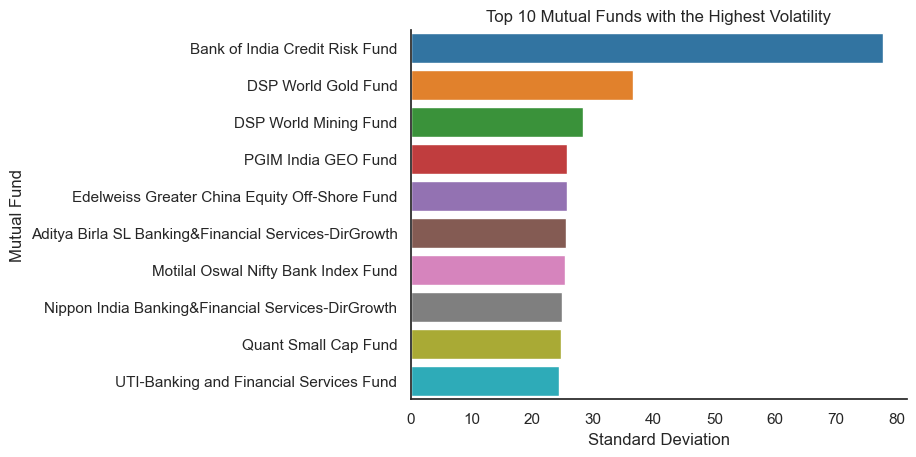

In [1668]:
sns.barplot(data=top_sd,y='scheme_name',x='sd')

plt.title('Top 10 Mutual Funds with the Highest Volatility')
plt.xlabel('Standard Deviation')
plt.ylabel('Mutual Fund')
sns.despine()
plt.show() 

The graph presents the funds with the highest volatility, as measured by their standard deviation. Volatility, as indicated by the standard deviation, reflects the degree of fluctuation or variability in the returns of a mutual fund scheme. Risk-averse investors tend to avoid funds with high volatility because it implies greater uncertainty and potential risk.

According to the graph, the Bank of India Credit Risk Fund exhibits the highest volatility with a standard deviation of 77.2. This suggests that this particular fund experiences significant fluctuations in its returns, making it relatively risky compared to other funds.

The range in the list, which is 52.26, signifies the difference between the highest and lowest standard deviation values among the funds displayed in the graph. This range emphasizes the varying levels of volatility among the funds, with the top-ranked fund experiencing considerably higher volatility than the rest.

It is notable that many of the funds in the list invest in the banking and financial services sector. This sector is often associated with higher volatility due to factors such as market conditions, regulatory changes, and economic fluctuations. Consequently, investors should carefully consider the risk tolerance and investment objectives when evaluating funds with high volatility.



In [1195]:
low_sd=df.sort_values(by='sd',ascending=True)head(10)
low_sd

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
605,Quant Liquid Plan – Direct Growth,1000,5000,0.0029,1561.0,10,Sanjeev Sharma,8.60,1.58,0.27,...,Liquid Mutual Funds,0.056,0.049,0.059,100000,105310.0,104610.0,105610.0,Low_to_moderate,Excellent
378,Indiabulls Overnight Fund,500,500,0.0018,42.0,4,Karan Singh,-1.77,0.40,0.33,...,Overnight Mutual Funds,0.052,0.038,NaN,100000,105020.0,103620.0,NaN,Low_Risk,Poor
596,PGIM India Overnight Fund,1000,100,0.0012,75.0,4,Puneet Pal,0.95,0.67,0.33,...,Overnight Mutual Funds,0.054,0.039,NaN,100000,105280.0,103780.0,NaN,Low_Risk,Good
194,Edelweiss Overnight Fund,500,5000,0.0010,480.0,4,Rahul Dedhia,0.08,0.63,0.33,...,Overnight Mutual Funds,0.053,0.039,NaN,100000,105200.0,103800.0,NaN,Low_Risk,Bad
122,Baroda BNP Paribas Overnight Fund,500,5000,0.0008,423.0,4,Vikram Pamnani,0.32,0.62,0.34,...,Overnight Mutual Funds,0.054,0.039,NaN,100000,105320.0,103820.0,NaN,Low_Risk,Ok
289,HSBC Overnight Fund,500,5000,0.0010,2759.0,4,Kapil Punjabi,0.92,0.65,0.34,...,Overnight Mutual Funds,0.054,0.039,NaN,100000,105300.0,103800.0,NaN,Low_Risk,Excellent
802,UTI-Overnight Fund,500,500,0.0007,5600.0,10,Amit Sharma,0.12,0.60,0.34,...,Overnight Mutual Funds,0.054,0.039,0.046,100000,105330.0,103830.0,104530.0,Low_Risk,Ok
494,Mahindra Manulife Overnight Fund,0,1000,0.0012,345.0,4,Rahul Pal,0.52,0.61,0.34,...,Overnight Mutual Funds,0.054,0.039,NaN,100000,105280.0,103780.0,NaN,Low_Risk,Good
415,ITI Overnight Fund,500,5000,0.0008,26.0,3,Vikrant Mehta,-1.11,0.48,0.34,...,Overnight Mutual Funds,0.052,0.038,NaN,100000,105120.0,103720.0,NaN,Low_Risk,Poor
579,Parag Parikh Liquid Fund,1000,5000,0.0017,1456.0,5,Raj Mehta,0.59,0.87,0.34,...,Liquid Mutual Funds,0.053,0.040,NaN,100000,105130.0,103830.0,NaN,Low_to_moderate,Poor


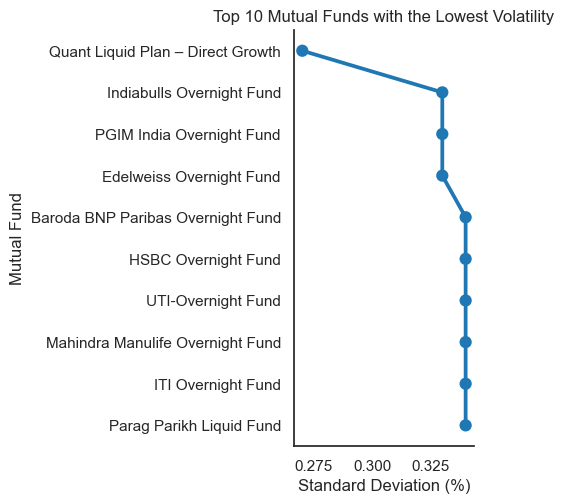

In [1669]:
sns.catplot(data=low_sd,y='scheme_name',x='sd', kind='point')

plt.title('Top 10 Mutual Funds with the Lowest Volatility')
plt.xlabel('Standard Deviation (%)')
plt.ylabel('Mutual Fund')
sns.despine()
plt.show()

The graph showcases the top ten funds with the lowest standard deviation. Risk-averse investors generally favor funds with lower volatility as it indicates a higher level of certainty in the investment's return.

Among all the funds in our dataset, the Quant Liquid Plan - Direct Growth fund exhibited the lowest volatility. This suggests that this particular fund experiences relatively smaller fluctuations or variability in its returns compared to other funds.

Investors who prioritize stability and seek to minimize the potential for significant ups and downs in their investment returns may find funds with lower standard deviations more appealing. 

In [1200]:
top_expense=df.sort_values(by='expense_ratio',ascending=False).head(10)
top_expense

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
748,Taurus Flexi Cap Fund,1000,5000,0.0259,233.00,10,Ankit Tikmany,1.69,-4.83,16.22,...,Flexi Cap Funds,-0.041,0.202,0.054,100000,93310.0,117610.0,102810.0,Very_high,Poor
88,Bank of India Conservative Hybrid Fund,1000,10000,0.0220,63.00,10,Alok Singh,4.71,6.44,11.85,...,Conservative Hybrid Mutual Funds,0.223,0.155,0.064,100000,120100.0,113300.0,104200.0,Moderate,Good
746,Taurus Discovery (Midcap) Fund,1000,5000,0.0219,74.00,10,Hardik Shah,2.28,-5.29,17.41,...,Mid Cap Mutual Funds,0.036,0.264,0.109,100000,101410.0,124210.0,108710.0,Very_high,Ok
30,Aditya Birla SL Inter Equity – Plan B-Direct G...,1000,1000,0.0215,90.00,10,Vinod Narayan Bhat,2.45,-1.93,16.30,...,Sectoral / Thematic Mutual Funds,-0.041,0.227,0.076,100000,93750.0,120550.0,105450.0,Very_high,Disaster
87,Bank of India Balanced Advantage Fund,1000,5000,0.0207,90.00,9,Alok Singh,1.81,-1.05,11.04,...,Dynamic Asset Allocation or Balanced Advantage,0.136,0.121,0.051,100000,111530.0,110030.0,103030.0,Very_high,Bad
647,SBI Magnum Comma Fund,500,5000,0.0203,417.00,10,Richard Dsouza,2.37,1.41,21.13,...,Sectoral / Thematic Mutual Funds,-0.121,0.309,0.113,100000,85870.0,128870.0,109270.0,Very_high,Disaster
749,Taurus Infrastructure Fund,1000,5000,0.0202,5.12,10,Neha Raichura,2.68,3.64,16.22,...,Sectoral / Thematic Mutual Funds,-0.007,0.253,0.089,100000,97280.0,123280.0,106880.0,Very_high,Ok
93,Bank of India Mid & Small Cap Equity & Debt Fund,1000,5000,0.0192,380.00,7,Alok Singh,2.56,10.87,15.51,...,Aggressive Hybrid Mutual Funds,-0.003,0.293,0.104,100000,97780.0,127380.0,108480.0,Very_high,Good
791,UTI-Infrastructure Fund,500,5000,0.0192,1445.00,10,Sachin Trivedi,2.90,3.52,17.99,...,Sectoral / Thematic Mutual Funds,0.129,0.280,0.094,100000,110980.0,126080.0,107480.0,Very_high,Bad
90,Bank of India Large & Mid Cap Equity Fund,1000,5000,0.0189,204.00,10,Nitin Gosar,2.66,1.70,15.55,...,Large & Mid Cap Funds,0.027,0.256,0.095,100000,100810.0,123710.0,107610.0,Very_high,Bad


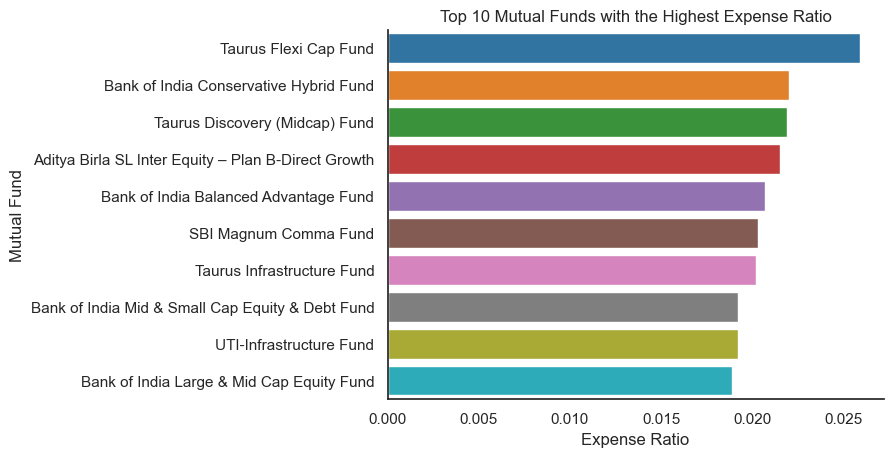

In [1670]:
sns.barplot(data=top_expense,y='scheme_name',x='expense_ratio')

plt.title('Top 10 Mutual Funds with the Highest Expense Ratio')
plt.xlabel('Expense Ratio')
plt.ylabel('Mutual Fund')
sns.despine()
plt.show()


Among the funds in our dataset, several have notably high expense fees. It is advisable for investors to be cautious of such high fees as they can significantly impact their returns, particularly if the fund's performance is average or below average. Let's take the example of the Taurus Flexi Cap Fund, which charges its investors a fee of 2.5%.

Suppose an investor had initially invested 100,000 Indian rupees in this fund. After the first year, their portfolio would have been worth 93,310 Indian rupees. This decrease in value is primarily due to the fund experiencing a loss of 4.1% in the first year, compounded by the expense ratio of 2.5%, resulting in a total loss of 6.69%.

Comparing this to the average return and expense ratio of all funds in the first year, we find that the average return was 3.92%, and the average expense ratio was 0.007. This gives us an average return of 3.22%. Therefore, for the Taurus Flexi Cap Fund to break even with other funds, it would have needed to achieve a return of 5.81% (average return of 3.22% plus the expense ratio of 2.59%).

Interestingly, it is worth noting that three Taurus Mutual Schemes are included in the list of most expensive fund schemes. Furthermore, out of the ten fund schemes listed, five have poor or worse ratings.

This analysis highlights the importance of considering expense ratios and fund ratings when making investment decisions, as high fees can significantly impact overall returns, and fund ratings provide valuable insights into a fund's performance and potential drawbacks. 

In [1202]:
df['expense_ratio'].mean()

0.007132309582309579

In [1203]:
low_expense=df.sort_values(by='expense_ratio',ascending=True).head(10)
low_expense

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
632,SBI FMP – Series 1 (3668 Days) – Direct Growth,0,5000,0.0000,40.0,4,Ranjana Gupta,1.00,9.30,3.62,...,Fixed Maturity Plans,0.048,0.062,NaN,100000,104800.0,106200.0,NaN,Moderate,Disaster
64,AXIS FTP – Series 109 – 111Days,0,0,0.0000,565.0,1,Devang Shah,NaN,NaN,NaN,...,Fixed Maturity Plans,0.112,0.145,0.140,100000,111200.0,114500.0,114000.0,Moderate,Disaster
563,Nippon India Nifty Next 50 Junior BeES FoF-Dir...,100,100,0.0002,148.0,4,Mehul Dama,1.75,-4.27,18.26,...,FoFs Domestic,-0.058,0.218,NaN,100000,94180.0,121780.0,NaN,Very_high,Bad
73,AXIS Overnight Fund,0,500,0.0005,12566.0,4,Aditya Pagaria,0.49,0.62,0.35,...,Overnight Mutual Funds,0.054,0.039,NaN,100000,105350.0,103850.0,NaN,Low_Risk,Good
85,Bandhan FTP – Sr.179,0,5000,0.0005,286.0,4,Harshal Joshi,0.90,9.78,3.98,...,Fixed Maturity Plans,0.044,0.062,NaN,100000,104350.0,106150.0,NaN,Moderate,Disaster
167,DSP Overnight Fund,500,500,0.0006,2754.0,4,Kedar Karnik,0.73,0.67,0.34,...,Overnight Mutual Funds,0.054,0.039,NaN,100000,105340.0,103840.0,NaN,Low_Risk,Good
612,Quantum Gold Savings Fund,500,500,0.0006,83.0,12,Chirag Mehta,0.98,-0.98,13.78,...,FoFs Domestic,0.143,0.117,0.130,100000,114240.0,111640.0,112940.0,High,Poor
336,ICICI Pru Passive Strategy Fund,1000,5000,0.0006,93.0,10,Dharmesh Kakkad,3.11,1.99,14.83,...,FoFs Domestic,0.049,0.263,0.109,100000,104840.0,126240.0,110840.0,Very_high,Ok
125,BHARAT Bond FOF – April 2025 – Direct Growth,500,1000,0.0006,3912.0,3,Dhawal Dalal,NaN,NaN,NaN,...,FoFs Domestic,0.026,NaN,NaN,100000,102540.0,NaN,NaN,Low_to_moderate,Bad
38,Aditya Birla SL Overnight Fund,0,5000,0.0007,13399.0,4,Kaustubh Gupta,0.11,0.58,0.35,...,Overnight Mutual Funds,0.054,0.039,NaN,100000,105330.0,103830.0,NaN,Low_Risk,Ok


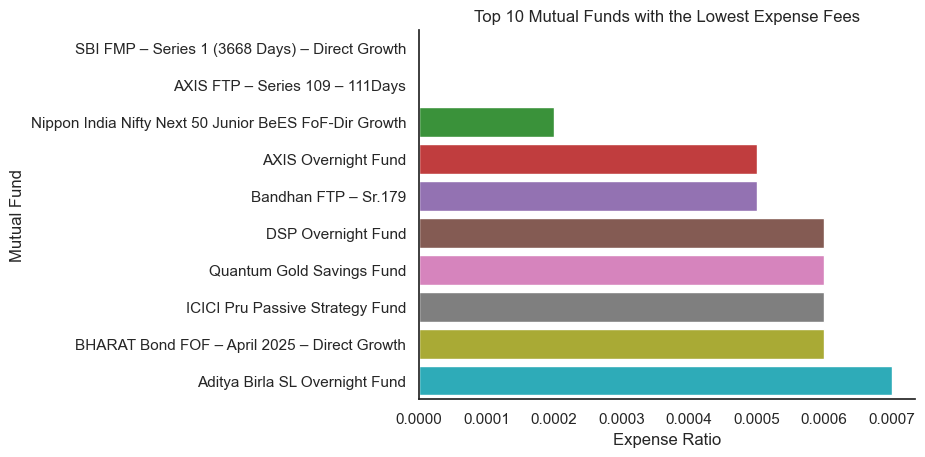

In [1671]:
sns.barplot(data=low_expense,y='scheme_name',x='expense_ratio')

plt.title('Top 10 Mutual Funds with the Lowest Expense Fees')
plt.xlabel('Expense Ratio')
plt.ylabel('Mutual Fund')
sns.despine()
plt.show()

The graph showcases the fund schemes with the lowest expense fees. Remarkably, the top two funds on the list do not charge any expenses to investors. The expense fees range spans from 0 to 0.007, which is roughly around the average expense ratio of 0.0071.

Curiously, six out of the ten funds in this list have received a fund rating of "bad" or worse. Additionally, the top two funds have received a fund rating of 0, indicating the lowest rating. This observation suggests that having low expenses does not automatically guarantee that a fund is a better choice for investors.

# Distributions - Part II

In [1249]:
columns = ['scheme_name','expense_ratio','fund_size_cr','fund_age_yr','sharpe','sortino','alpha','sd','returns_1yr',
          'returns_3yr', 'returns_5yr']
df2 = df[columns]
df2['expense_ratio'] = df2['expense_ratio']*100
df2['returns_1yr'] = df2['returns_1yr']*100
df2['returns_3yr'] = df2['returns_3yr']*100
df2['returns_5yr'] = df2['returns_5yr']*100
df2

/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/3400186345.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['expense_ratio'] = df2['expense_ratio']*100
/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/3400186345.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['returns_1yr'] = df2['returns_1yr']*100
/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/3400186345.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

,scheme_name,expense_ratio,fund_size_cr,fund_age_yr,sharpe,sortino,alpha,sd,returns_1yr,returns_3yr,returns_5yr
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,0.27,10.00,10,0.24,0.32,2.24,9.39,4.0,6.5,6.9
1,Aditya Birla SL Arbitrage Fund,0.36,4288.00,10,1.10,1.33,1.53,0.72,5.6,4.8,5.5
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,0.53,157.00,10,1.42,3.44,2.67,10.58,2.0,18.9,9.7
3,Aditya Birla SL Bal Bhavishya Yojna – Dir Growth,0.76,637.00,4,0.90,2.18,-6.37,14.99,-0.7,17.1,NaN
4,Aditya Birla SL Balanced Advantage Fund,0.61,6386.00,10,1.39,3.69,1.99,10.38,4.5,18.6,9.7
5,Aditya Birla SL Banking&Financial Services-Dir...,1.17,2384.00,9,0.97,2.07,1.24,25.53,5.3,24.6,9.2
6,Aditya Birla SL Banking&PSU Debt Fund,0.37,7994.00,10,1.09,1.92,4.46,1.91,4.5,6.8,7.3
7,Aditya Birla SL CEF – Global Agri Plan-Direct ...,1.29,15.00,10,1.06,1.42,NaN,20.18,-10.3,29.4,9.3
8,Aditya Birla SL Corporate Bond Fund,0.31,12120.00,10,1.35,2.28,2.38,1.93,4.9,7.1,7.4
9,Aditya Birla SL Credit Risk Fund,0.69,1032.00,8,1.47,1.82,3.01,2.90,8.7,9.0,7.2


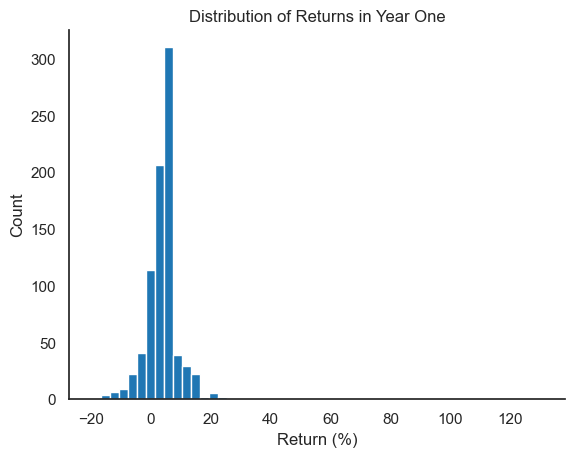

In [1673]:
plt.hist(x=df2['returns_1yr'],bins=50)
plt.title('Distribution of Returns in Year One')
plt.xlabel('Return (%)')
plt.ylabel('Count')
sns.despine()
plt.show()

The graph represents the distribution of first-year returns for the fund schemes. Upon analyzing the distribution, we observe that it exhibits a slight right skewness, as indicated by the skewness value of 8.4. This implies that the distribution has a longer tail on the right side.

Furthermore, the kurtosis value of 160 suggests heavy right tails and a significant number of extreme values in the dataset, indicating a distribution with more outliers or extreme returns.

The median return, which represents the middle value in the dataset, is 4.4%. The average return, calculated by summing all returns and dividing by the number of observations, is 3.92%. The mode, or the most frequently occurring return, is 5.6%.

The close clustering of the central tendency measures, including the median, average, and mode, suggests that the distribution is relatively symmetric and resembles a normal distribution.

The interquartile range, which measures the spread of the middle 50% of the data, is 4.1%. This indicates that the majority of the returns fall within a relatively narrow range, capturing the variability of the central portion of the distribution.

Overall, the distribution of first-year returns demonstrates some right skewness, heavy right tails, and a concentration of returns around the median and average values.

In [1215]:
df2['returns_1yr'].describe()

count    814.000000
mean       3.921376
std        6.675502
min      -19.700000
25%        1.500000
50%        4.400000
75%        5.600000
max      130.800000
Name: returns_1yr, dtype: float64

In [1216]:
df2['returns_1yr'].median()

4.4

In [1218]:
df2['returns_1yr'].mode()

0    5.6
Name: returns_1yr, dtype: float64

In [1219]:
df2['returns_1yr'].skew()

8.408136798513743

In [1220]:
df2['returns_1yr'].kurtosis()

160.81583552592718

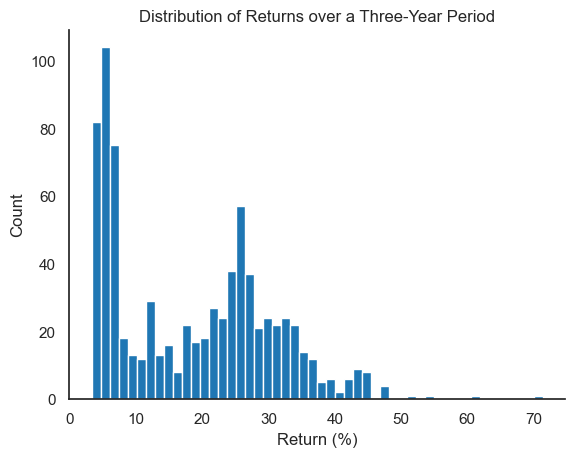

In [1674]:
plt.hist(x=df2['returns_3yr'],bins=50)
plt.title('Distribution of Returns over a Three-Year Period')
plt.xlabel('Return (%)')
plt.ylabel('Count')
sns.despine()

plt.show()

The histogram illustrates a bimodal distribution of returns over a three-year period. It displays two prominent peaks, one around 4% and another around 26-27%. This bimodal pattern suggests the presence of two distinct groups or patterns within the dataset.

The skewness value of 0.47 indicates a slightly right-skewed distribution, implying that the tail on the right side is slightly longer or has a few higher values.

The kurtosis value of -0.44 suggests a relatively flat distribution with a moderate number of extreme values, implying that the distribution has fewer outliers or extreme returns compared to a more peaked distribution.

Both the average return and the median return are reported as 18.5%, indicating that they are equal. This implies that the distribution is symmetric or approximately symmetrical around the center.

The interquartile range (IQR) is a measure of the spread of the middle 50% of the data. In this case, the IQR is 20.9, which indicates a relatively large spread in the middle 50% of the values. This suggests that there is considerable variability within this range.

It is interesting to note that the IQR for returns over a three-year period is significantly larger than that for returns over a one-year period. This implies that the variability or spread of returns is greater over a longer time frame.

Overall, the histogram reveals a bimodal distribution with distinct peaks, a slight right skewness, a relatively flat kurtosis, and a significant spread in the middle 50% of the values. 

In [1270]:
df2['returns_3yr'].describe()

count    793.000000
mean      18.525347
std       12.108476
min        3.300000
25%        6.200000
50%       18.500000
75%       27.100000
max       71.400000
Name: returns_3yr, dtype: float64

In [1222]:
df2['returns_3yr'].median()

18.5

In [1223]:
df2['returns_3yr'].mode()

0    3.9
Name: returns_3yr, dtype: float64

In [1224]:
df2['returns_3yr'].skew()

0.4789999690115275

In [1225]:
df2['returns_3yr'].kurtosis()

-0.4408811860355488

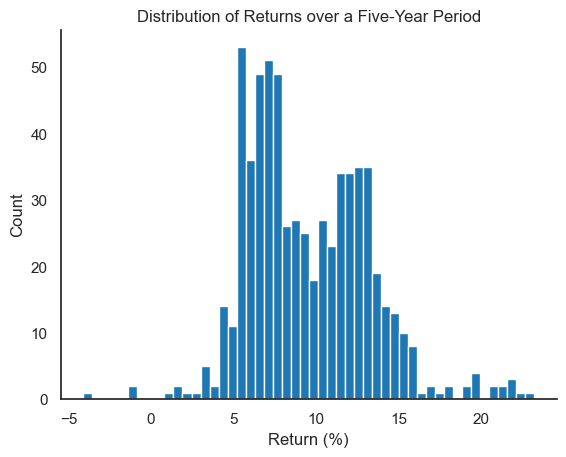

In [1675]:
plt.hist(x=df2['returns_5yr'],bins=50)
plt.title('Distribution of Returns over a Five-Year Period')
plt.xlabel('Return (%)')
plt.ylabel('Count')
sns.despine()

plt.show()


The histogram represents the distribution of returns over a five-year period. The skewness value of 0.57 indicates a slightly right-skewed distribution, suggesting that the tail on the right side is longer and there are a few extreme outliers in the data.

The average return over a five-year period, which is reported as 9.49%, is half of the average return for a three-year period. This suggests a lower average return for the longer time frame.

The interquartile range (IQR) is a measure of the spread of the middle 50% of the data. In this case, the IQR is 5.5%, which is significantly smaller than the IQR for returns over a three-year period. This implies that the variability within the middle 50% of the data is smaller for the five-year period returns.

The median return, reported as 8.9%, represents the middle value in the dataset. The mode, which is the most frequently occurring return, is reported as 5.3%.

Overall, the distribution of returns over a one-year and five-year period appears to be closer to a normal distribution with a few extreme values. However, the distribution for returns over a three-year period shows a bigger spread in the middle 50% and exhibits a more bimodal pattern.

Moreover, the returns over a five-year period have a smaller spread in the dataset compared to returns over a one-year period and returns over a three-year period. This suggests that returns over a longer five-year period are less volatile or have less variability compared to shorter time frames.

In summary, the distributions of returns over different time periods display varying characteristics, with the five-year period returns exhibiting a slightly right-skewed distribution, smaller variability, and a lower average return compared to the three-year period returns.

In [1228]:
df2['returns_5yr'].describe()

count    647.000000
mean       9.490726
std        3.714015
min       -4.100000
25%        6.700000
50%        8.900000
75%       12.200000
max       23.200000
Name: returns_5yr, dtype: float64

In [1229]:
df2['returns_5yr'].median()

8.9

In [1230]:
df2['returns_5yr'].mode()

0    5.3
Name: returns_5yr, dtype: float64

In [1231]:
df2['returns_5yr'].skew() 

0.5659925150775296

In [1232]:
df2['returns_5yr'].kurtosis() 

0.7824798716438837

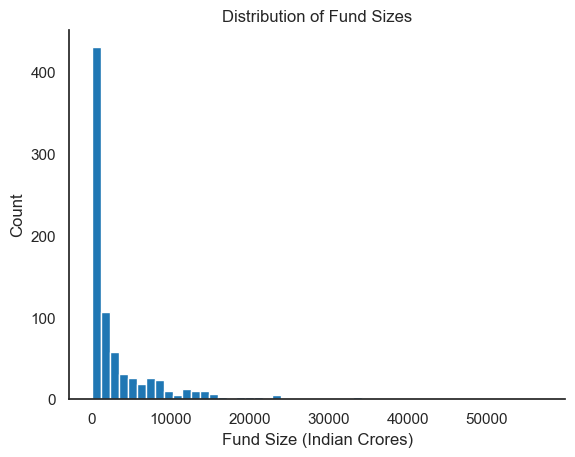

In [1676]:
plt.hist(x=df2['fund_size_cr'],bins=50)
plt.title('Distribution of Fund Sizes')
plt.xlabel('Fund Size (Indian Crores)')
plt.ylabel('Count')
sns.despine()

plt.show()

The histogram represents the distribution of fund sizes in the dataset. The distribution appears to be skewed to the right, as indicated by the skewness value of 3.6. This suggests that the tail on the right side of the distribution is longer, indicating a greater number of larger fund sizes.

The kurtosis value of 16.34 suggests a highly peaked distribution with a significant number of positive extreme values. 

The average fund size is reported as 3812 crores, while the median is 940 crores. This indicates that the distribution is positively skewed since the average is higher than the median.

The mode, which represents the most frequently occurring fund size, is reported as 90 crores. This suggests that there is a particular fund size that occurs more frequently than others in the dataset.

The interquartile range (IQR) is reported as 3644. This indicates a large spread in the middle values, suggesting significant variability in fund sizes within this range.

The dataset exhibits a great variability in fund sizes, as indicated by the standard deviation. This means that there is a substantial difference between individual fund sizes and the average fund size.

Overall, the histogram displays a right-skewed distribution with a highly peaked shape and a concentration of larger fund sizes. The average fund size is higher than the median, and the dataset shows a large spread in fund sizes, indicating considerable variability.

In [1234]:
df2['fund_size_cr'].describe()

count      814.000000
mean      3812.854214
std       7181.479475
min          2.380000
25%        175.250000
50%        940.500000
75%       3819.000000
max      57052.000000
Name: fund_size_cr, dtype: float64

In [1235]:
df2['fund_size_cr'].mode()

0    90.0
Name: fund_size_cr, dtype: float64

In [1236]:
df2['fund_size_cr'].median()

940.5

In [1237]:
df2['fund_size_cr'].skew()

3.604316060696159

In [1241]:
df2['fund_size_cr'].kurtosis()

16.395886953416735

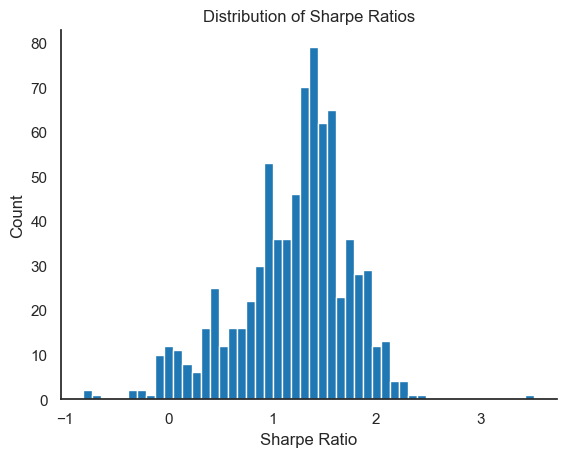

In [1677]:
plt.hist(x=df2['sharpe'],bins=50)
plt.title('Distribution of Sharpe Ratios')
plt.xlabel('Sharpe Ratio')
plt.ylabel('Count')
sns.despine()


plt.show()

The histogram represents the distribution of the Sharpe ratio in the dataset. The distribution appears to be slightly skewed to the left, as indicated by the negative skewness value of -0.059. This suggests that there are some extreme values or outliers in the left tail of the distribution.

The kurtosis value of 0.74 suggests a distribution that is relatively close to a normal distribution, with a moderate number of extreme values.

The average Sharpe ratio is reported as 1.2, while the median is 1.29. This indicates that the central tendency measures of the distribution are close together, suggesting a relatively symmetrical distribution.

The mode, which represents the most frequently occurring Sharpe ratio, is reported as 1.4. This indicates that there is a specific Sharpe ratio value that occurs more frequently than others in the dataset.

Overall, the distribution of the Sharpe ratio resembles a normal distribution, with a slight left skewness and a relatively moderate kurtosis. The central tendency measures, such as the average, median, and mode, are clustered together, further supporting the normal-like distribution shape.

In [1261]:
df2['sharpe'].skew()

-0.5921143826209977

In [1262]:
df2['sharpe'].kurtosis()

0.7438155079626094

In [1263]:
df2['sharpe'].describe()

count    791.000000
mean       1.204185
std        0.536431
min       -0.820000
25%        0.930000
50%        1.290000
75%        1.550000
max        3.520000
Name: sharpe, dtype: float64

In [1276]:
df2['sharpe'].mode()

0    1.4
Name: sharpe, dtype: float64

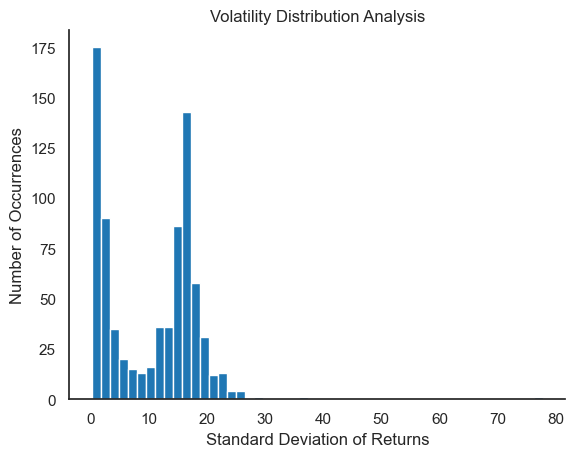

In [1679]:

plt.hist(x=df2['sd'],bins=50)
plt.title('Volatility Distribution Analysis')
plt.xlabel('Standard Deviation of Returns')
plt.ylabel('Number of Occurrences')
sns.despine()


plt.show()

The histogram represents the distribution of standard deviations in the dataset. It displays two distinct peaks, one around 0.38% and another around 17%. This bimodal pattern suggests the presence of two distinct groups or patterns within the dataset.

The distribution appears to be slightly skewed to the right, as indicated by the positive skewness value of 0.78. This suggests that there are more extreme values or outliers on the right side of the distribution.

The kurtosis value of 5.48 indicates a distribution with a relatively high peak and a significant number of extreme values, particularly on the right tail. This suggests that there are more extreme values or variability in the higher standard deviation range.

The average standard deviation is reported as 7.8, representing the average variability of the dataset. The interquartile range (IQR), which measures the spread of the middle 50% of the data, is reported as 14.28. This indicates a considerable variability in the standard deviations within the middle range of values.

The most frequently occurring standard deviation, or the mode, is reported as 0.38, suggesting that there is a specific standard deviation value that occurs more frequently than others in the dataset.

Overall, the histogram demonstrates a bimodal distribution with distinct peaks, a slight right skewness, a higher peak on the right tail, and a significant spread in the middle 50% of the standard deviation values.

In [1259]:
df2['sd'].skew()

0.7778058728470043

In [1264]:
df2['sd'].kurtosis()

5.48156203171825

In [1266]:
df2['sd'].describe()

count    790.000000
mean      10.272696
std        7.805667
min        0.270000
25%        2.162500
50%       12.300000
75%       16.437500
max       77.720000
Name: sd, dtype: float64

In [1267]:
df2['sd'].mode()

0    0.38
Name: sd, dtype: float64

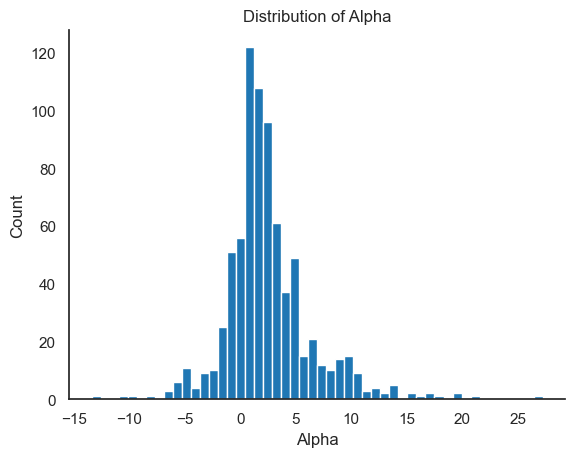

In [1680]:
plt.hist(x=df2['alpha'],bins=50)
plt.title('Distribution of Alpha')
plt.xlabel('Alpha')
plt.ylabel('Count')
sns.despine()


plt.show()

The histogram represents the distribution of the fund's alpha, which measures the excess return of a mutual fund compared to a benchmark index after adjusting for risk. The distribution appears to be slightly skewed to the right, indicating a greater number of positive alpha values.

The presence of extreme values in both the left and right tails suggests a wide range of alpha values, indicating significant variation in fund performance.

The average alpha of 2.5 indicates that, on average, the mutual fund schemes in the dataset outperformed the overall market by 2.5 percentage points after considering risk. This suggests that, on average, the funds in the dataset have generated positive excess returns compared to their benchmark.

The median alpha of 1.855 represents the middle value in the dataset. The mode, which represents the most frequently occurring alpha, is reported as 0.67. This implies that there is a particular alpha value that occurs more frequently than others in the dataset.

Overall, the histogram reveals a slightly right-skewed distribution of fund alphas, with some extreme values in both tails. The average alpha suggests a positive average excess return compared to the benchmark. 

In [1280]:
df2['alpha'].skew()

1.1712973123343189

In [1282]:
df2['alpha'].kurtosis()

4.641844784797234

In [1284]:
df2['alpha'].describe()

count    772.000000
mean       2.505635
std        3.951573
min      -13.360000
25%        0.530000
50%        1.855000
75%        3.847500
max       27.240000
Name: alpha, dtype: float64

In [1285]:
df2['alpha'].mode()

0    0.67
Name: alpha, dtype: float64

In [ ]:
plt.hist(x=df2[''],bins=50)
plt.title('Distribution of Alpha')
plt.xlabel('Alpha')
plt.ylabel('Count')
sns.despine()


plt.show()

# Categorical Variables - Part III

In [974]:
result1=df.groupby('risk_level_cat')['returns_1yr'].agg([np.mean,np.std,np.median,np.max,np.min,
                                                 lambda x: np.percentile(x,25),lambda x: np.percentile(x,75),
                                                        lambda x: np.percentile(x,75) - np.percentile(x,25)]).mul(100
                                                                                                        )
result1.columns = ['Average','Stdev','Median','Max','Min','Q1','Q3','IQR']

result1

,Average,Stdev,Median,Max,Min,Q1,Q3,IQR
risk_level_cat,,,,,,,,
High,7.277778,5.485389,5.30,15.0,-2.5,2.600,13.7,11.100
Low_Risk,5.277358,0.630214,5.40,6.4,1.7,5.300,5.5,0.200
Low_to_moderate,5.164567,2.348574,5.20,28.3,1.7,4.400,5.6,1.200
Moderate,4.900806,2.321777,4.65,22.3,1.7,3.775,5.6,1.825
Moderately_high,6.169231,16.017958,4.10,130.8,-2.7,2.500,5.5,3.000
Very_high,2.514833,6.150609,1.80,24.3,-19.7,-0.700,5.7,6.400


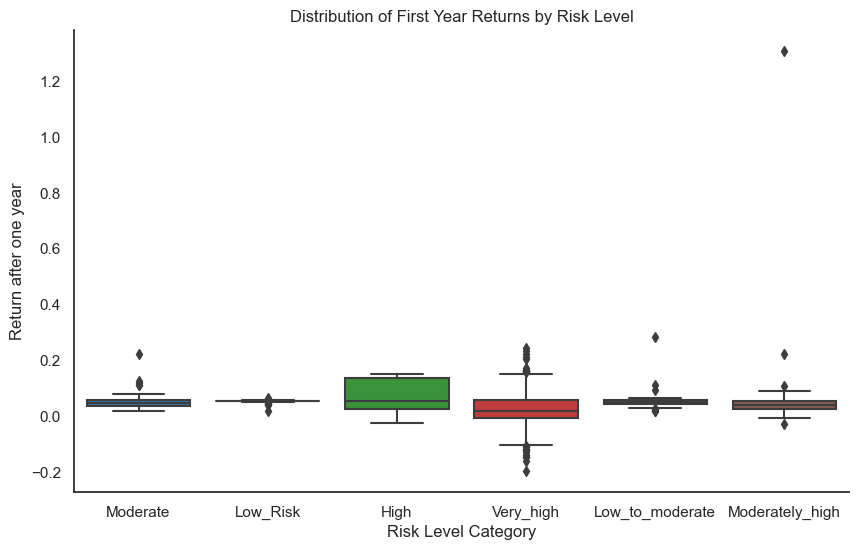

In [1684]:
plt.figure(figsize=(10,6))
sns.boxplot(x='risk_level_cat',y='returns_1yr',data=df)
plt.title('Distribution of First Year Returns by Risk Level')
plt.ylabel('Return after one year')
plt.xlabel('Risk Level Category')
sns.despine()

plt.show()


The boxplots represent the first-year returns categorized by risk level. Among all the risk levels, the high-risk level exhibits the highest average return of 7.27%. 

The high-risk level does not have any outliers, indicating that the data points fall within the whiskers of the boxplot.

Furthermore, the high-risk level also has the largest interquartile range (IQR) of 11.1, which suggests a significant spread in the middle 50% of the data. This indicates a wider range of returns within the high-risk category.

Surprisingly, the very high-risk level exhibits the lowest average return of 2.5% and a median return of 1.8% among all the risk levels. 

Moreover, the very high-risk level displays a notable number of outliers on both ends of its distribution. This suggests that there are funds within this category that have experienced extreme returns, both positive and negative.

Overall, most risk levels exhibit an average return of approximately 5% and a median return around 5%. The high-risk level stands out with the highest average return, while the very high-risk level has the lowest average and median returns. 

In [1287]:
result1

,Average,Stdev,Median,Max,Min,Q1,Q3,IQR
risk_level_cat,,,,,,,,
High,7.277778,5.485389,5.30,15.0,-2.5,2.600,13.7,11.100
Low_Risk,5.277358,0.630214,5.40,6.4,1.7,5.300,5.5,0.200
Low_to_moderate,5.164567,2.348574,5.20,28.3,1.7,4.400,5.6,1.200
Moderate,4.900806,2.321777,4.65,22.3,1.7,3.775,5.6,1.825
Moderately_high,6.169231,16.017958,4.10,130.8,-2.7,2.500,5.5,3.000
Very_high,2.514833,6.150609,1.80,24.3,-19.7,-0.700,5.7,6.400


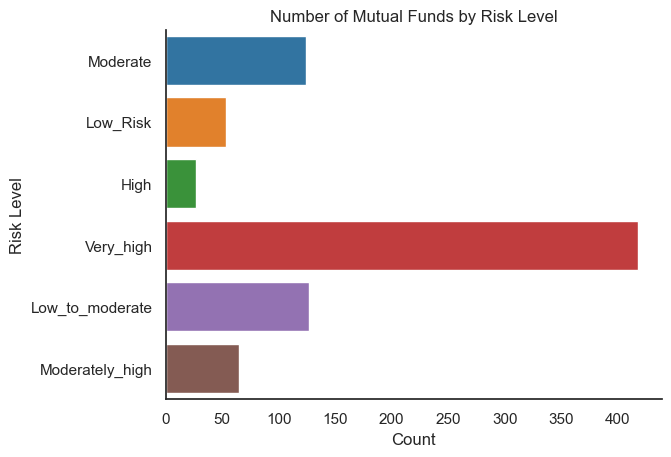

In [1685]:
sns.countplot(data=df,y='risk_level_cat')
plt.title('Number of Mutual Funds by Risk Level')
plt.ylabel('Risk Level')
plt.xlabel('Count')

sns.despine()
plt.show()

The vertical bar graph provides a visual representation of the number of mutual fund schemes categorized by risk level. The dataset predominantly consists of mutual fund schemes classified as very high risk, with a count of 418 schemes. This indicates that a significant portion of the funds in the dataset falls into the very high-risk category.

Following the very high-risk category, the next two largest categories are low to moderate risk(127) and moderate risk(124). These two risk levels have a considerable number of mutual fund schemes.

Overall, the graph indicates that the dataset primarily consists of mutual fund schemes that are classified as very high risk. This suggests that the dataset is skewed towards more aggressive or high-risk investment options.

In [695]:
df['risk_level_cat'].value_counts()

Very_high          418
Low_to_moderate    127
Moderate           124
Moderately_high     65
Low_Risk            53
High                27
Name: risk_level_cat, dtype: int64

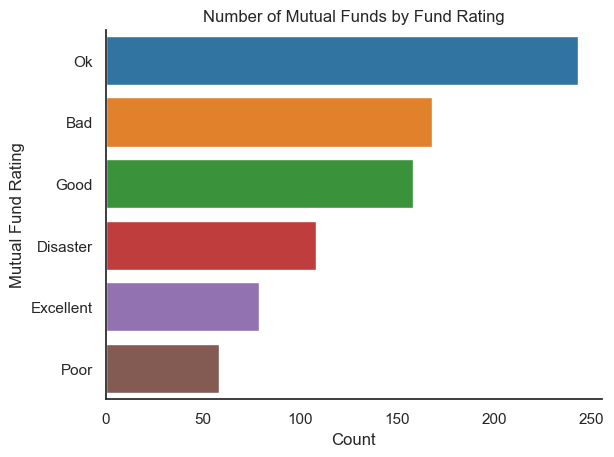

In [1686]:
sns.countplot(data=df,y='Fund_rating')

plt.title('Number of Mutual Funds by Fund Rating')
plt.ylabel('Mutual Fund Rating')
plt.xlabel('Count')
sns.despine()

plt.show()


The graph represents the number of mutual fund schemes categorized by their fund rating. The most prevalent category in the dataset is the "ok" rating, with a count of 243 funds. This indicates that a significant portion of the mutual fund schemes in the dataset falls into the "ok" rating category.

Following the "ok" rating, the next two largest groups are the "bad" rating, with 168 funds, and the "good" rating, with 158 funds. 

Additionally, there are 108 mutual fund schemes that received a "disaster" rating. This indicates that there is a subset of funds in the dataset that have been rated poorly and may be associated with significant risks or underperformance.

Overall, the graph illustrates the distribution of mutual fund schemes across different fund ratings. The majority fall into the "ok" rating category, while significant numbers are also found in the "bad" and "good" rating categories. The presence of funds with a "disaster" rating suggests the inclusion of underperforming or high-risk schemes in the dataset.

In [697]:
df['Fund_rating'].value_counts()

Ok           243
Bad          168
Good         158
Disaster     108
Excellent     79
Poor          58
Name: Fund_rating, dtype: int64

In [698]:
most_sub=df['sub_category'].value_counts().head(10).reset_index().rename(columns={'index':'Theme','sub_category':'Count'})
most_sub

,Theme,Count
0,Sectoral / Thematic Mutual Funds,82
1,ELSS Mutual Funds,52
2,FoFs Domestic,35
3,Liquid Mutual Funds,34
4,Index Funds,30
5,Aggressive Hybrid Mutual Funds,30
6,Large Cap Mutual Funds,28
7,Overnight Mutual Funds,26
8,Small Cap Mutual Funds,25
9,Ultra Short Duration Funds,25


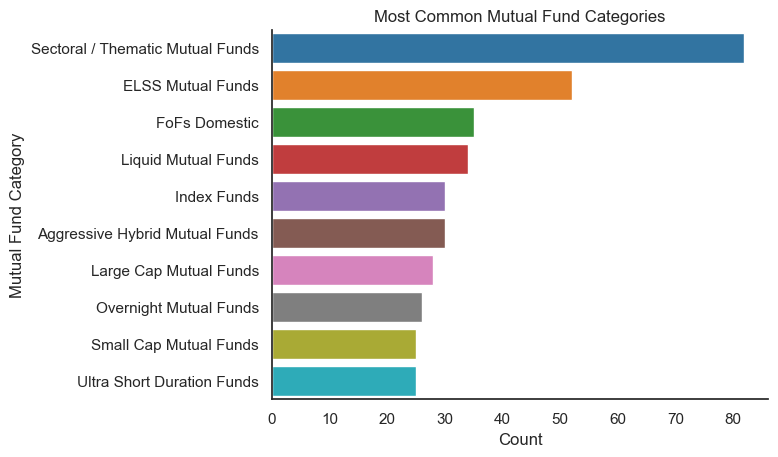

In [1687]:
sns.barplot(data=most_sub,y='Theme',x='Count')
plt.title('Most Common Mutual Fund Categories')
plt.ylabel('Mutual Fund Category')
sns.despine()


plt.show()

The graph displays the number of mutual funds by category type.

Sectoral/Thematic Mutual Funds: This category has the highest number of funds, with 82 in total. Sectoral funds focus on specific sectors of the economy, such as banking, technology, or healthcare. Thematic funds invest in companies that are part of a particular theme or trend, such as renewable energy or artificial intelligence.

ELSS Mutual Funds: The second largest category consists of 52 funds. ELSS stands for Equity Linked Saving Scheme, which is a type of mutual fund in India that provides tax benefits under Section 80C of the Income Tax Act. ELSS funds primarily invest in equity markets.

FoFS Domestic Funds: This category is the third most prevalent, comprising 35 funds. FoFS stands for Fund of Funds, which means these mutual funds invest in other mutual funds rather than directly investing in stocks or bonds. FoFS domestic funds specifically focus on domestic mutual funds. 

# Sub Category  - Part 4

In [781]:
sub_category=df.groupby('sub_category')[['sharpe','sortino','alpha','beta',
                                         'returns_5yr','sd','expense_ratio','fund_size_cr','fund_age_yr','risk_level','rating']].mean()


In [782]:
sub_category

,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
sub_category,,,,,,,,,,,
Aggressive Hybrid Mutual Funds,1.429667,3.080333,3.017667,0.813667,0.109520,12.511000,0.009447,5120.833333,8.200000,5.900000,3.000000
Arbitrage Mutual Funds,0.692273,0.881364,1.237273,0.547727,0.052235,0.709091,0.003859,3950.910909,7.818182,1.045455,2.863636
Banking and PSU Mutual Funds,0.840000,1.625882,4.210588,1.854706,0.069562,2.157059,0.002886,2794.428571,7.952381,2.476190,2.809524
Childrens Funds,1.301250,2.975000,0.651250,0.815000,0.097286,12.682500,0.013137,1170.750000,8.875000,5.750000,1.250000
Conservative Hybrid Mutual Funds,1.599412,3.312941,2.787059,0.606471,0.073412,4.668235,0.009688,1257.411765,10.000000,4.000000,3.294118
Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.000000,4.333333
Corporate Bond Mutual Funds,0.959444,1.724444,1.601667,0.779444,0.073929,2.016667,0.003121,5269.368421,7.789474,2.263158,3.157895
Credit Risk Funds,1.050000,1.847857,1.800714,-2.690714,0.047857,9.174286,0.008014,1703.928571,9.285714,4.071429,3.357143
Dividend Yield Funds,1.695000,3.743333,5.855000,0.801667,0.119200,14.628333,0.012767,1118.500000,8.833333,6.000000,0.000000


In [784]:
sharpe_sub=sub_category.sort_values(by='sharpe',ascending=False).head(10).reset_index()
sharpe_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Small Cap Mutual Funds,1.902800,3.914000,7.500400,0.824800,0.140429,18.462400,0.008272,5029.480000,7.200000,5.760000,2.600000
1,Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.000000,4.333333
2,Dividend Yield Funds,1.695000,3.743333,5.855000,0.801667,0.119200,14.628333,0.012767,1118.500000,8.833333,6.000000,0.000000
3,Mid Cap Mutual Funds,1.623478,3.356957,0.839130,0.893043,0.128909,16.712609,0.009087,7818.478261,9.260870,6.000000,3.217391
4,Conservative Hybrid Mutual Funds,1.599412,3.312941,2.787059,0.606471,0.073412,4.668235,0.009688,1257.411765,10.000000,4.000000,3.294118
5,Money Market Funds,1.590000,3.807059,2.676471,1.272353,0.061154,0.612353,0.002132,5990.631579,7.894737,2.421053,3.052632
6,Multi Cap Funds,1.537000,3.243000,4.323000,0.936000,0.138250,17.031000,0.007850,3215.300000,8.100000,6.000000,0.500000
7,Value Funds,1.534615,3.344615,4.361538,0.926923,0.105727,16.527692,0.011792,4834.285385,9.538462,6.000000,2.538462
8,Equity Savings Mutual Funds,1.501905,3.393333,2.825714,0.901429,0.080800,6.206667,0.007729,809.370000,7.428571,3.476190,3.047619
9,Ultra Short Duration Funds,1.494783,3.458261,2.194348,0.904348,0.061600,0.646522,0.003288,3390.400000,7.440000,2.240000,2.960000


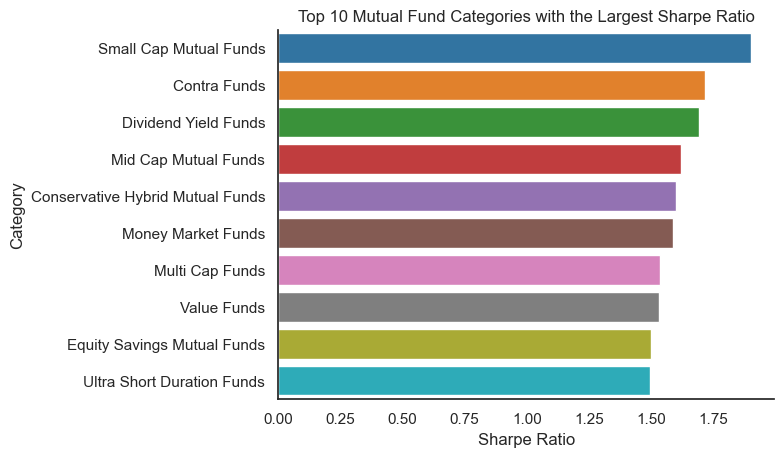

In [1688]:
sns.barplot(x='sharpe',y='sub_category',data=sharpe_sub)
plt.title('Top 10 Mutual Fund Categories with the Largest Sharpe Ratio')
plt.ylabel('Category')
plt.xlabel('Sharpe Ratio')
sns.despine()

plt.show()

In [786]:
sharpedown_sub=sub_category.sort_values(by='sharpe',ascending=True).head(10).reset_index()
sharpedown_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Overnight Mutual Funds,-0.003077,0.010385,0.598077,0.447692,0.067750,0.345769,0.000992,4460.923077,4.538462,1.038462,3.000000
1,Gilt Mutual Funds,0.479474,0.682632,0.705263,0.605789,0.075632,2.806316,0.005126,887.736842,9.947368,2.684211,3.210526
2,Medium to Long Duration Funds,0.514545,0.940000,1.378182,1.300000,0.065182,3.153636,0.006382,741.818182,10.000000,2.909091,3.000000
3,Dynamic Bond,0.595714,1.087619,1.404762,1.052857,0.072316,2.783333,0.005359,963.318182,8.863636,2.818182,3.090909
4,Arbitrage Mutual Funds,0.692273,0.881364,1.237273,0.547727,0.052235,0.709091,0.003859,3950.910909,7.818182,1.045455,2.863636
5,FoFs Overseas,0.753333,1.343333,NaN,NaN,0.099357,20.443333,0.012193,798.560000,9.333333,6.000000,0.000000
6,Medium Duration Funds,0.760833,1.271667,2.485000,0.815833,0.058000,3.685000,0.007071,1707.071429,8.428571,3.571429,3.000000
7,Liquid Mutual Funds,0.833333,3.819091,1.264242,0.719091,0.052172,0.371818,0.001671,11421.411765,9.176471,2.147059,2.970588
8,Banking and PSU Mutual Funds,0.840000,1.625882,4.210588,1.854706,0.069562,2.157059,0.002886,2794.428571,7.952381,2.476190,2.809524
9,Corporate Bond Mutual Funds,0.959444,1.724444,1.601667,0.779444,0.073929,2.016667,0.003121,5269.368421,7.789474,2.263158,3.157895


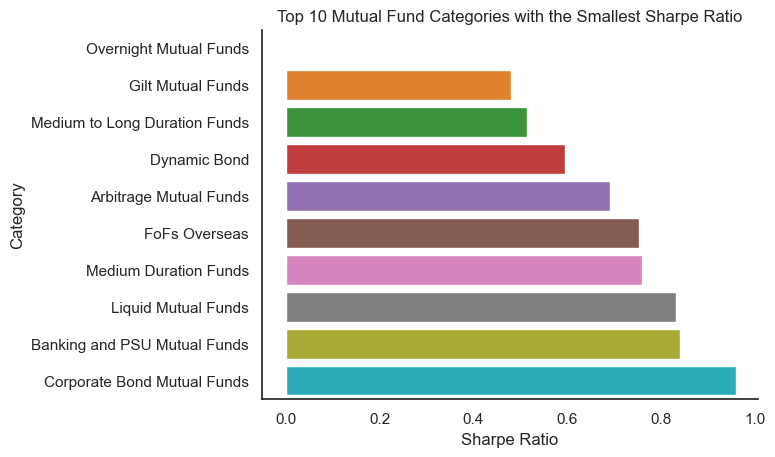

In [1689]:
sns.barplot(x='sharpe',y='sub_category',data=sharpedown_sub)
plt.title('Top 10 Mutual Fund Categories with the Smallest Sharpe Ratio')
plt.ylabel('Category')
plt.xlabel('Sharpe Ratio')
sns.despine()

plt.show()

The graph displays the subcategories with the lowest Sharpe ratios. Overnight mutual funds, in particular, exhibited an average Sharpe ratio of -0.0037. To evaluate an investment's quality, an  Sharpe ratio above 1 is considered favorable, while negative or below 1 ratios are deemed unfavorable. A negative Sharpe ratio implies that the investment incurred negative excess returns and failed to generate sufficient returns relative to the risk involved. A Sharpe ratio below 1 but above 0 indicates that the investment generated some excess returns compared to the risk taken. 

In [788]:
alpha_sub=sub_category.sort_values(by='alpha',ascending=False).head(10).reset_index()
alpha_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Fixed Maturity Plans,1.173333,3.056667,8.123333,4.283333,0.140000,3.800000,0.000450,250.250000,3.250000,2.750000,0.000000
1,Small Cap Mutual Funds,1.902800,3.914000,7.500400,0.824800,0.140429,18.462400,0.008272,5029.480000,7.200000,5.760000,2.600000
2,Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.000000,4.333333
3,Dividend Yield Funds,1.695000,3.743333,5.855000,0.801667,0.119200,14.628333,0.012767,1118.500000,8.833333,6.000000,0.000000
4,Multi Asset Allocation Mutual Funds,1.480000,3.274286,5.272857,0.742857,0.122143,12.977143,0.007957,3098.285714,10.000000,6.000000,3.142857
5,Sectoral / Thematic Mutual Funds,1.342927,2.789390,5.042949,0.780000,0.119957,18.309390,0.012421,1478.146707,8.756098,6.000000,1.487805
6,Short Duration Funds,1.041429,2.112381,4.374762,1.532381,0.064350,2.528571,0.003691,3540.652174,8.826087,2.478261,3.217391
7,Value Funds,1.534615,3.344615,4.361538,0.926923,0.105727,16.527692,0.011792,4834.285385,9.538462,6.000000,2.538462
8,Multi Cap Funds,1.537000,3.243000,4.323000,0.936000,0.138250,17.031000,0.007850,3215.300000,8.100000,6.000000,0.500000
9,Banking and PSU Mutual Funds,0.840000,1.625882,4.210588,1.854706,0.069562,2.157059,0.002886,2794.428571,7.952381,2.476190,2.809524


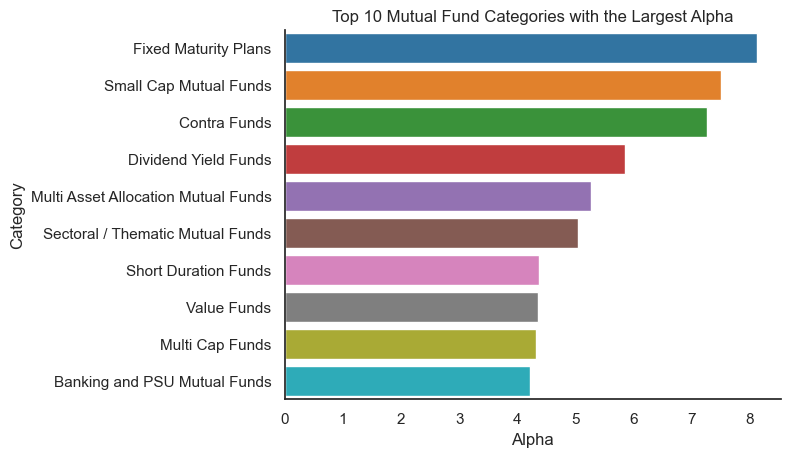

In [1690]:
sns.barplot(x='alpha',y='sub_category',data=alpha_sub)
plt.title('Top 10 Mutual Fund Categories with the Largest Alpha')
plt.ylabel('Category')
plt.xlabel('Alpha')
sns.despine()

plt.show()

According to the graph, the subcategories exhibiting the highest average alpha are Fixed Maturity Plans, Small Cap Mutual Funds, and Contra Fund. Fixed Maturity Plans achieved the highest average alpha of 8.12, indicating that the investment performed 8.12 percentage points better than the overall market. Small Cap Mutual Funds and Contra Fund also performed well, surpassing the market on average by 7.5 and 7.2 percentage points, respectively.

In [790]:
alphadown_sub=sub_category.sort_values(by='alpha',ascending=True).head(10).reset_index()
alphadown_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Index Funds,1.249000,2.978667,-1.389333,0.993333,0.112950,17.469333,0.002640,1346.079333,7.633333,6.000000,2.733333
1,Large Cap Mutual Funds,1.286429,2.948214,-0.370357,0.915714,0.113385,15.813214,0.009939,8364.928571,9.357143,6.000000,3.071429
2,Focused Funds,1.329474,2.940526,0.563158,0.926316,0.116062,16.674211,0.009405,4532.450000,7.850000,6.000000,3.200000
3,Overnight Mutual Funds,-0.003077,0.010385,0.598077,0.447692,0.067750,0.345769,0.000992,4460.923077,4.538462,1.038462,3.000000
4,Childrens Funds,1.301250,2.975000,0.651250,0.815000,0.097286,12.682500,0.013137,1170.750000,8.875000,5.750000,1.250000
5,Gilt Mutual Funds,0.479474,0.682632,0.705263,0.605789,0.075632,2.806316,0.005126,887.736842,9.947368,2.684211,3.210526
6,Retirement Funds,1.165500,2.435000,0.720000,0.746000,0.097600,9.308000,0.008980,741.150000,5.900000,5.100000,2.450000
7,Flexi Cap Funds,1.350909,2.872273,0.810455,0.895000,0.120000,16.070455,0.009432,9641.363636,8.818182,6.000000,3.227273
8,Mid Cap Mutual Funds,1.623478,3.356957,0.839130,0.893043,0.128909,16.712609,0.009087,7818.478261,9.260870,6.000000,3.217391
9,Arbitrage Mutual Funds,0.692273,0.881364,1.237273,0.547727,0.052235,0.709091,0.003859,3950.910909,7.818182,1.045455,2.863636


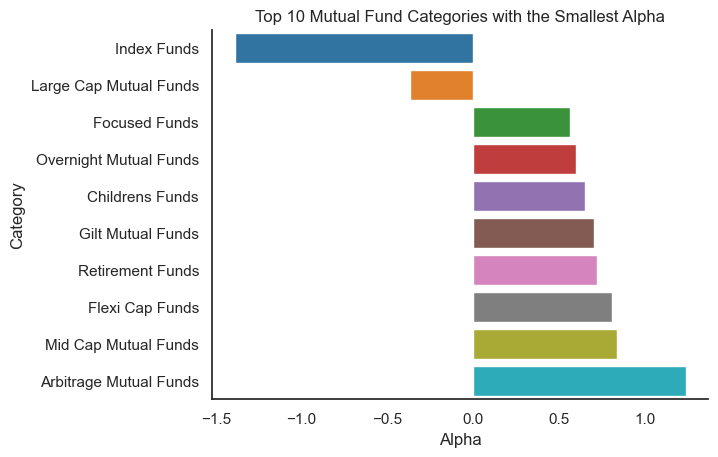

In [1691]:
sns.barplot(x='alpha',y='sub_category',data=alphadown_sub)
plt.title('Top 10 Mutual Fund Categories with the Smallest Alpha')
plt.ylabel('Category')
plt.xlabel('Alpha')
sns.despine()

plt.show()

According to the graph, the mutual fund schemes with the lowest average alpha are Index Funds and Large Cap Mutual Fund. Both of these subcategories have a negative alpha, with Index Funds having an average alpha of -1.39 and Large Cap Mutual Fund having an alpha of -0.37. This indicates that both these investments underperformed the overall market.

Additionally, other subcategories such as Children Funds, Retirement Funds, and others also had relatively small alphas, suggesting that their performance was closer to the overall market or had limited outperformance.

In [792]:
beta_sub=sub_category.sort_values(by='beta',ascending=False).head(10).reset_index()
beta_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Fixed Maturity Plans,1.173333,3.056667,8.123333,4.283333,0.140000,3.800000,0.000450,250.250000,3.250000,2.750000,0.000000
1,Banking and PSU Mutual Funds,0.840000,1.625882,4.210588,1.854706,0.069562,2.157059,0.002886,2794.428571,7.952381,2.476190,2.809524
2,Short Duration Funds,1.041429,2.112381,4.374762,1.532381,0.064350,2.528571,0.003691,3540.652174,8.826087,2.478261,3.217391
3,Medium to Long Duration Funds,0.514545,0.940000,1.378182,1.300000,0.065182,3.153636,0.006382,741.818182,10.000000,2.909091,3.000000
4,Money Market Funds,1.590000,3.807059,2.676471,1.272353,0.061154,0.612353,0.002132,5990.631579,7.894737,2.421053,3.052632
5,Floater Mutual Funds,1.467143,2.725714,3.520000,1.110000,0.068400,1.444286,0.002836,5096.272727,6.000000,2.181818,3.000000
6,Dynamic Bond,0.595714,1.087619,1.404762,1.052857,0.072316,2.783333,0.005359,963.318182,8.863636,2.818182,3.090909
7,Index Funds,1.249000,2.978667,-1.389333,0.993333,0.112950,17.469333,0.002640,1346.079333,7.633333,6.000000,2.733333
8,ELSS Mutual Funds,1.464510,3.156667,3.447059,0.974510,0.117733,16.010392,0.011242,2810.384615,8.115385,5.730769,1.980769
9,Multi Cap Funds,1.537000,3.243000,4.323000,0.936000,0.138250,17.031000,0.007850,3215.300000,8.100000,6.000000,0.500000


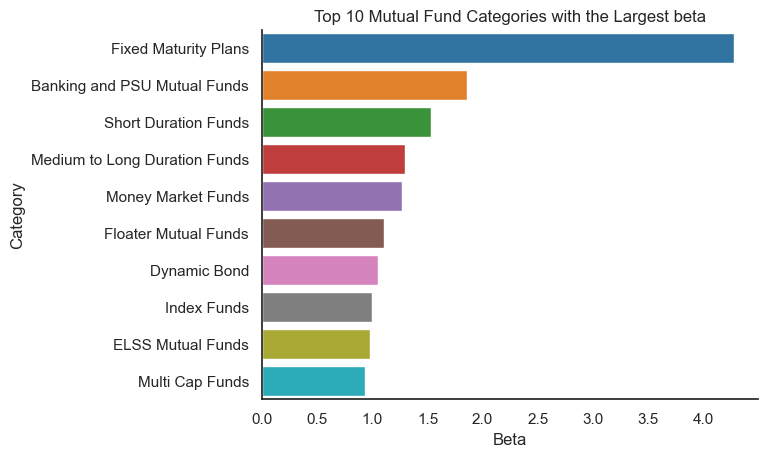

In [1693]:
sns.barplot(x='beta',y='sub_category',data=beta_sub)
plt.title('Top 10 Mutual Fund Categories with the Largest beta')
plt.ylabel('Category')
plt.xlabel('Beta')
sns.despine()

plt.show()


According to the graph, the subcategories with the largest average beta are indicated. Beta is a measure of the sensitivity of an investment's returns to market movements. A large beta suggests that the investment is highly sensitive to changes in the overall market.

In this specific case, Fixed Maturity Plans have an average beta of 4. This means that for every 1% change in the market, the Fixed Maturity Plans have a corresponding 4% change. This high beta value indicates that Fixed Maturity Plans are highly volatile and have a significant level of systematic risk. 

In [1299]:
betadown_sub=sub_category.sort_values(by='beta',ascending=True).head(10).reset_index()
betadown_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Credit Risk Funds,1.050000,1.847857,1.800714,-2.690714,0.047857,9.174286,0.008014,1703.928571,9.285714,4.071429,3.357143
1,Overnight Mutual Funds,-0.003077,0.010385,0.598077,0.447692,0.067750,0.345769,0.000992,4460.923077,4.538462,1.038462,3.000000
2,Arbitrage Mutual Funds,0.692273,0.881364,1.237273,0.547727,0.052235,0.709091,0.003859,3950.910909,7.818182,1.045455,2.863636
3,Dynamic Asset Allocation or Balanced Advantage,1.312632,3.146316,1.421053,0.585789,0.086500,9.354737,0.007805,8348.421053,7.631579,5.263158,2.894737
4,Gilt Mutual Funds,0.479474,0.682632,0.705263,0.605789,0.075632,2.806316,0.005126,887.736842,9.947368,2.684211,3.210526
5,Conservative Hybrid Mutual Funds,1.599412,3.312941,2.787059,0.606471,0.073412,4.668235,0.009688,1257.411765,10.000000,4.000000,3.294118
6,Liquid Mutual Funds,0.833333,3.819091,1.264242,0.719091,0.052172,0.371818,0.001671,11421.411765,9.176471,2.147059,2.970588
7,FoFs Domestic,1.098824,2.403529,2.192647,0.725294,0.106833,11.536176,0.002949,965.142857,9.142857,4.771429,2.828571
8,Multi Asset Allocation Mutual Funds,1.480000,3.274286,5.272857,0.742857,0.122143,12.977143,0.007957,3098.285714,10.000000,6.000000,3.142857
9,Retirement Funds,1.165500,2.435000,0.720000,0.746000,0.097600,9.308000,0.008980,741.150000,5.900000,5.100000,2.450000


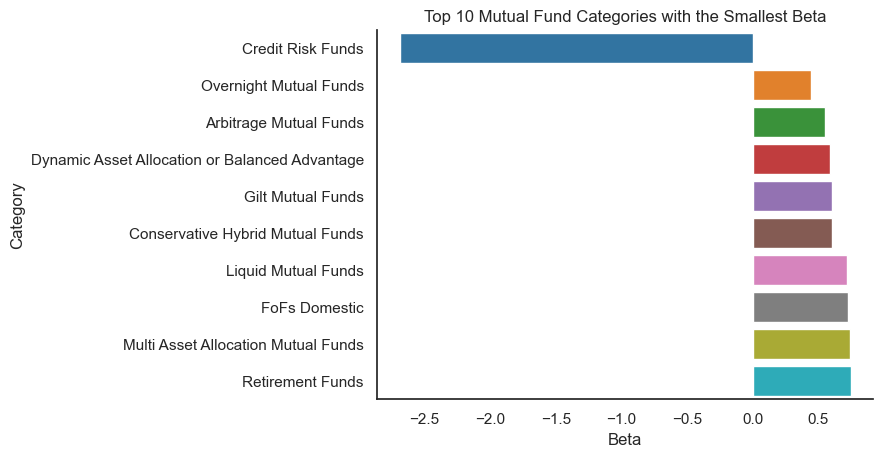

In [1694]:
sns.barplot(x='beta',y='sub_category',data=betadown_sub)
plt.title('Top 10 Mutual Fund Categories with the Smallest Beta')
plt.ylabel('Category')
plt.xlabel('Beta')
sns.despine()

plt.show()

Credit Risk Funds have on average a negative beta of 2.67. A negative beta indicates an inverse relationship with the overall market. In this case, it means that when the market experiences a percentage increase, Credit Risk Funds tend experience a loss 2.67%. This negative correlation suggests that Credit Risk Funds move in the opposite direction of the overall market.

On the other hand, the other subcategories mentioned in the list have small betas, indicating a lower level of sensitivity to market changes. A small beta suggests a lower level of systematic risk, meaning that the performance of these subcategories is expected to be less influenced by market movements compared to investments with higher betas.

In [796]:
sd_sub=sub_category.sort_values(by='sd',ascending=False).head(10).reset_index()
sd_sub 

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,FoFs Overseas,0.753333,1.343333,NaN,NaN,0.099357,20.443333,0.012193,798.560000,9.333333,6.00,0.000000
1,Small Cap Mutual Funds,1.902800,3.914000,7.500400,0.824800,0.140429,18.462400,0.008272,5029.480000,7.200000,5.76,2.600000
2,Sectoral / Thematic Mutual Funds,1.342927,2.789390,5.042949,0.780000,0.119957,18.309390,0.012421,1478.146707,8.756098,6.00,1.487805
3,Index Funds,1.249000,2.978667,-1.389333,0.993333,0.112950,17.469333,0.002640,1346.079333,7.633333,6.00,2.733333
4,Multi Cap Funds,1.537000,3.243000,4.323000,0.936000,0.138250,17.031000,0.007850,3215.300000,8.100000,6.00,0.500000
5,Mid Cap Mutual Funds,1.623478,3.356957,0.839130,0.893043,0.128909,16.712609,0.009087,7818.478261,9.260870,6.00,3.217391
6,Focused Funds,1.329474,2.940526,0.563158,0.926316,0.116062,16.674211,0.009405,4532.450000,7.850000,6.00,3.200000
7,Value Funds,1.534615,3.344615,4.361538,0.926923,0.105727,16.527692,0.011792,4834.285385,9.538462,6.00,2.538462
8,Large & Mid Cap Funds,1.472917,3.155833,3.192500,0.906250,0.119579,16.288750,0.009275,5146.166667,8.416667,6.00,3.166667
9,Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.00,4.333333


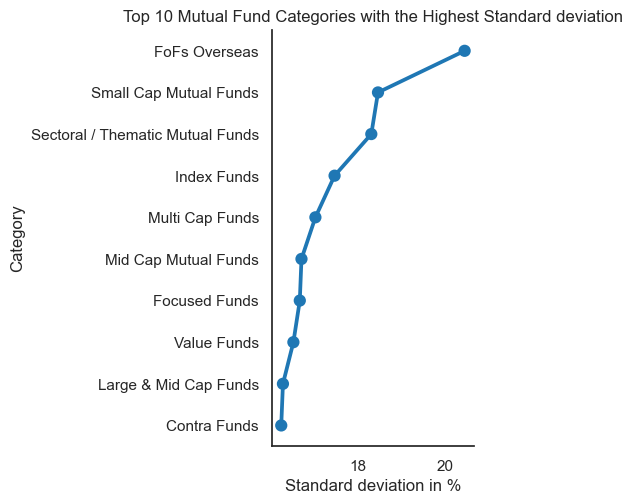

In [1695]:
sns.catplot(x='sd',y='sub_category',data=sd_sub,kind='point')
plt.title('Top 10 Mutual Fund Categories with the Highest Standard deviation')
plt.ylabel('Category')
plt.xlabel('Standard deviation in %')
sns.despine()

plt.show()

The Point plot highlights the most volatile subcategories in the dataset, with FOFS Overseas having the highest average standard deviation of 20.43% among all the subcategories. Standard deviation is a measure of volatility, indicating the extent of price fluctuations or variability in returns.

For risk-averse investors who prefer stability and are not comfortable with high levels of volatility, it is advisable to avoid funds that specialize in these categories. The high standard deviation suggests that FOFS Overseas experiences significant price movements or fluctuations, which may result in larger potential gains or losses.

In [798]:
sddown_sub=sub_category.sort_values(by='sd',ascending=True).head(10).reset_index()
sddown_sub 

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Overnight Mutual Funds,-0.003077,0.010385,0.598077,0.447692,0.067750,0.345769,0.000992,4460.923077,4.538462,1.038462,3.000000
1,Liquid Mutual Funds,0.833333,3.819091,1.264242,0.719091,0.052172,0.371818,0.001671,11421.411765,9.176471,2.147059,2.970588
2,Money Market Funds,1.590000,3.807059,2.676471,1.272353,0.061154,0.612353,0.002132,5990.631579,7.894737,2.421053,3.052632
3,Ultra Short Duration Funds,1.494783,3.458261,2.194348,0.904348,0.061600,0.646522,0.003288,3390.400000,7.440000,2.240000,2.960000
4,Arbitrage Mutual Funds,0.692273,0.881364,1.237273,0.547727,0.052235,0.709091,0.003859,3950.910909,7.818182,1.045455,2.863636
5,Floater Mutual Funds,1.467143,2.725714,3.520000,1.110000,0.068400,1.444286,0.002836,5096.272727,6.000000,2.181818,3.000000
6,Low Duration Funds,1.332500,3.576000,2.915000,0.764500,0.057350,1.830000,0.003470,4285.600000,9.700000,2.250000,3.000000
7,Corporate Bond Mutual Funds,0.959444,1.724444,1.601667,0.779444,0.073929,2.016667,0.003121,5269.368421,7.789474,2.263158,3.157895
8,Banking and PSU Mutual Funds,0.840000,1.625882,4.210588,1.854706,0.069562,2.157059,0.002886,2794.428571,7.952381,2.476190,2.809524
9,Short Duration Funds,1.041429,2.112381,4.374762,1.532381,0.064350,2.528571,0.003691,3540.652174,8.826087,2.478261,3.217391


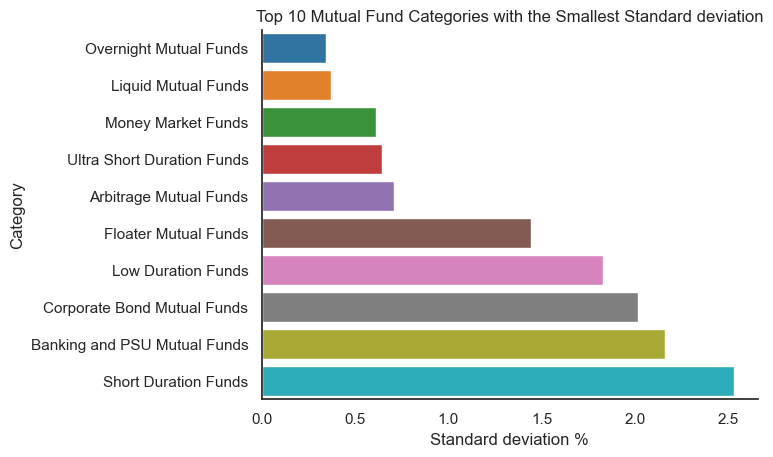

In [1696]:
sns.barplot(x='sd',y='sub_category',data=sddown_sub)
plt.title('Top 10 Mutual Fund Categories with the Smallest Standard deviation')
plt.ylabel('Category')
plt.xlabel('Standard deviation %')
sns.despine()

plt.show()


According to the graph, the subcategories with the lowest volatility are highlighted. Overnight Mutual Funds have the lowest average standard deviation of only 0.34%, indicating a very low level of volatility. Additionally, Liquid Mutual Funds and Money Market Funds also experienced relatively low levels of volatility.

For very risk-averse investors who prioritize stability and capital preservation, these subcategories can be interesting options. The low standard deviation suggests that these investments have minimal price fluctuations or variability in returns, providing a higher level of stability compared to more volatile investments.

In [800]:
returns5yr_sub=sub_category.sort_values(by='returns_5yr',ascending=False).head(10).reset_index()
returns5yr_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Small Cap Mutual Funds,1.902800,3.914000,7.500400,0.824800,0.140429,18.462400,0.008272,5029.480000,7.200000,5.76,2.600000
1,Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.00,4.333333
2,Fixed Maturity Plans,1.173333,3.056667,8.123333,4.283333,0.140000,3.800000,0.000450,250.250000,3.250000,2.75,0.000000
3,Multi Cap Funds,1.537000,3.243000,4.323000,0.936000,0.138250,17.031000,0.007850,3215.300000,8.100000,6.00,0.500000
4,Mid Cap Mutual Funds,1.623478,3.356957,0.839130,0.893043,0.128909,16.712609,0.009087,7818.478261,9.260870,6.00,3.217391
5,Multi Asset Allocation Mutual Funds,1.480000,3.274286,5.272857,0.742857,0.122143,12.977143,0.007957,3098.285714,10.000000,6.00,3.142857
6,Flexi Cap Funds,1.350909,2.872273,0.810455,0.895000,0.120000,16.070455,0.009432,9641.363636,8.818182,6.00,3.227273
7,Sectoral / Thematic Mutual Funds,1.342927,2.789390,5.042949,0.780000,0.119957,18.309390,0.012421,1478.146707,8.756098,6.00,1.487805
8,Large & Mid Cap Funds,1.472917,3.155833,3.192500,0.906250,0.119579,16.288750,0.009275,5146.166667,8.416667,6.00,3.166667
9,Dividend Yield Funds,1.695000,3.743333,5.855000,0.801667,0.119200,14.628333,0.012767,1118.500000,8.833333,6.00,0.000000


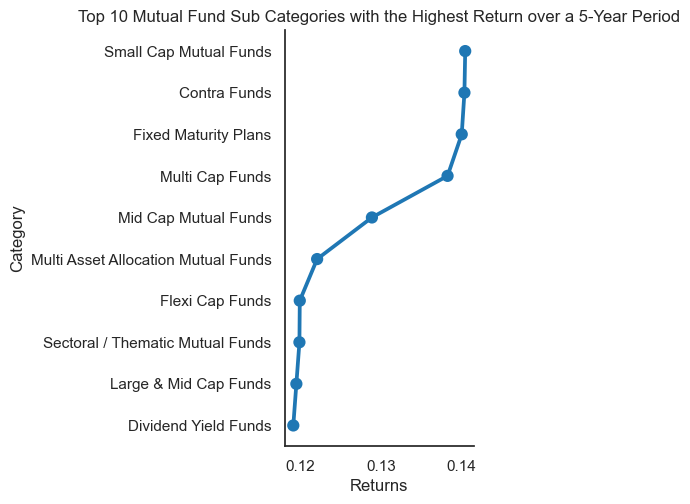

In [1698]:
sns.catplot(x='returns_5yr',y='sub_category',data=returns5yr_sub,kind='point')
plt.title('Top 10 Mutual Fund Sub Categories with the Highest Return over a 5-Year Period')
plt.ylabel('Category')
plt.xlabel('Returns')
sns.despine()

plt.show()

The chart illustrates the top ten subcategories exhibiting the highest average returns over a span of five years. Investors who allocated their funds to a small-cap mutual fund experienced on average a return of 14.05% during this period. Contra Funds ranked second in terms of five-year returns, generating an average rate of 14.03%. Fixed Maturity Plans proved fruitful for investors, yielding a return of 14% over the course of five years.

In [802]:
expense_sub=sub_category.sort_values(by='expense_ratio',ascending=False).head(10).reset_index()
expense_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Childrens Funds,1.301250,2.975000,0.651250,0.815000,0.097286,12.682500,0.013137,1170.750000,8.875000,5.750000,1.250000
1,Dividend Yield Funds,1.695000,3.743333,5.855000,0.801667,0.119200,14.628333,0.012767,1118.500000,8.833333,6.000000,0.000000
2,Sectoral / Thematic Mutual Funds,1.342927,2.789390,5.042949,0.780000,0.119957,18.309390,0.012421,1478.146707,8.756098,6.000000,1.487805
3,FoFs Overseas,0.753333,1.343333,NaN,NaN,0.099357,20.443333,0.012193,798.560000,9.333333,6.000000,0.000000
4,Value Funds,1.534615,3.344615,4.361538,0.926923,0.105727,16.527692,0.011792,4834.285385,9.538462,6.000000,2.538462
5,ELSS Mutual Funds,1.464510,3.156667,3.447059,0.974510,0.117733,16.010392,0.011242,2810.384615,8.115385,5.730769,1.980769
6,Large Cap Mutual Funds,1.286429,2.948214,-0.370357,0.915714,0.113385,15.813214,0.009939,8364.928571,9.357143,6.000000,3.071429
7,Conservative Hybrid Mutual Funds,1.599412,3.312941,2.787059,0.606471,0.073412,4.668235,0.009688,1257.411765,10.000000,4.000000,3.294118
8,Aggressive Hybrid Mutual Funds,1.429667,3.080333,3.017667,0.813667,0.109520,12.511000,0.009447,5120.833333,8.200000,5.900000,3.000000
9,Flexi Cap Funds,1.350909,2.872273,0.810455,0.895000,0.120000,16.070455,0.009432,9641.363636,8.818182,6.000000,3.227273


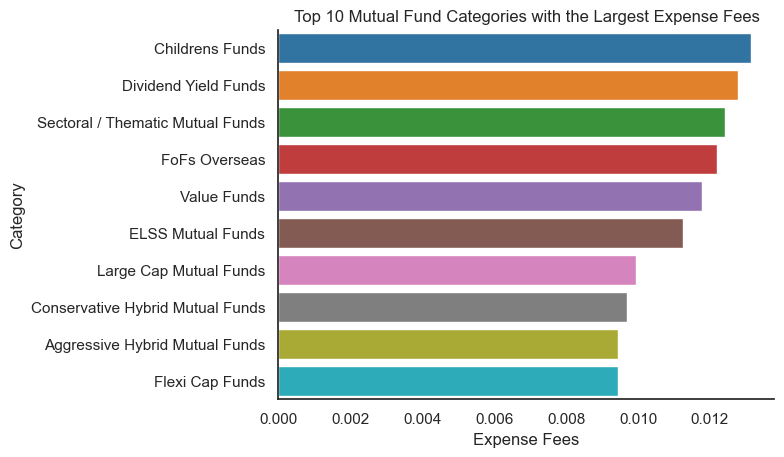

In [1699]:
sns.barplot(x='expense_ratio',y='sub_category',data=expense_sub)
plt.title('Top 10 Mutual Fund Categories with the Largest Expense Fees')
plt.ylabel('Category')
plt.xlabel('Expense Fees')
sns.despine()

plt.show()

The bar graph illustrates the top ten mutual fund subcategories with the highest average expense fees. Among them, Children Funds and Dividend Yield Funds stand out with average expense fees of 1.3% and 1.27% respectively.

In [804]:
expensedown_sub=sub_category.sort_values(by='expense_ratio',ascending=True).head(10).reset_index()
expensedown_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Fixed Maturity Plans,1.173333,3.056667,8.123333,4.283333,0.140000,3.800000,0.000450,250.250000,3.250000,2.750000,0.000000
1,Overnight Mutual Funds,-0.003077,0.010385,0.598077,0.447692,0.067750,0.345769,0.000992,4460.923077,4.538462,1.038462,3.000000
2,Liquid Mutual Funds,0.833333,3.819091,1.264242,0.719091,0.052172,0.371818,0.001671,11421.411765,9.176471,2.147059,2.970588
3,Money Market Funds,1.590000,3.807059,2.676471,1.272353,0.061154,0.612353,0.002132,5990.631579,7.894737,2.421053,3.052632
4,Index Funds,1.249000,2.978667,-1.389333,0.993333,0.112950,17.469333,0.002640,1346.079333,7.633333,6.000000,2.733333
5,Floater Mutual Funds,1.467143,2.725714,3.520000,1.110000,0.068400,1.444286,0.002836,5096.272727,6.000000,2.181818,3.000000
6,Banking and PSU Mutual Funds,0.840000,1.625882,4.210588,1.854706,0.069562,2.157059,0.002886,2794.428571,7.952381,2.476190,2.809524
7,FoFs Domestic,1.098824,2.403529,2.192647,0.725294,0.106833,11.536176,0.002949,965.142857,9.142857,4.771429,2.828571
8,Corporate Bond Mutual Funds,0.959444,1.724444,1.601667,0.779444,0.073929,2.016667,0.003121,5269.368421,7.789474,2.263158,3.157895
9,Ultra Short Duration Funds,1.494783,3.458261,2.194348,0.904348,0.061600,0.646522,0.003288,3390.400000,7.440000,2.240000,2.960000


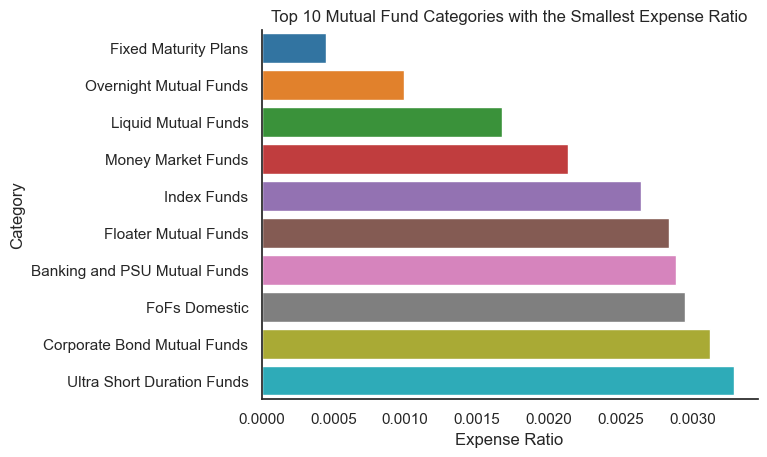

In [1701]:
sns.barplot(x='expense_ratio',y='sub_category',data=expensedown_sub)
plt.title('Top 10 Mutual Fund Categories with the Smallest Expense Ratio')
plt.ylabel('Category')
plt.xlabel('Expense Ratio')
sns.despine()

plt.show()


Fixed Maturity Plans Mutual Fund scheme stands out as the subcategory with the lowest average expense fees, amounting to 0.045%. Additional subcategories, such as overnight mutual funds, liquid mutual funds, and money market funds, also charge relatively low average expense fees, with rates of 0.09%, 0.16%, and 0.21% respectively. In general, the average expense fees across all subcategories amount to 0.6%.

In [1523]:
sub_category['expense_ratio'].mean()

0.0068988499524837215

In [807]:
fundsize_sub=sub_category.sort_values(by='fund_size_cr',ascending=False).head(10).reset_index()
fundsize_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Liquid Mutual Funds,0.833333,3.819091,1.264242,0.719091,0.052172,0.371818,0.001671,11421.411765,9.176471,2.147059,2.970588
1,Flexi Cap Funds,1.350909,2.872273,0.810455,0.895000,0.120000,16.070455,0.009432,9641.363636,8.818182,6.000000,3.227273
2,Large Cap Mutual Funds,1.286429,2.948214,-0.370357,0.915714,0.113385,15.813214,0.009939,8364.928571,9.357143,6.000000,3.071429
3,Dynamic Asset Allocation or Balanced Advantage,1.312632,3.146316,1.421053,0.585789,0.086500,9.354737,0.007805,8348.421053,7.631579,5.263158,2.894737
4,Mid Cap Mutual Funds,1.623478,3.356957,0.839130,0.893043,0.128909,16.712609,0.009087,7818.478261,9.260870,6.000000,3.217391
5,Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.000000,4.333333
6,Money Market Funds,1.590000,3.807059,2.676471,1.272353,0.061154,0.612353,0.002132,5990.631579,7.894737,2.421053,3.052632
7,Corporate Bond Mutual Funds,0.959444,1.724444,1.601667,0.779444,0.073929,2.016667,0.003121,5269.368421,7.789474,2.263158,3.157895
8,Large & Mid Cap Funds,1.472917,3.155833,3.192500,0.906250,0.119579,16.288750,0.009275,5146.166667,8.416667,6.000000,3.166667
9,Aggressive Hybrid Mutual Funds,1.429667,3.080333,3.017667,0.813667,0.109520,12.511000,0.009447,5120.833333,8.200000,5.900000,3.000000


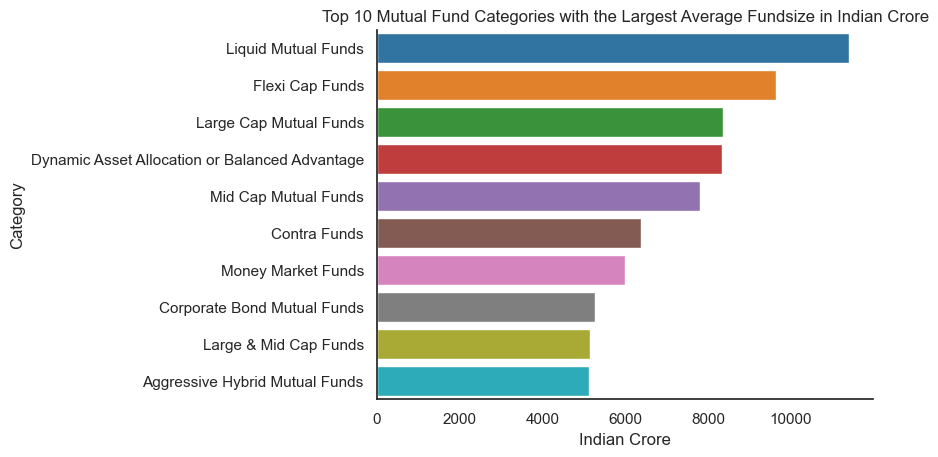

In [1702]:
sns.barplot(x='fund_size_cr',y='sub_category',data=fundsize_sub)
plt.title('Top 10 Mutual Fund Categories with the Largest Average Fundsize in Indian Crore')
plt.ylabel('Category')
plt.xlabel('Indian Crore')
sns.despine()

plt.show()

In [809]:
risklevel_sub=sub_category.sort_values(by='risk_level',ascending=False).head(15).reset_index()
risklevel_sub 

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Value Funds,1.534615,3.344615,4.361538,0.926923,0.105727,16.527692,0.011792,4834.285385,9.538462,6.00,2.538462
1,Flexi Cap Funds,1.350909,2.872273,0.810455,0.895000,0.120000,16.070455,0.009432,9641.363636,8.818182,6.00,3.227273
2,Sectoral / Thematic Mutual Funds,1.342927,2.789390,5.042949,0.780000,0.119957,18.309390,0.012421,1478.146707,8.756098,6.00,1.487805
3,Multi Cap Funds,1.537000,3.243000,4.323000,0.936000,0.138250,17.031000,0.007850,3215.300000,8.100000,6.00,0.500000
4,Multi Asset Allocation Mutual Funds,1.480000,3.274286,5.272857,0.742857,0.122143,12.977143,0.007957,3098.285714,10.000000,6.00,3.142857
5,Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.00,4.333333
6,Mid Cap Mutual Funds,1.623478,3.356957,0.839130,0.893043,0.128909,16.712609,0.009087,7818.478261,9.260870,6.00,3.217391
7,Large Cap Mutual Funds,1.286429,2.948214,-0.370357,0.915714,0.113385,15.813214,0.009939,8364.928571,9.357143,6.00,3.071429
8,Dividend Yield Funds,1.695000,3.743333,5.855000,0.801667,0.119200,14.628333,0.012767,1118.500000,8.833333,6.00,0.000000
9,Large & Mid Cap Funds,1.472917,3.155833,3.192500,0.906250,0.119579,16.288750,0.009275,5146.166667,8.416667,6.00,3.166667


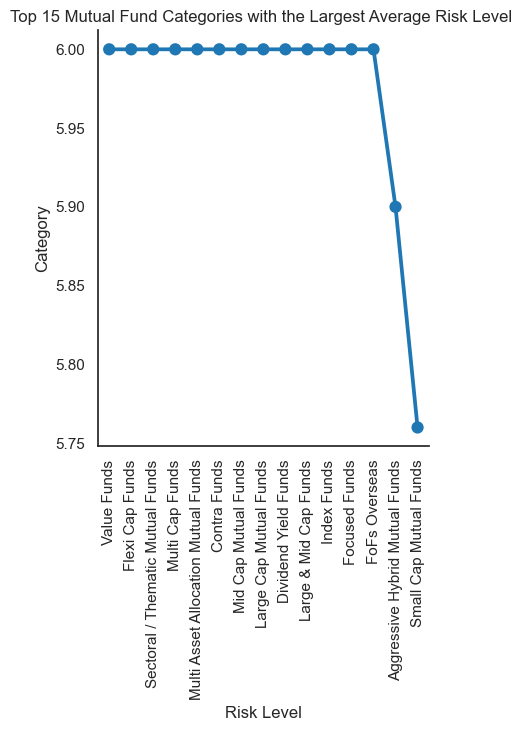

In [1703]:
sns.catplot(y='risk_level',x='sub_category',data=risklevel_sub,kind='point')
plt.title('Top 15 Mutual Fund Categories with the Largest Average Risk Level ')
plt.ylabel('Category')
plt.xlabel('Risk Level')
sns.despine()
plt.xticks(rotation=90)
plt.show()

In [811]:
riskleveldown_sub=sub_category.sort_values(by='risk_level',ascending=True).head(15).reset_index()
riskleveldown_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Overnight Mutual Funds,-0.003077,0.010385,0.598077,0.447692,0.067750,0.345769,0.000992,4460.923077,4.538462,1.038462,3.000000
1,Arbitrage Mutual Funds,0.692273,0.881364,1.237273,0.547727,0.052235,0.709091,0.003859,3950.910909,7.818182,1.045455,2.863636
2,Liquid Mutual Funds,0.833333,3.819091,1.264242,0.719091,0.052172,0.371818,0.001671,11421.411765,9.176471,2.147059,2.970588
3,Floater Mutual Funds,1.467143,2.725714,3.520000,1.110000,0.068400,1.444286,0.002836,5096.272727,6.000000,2.181818,3.000000
4,Ultra Short Duration Funds,1.494783,3.458261,2.194348,0.904348,0.061600,0.646522,0.003288,3390.400000,7.440000,2.240000,2.960000
5,Low Duration Funds,1.332500,3.576000,2.915000,0.764500,0.057350,1.830000,0.003470,4285.600000,9.700000,2.250000,3.000000
6,Corporate Bond Mutual Funds,0.959444,1.724444,1.601667,0.779444,0.073929,2.016667,0.003121,5269.368421,7.789474,2.263158,3.157895
7,Money Market Funds,1.590000,3.807059,2.676471,1.272353,0.061154,0.612353,0.002132,5990.631579,7.894737,2.421053,3.052632
8,Banking and PSU Mutual Funds,0.840000,1.625882,4.210588,1.854706,0.069562,2.157059,0.002886,2794.428571,7.952381,2.476190,2.809524
9,Short Duration Funds,1.041429,2.112381,4.374762,1.532381,0.064350,2.528571,0.003691,3540.652174,8.826087,2.478261,3.217391


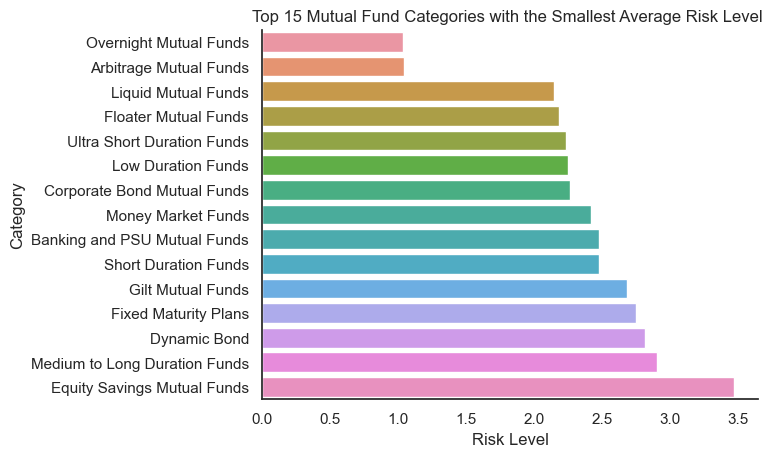

In [1704]:
sns.barplot(x='risk_level',y='sub_category',data=riskleveldown_sub)
plt.title('Top 15 Mutual Fund Categories with the Smallest Average Risk Level ')
plt.ylabel('Category')
plt.xlabel('Risk Level')
sns.despine()

plt.show()

In [813]:
rating_sub=sub_category.sort_values(by='rating',ascending=False).head(10).reset_index()
rating_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,Contra Funds,1.716667,3.760000,7.256667,0.916667,0.140333,16.250000,0.007800,6375.666667,10.000000,6.000000,4.333333
1,Credit Risk Funds,1.050000,1.847857,1.800714,-2.690714,0.047857,9.174286,0.008014,1703.928571,9.285714,4.071429,3.357143
2,Conservative Hybrid Mutual Funds,1.599412,3.312941,2.787059,0.606471,0.073412,4.668235,0.009688,1257.411765,10.000000,4.000000,3.294118
3,Flexi Cap Funds,1.350909,2.872273,0.810455,0.895000,0.120000,16.070455,0.009432,9641.363636,8.818182,6.000000,3.227273
4,Short Duration Funds,1.041429,2.112381,4.374762,1.532381,0.064350,2.528571,0.003691,3540.652174,8.826087,2.478261,3.217391
5,Mid Cap Mutual Funds,1.623478,3.356957,0.839130,0.893043,0.128909,16.712609,0.009087,7818.478261,9.260870,6.000000,3.217391
6,Gilt Mutual Funds,0.479474,0.682632,0.705263,0.605789,0.075632,2.806316,0.005126,887.736842,9.947368,2.684211,3.210526
7,Focused Funds,1.329474,2.940526,0.563158,0.926316,0.116062,16.674211,0.009405,4532.450000,7.850000,6.000000,3.200000
8,Large & Mid Cap Funds,1.472917,3.155833,3.192500,0.906250,0.119579,16.288750,0.009275,5146.166667,8.416667,6.000000,3.166667
9,Corporate Bond Mutual Funds,0.959444,1.724444,1.601667,0.779444,0.073929,2.016667,0.003121,5269.368421,7.789474,2.263158,3.157895


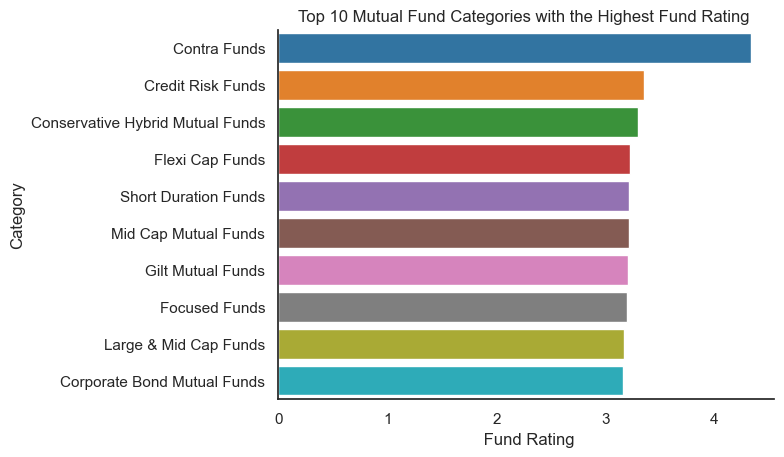

In [1705]:
sns.barplot(x='rating',y='sub_category',data=rating_sub)
plt.title('Top 10 Mutual Fund Categories with the Highest Fund Rating ')
plt.ylabel('Category')
plt.xlabel(' Fund Rating')
sns.despine()

plt.show()

In [815]:
ratingdown_sub=sub_category.sort_values(by='rating',ascending=True).head(10).reset_index()
ratingdown_sub

,sub_category,sharpe,sortino,alpha,beta,returns_5yr,sd,expense_ratio,fund_size_cr,fund_age_yr,risk_level,rating
0,FoFs Overseas,0.753333,1.343333,NaN,NaN,0.099357,20.443333,0.012193,798.560000,9.333333,6.000000,0.000000
1,Fixed Maturity Plans,1.173333,3.056667,8.123333,4.283333,0.140000,3.800000,0.000450,250.250000,3.250000,2.750000,0.000000
2,Dividend Yield Funds,1.695000,3.743333,5.855000,0.801667,0.119200,14.628333,0.012767,1118.500000,8.833333,6.000000,0.000000
3,Multi Cap Funds,1.537000,3.243000,4.323000,0.936000,0.138250,17.031000,0.007850,3215.300000,8.100000,6.000000,0.500000
4,Childrens Funds,1.301250,2.975000,0.651250,0.815000,0.097286,12.682500,0.013137,1170.750000,8.875000,5.750000,1.250000
5,Sectoral / Thematic Mutual Funds,1.342927,2.789390,5.042949,0.780000,0.119957,18.309390,0.012421,1478.146707,8.756098,6.000000,1.487805
6,ELSS Mutual Funds,1.464510,3.156667,3.447059,0.974510,0.117733,16.010392,0.011242,2810.384615,8.115385,5.730769,1.980769
7,Retirement Funds,1.165500,2.435000,0.720000,0.746000,0.097600,9.308000,0.008980,741.150000,5.900000,5.100000,2.450000
8,Value Funds,1.534615,3.344615,4.361538,0.926923,0.105727,16.527692,0.011792,4834.285385,9.538462,6.000000,2.538462
9,Small Cap Mutual Funds,1.902800,3.914000,7.500400,0.824800,0.140429,18.462400,0.008272,5029.480000,7.200000,5.760000,2.600000


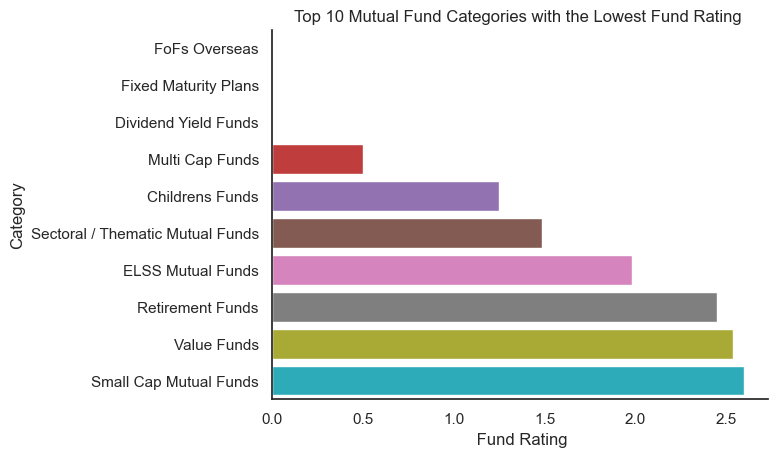

In [1706]:
sns.barplot(x='rating',y='sub_category',data=ratingdown_sub)
plt.title('Top 10 Mutual Fund Categories with the Lowest Fund Rating ')
plt.ylabel('Category')
plt.xlabel(' Fund Rating')
sns.despine()

plt.show()

# Relationship Analysis  - Part 5

## Risk Level 

In [481]:
df.groupby('risk_level_cat')[['returns_1yr','returns_3yr','returns_5yr']].mean()


,returns_1yr,returns_3yr,returns_5yr
risk_level_cat,,,
High,0.072778,0.148704,0.103560
Low_Risk,0.052774,0.046943,0.054455
Low_to_moderate,0.051646,0.066622,0.062755
Moderate,0.049008,0.069275,0.067467
Moderately_high,0.061692,0.145138,0.082509
Very_high,0.025148,0.276405,0.116169


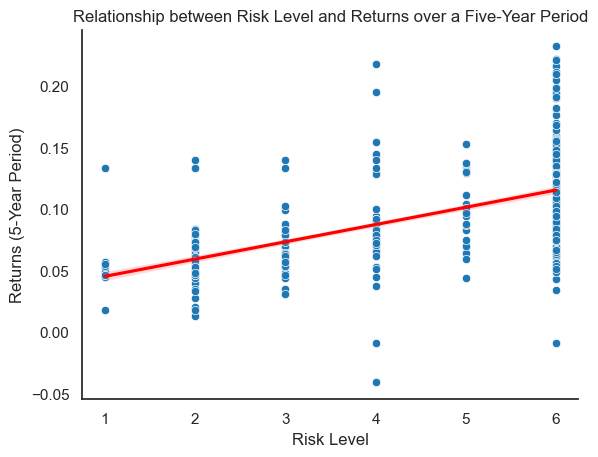

In [1707]:
sns.scatterplot(data=df,x='risk_level',y='returns_5yr')
sns.regplot(data=df, x='risk_level', y='returns_5yr', scatter=False,color='red')
plt.title('Relationship between Risk Level and Returns over a Five-Year Period')
plt.xlabel('Risk Level')
plt.ylabel('Returns (5-Year Period)')
sns.despine()


plt.show() 

The scatterplot visualizes the correlation between the risk level and returns of a mutual fund scheme spanning five years. The correlation coefficient of 0.65% suggests a moderate relationship between the two variables. It indicates that as the level of risk increases, the returns also tend to be higher. However, it's important to note that the relationship between risk level and returns is not particularly strong.

In [822]:
df['risk_level'].corr(df['returns_5yr'])

0.6455210896596403

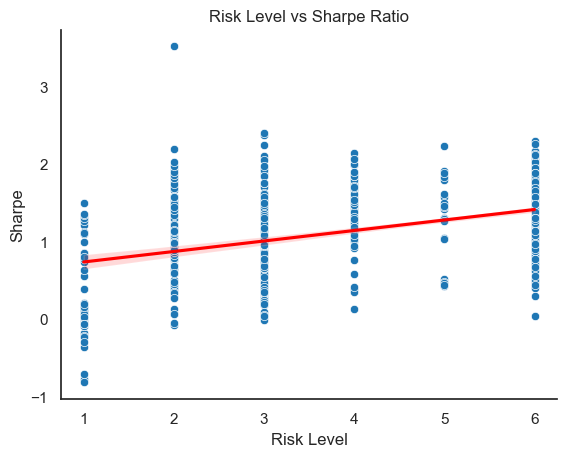

In [1708]:
sns.scatterplot(data=df,x='risk_level',y='sharpe')
sns.regplot(data=df,x='risk_level',y='sharpe',color='red',scatter=False)
plt.title('Risk Level vs Sharpe Ratio')
plt.ylabel('Sharpe')
plt.xlabel('Risk Level')
sns.despine()

plt.show()

The scatterplot presented depicts the relationship between the risk level and the Sharpe ratio within a dataset of over 800 mutual fund schemes. The correlation coefficient of 0.455 indicates a moderate positive relationship between the risk level and the Sharpe ratio. It is observed that riskier investments generally exhibit higher expected returns, which serves as a form of compensation for the additional risk undertaken. The Sharpe ratio, representing the excess return for each unit of risk, further supports this intuition. However, upon analyzing the data, it was determined that there is no strong linear relationship between the risk level and the Sharpe ratio.

In [826]:
df['risk_level'].corr(df['sharpe']) 

0.4554818056735224

# Fund Rating - Part 5

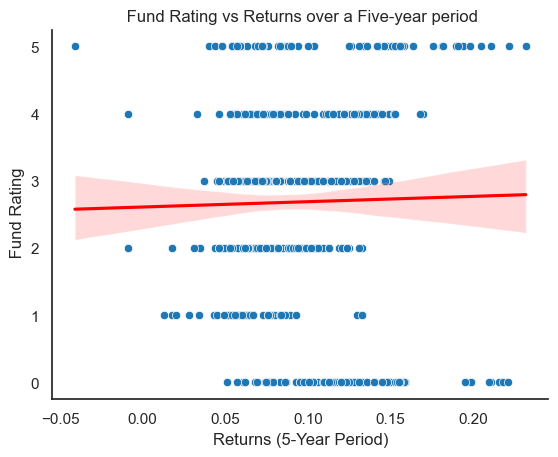

In [1711]:
sns.scatterplot(data=df,y='rating',x='returns_5yr')
sns.regplot(data=df,y='rating',x='returns_5yr',color='red',scatter=False)


plt.title(' Fund Rating vs Returns over a Five-year period')
plt.xlabel('Returns (5-Year Period)')
plt.ylabel(' Fund Rating')
sns.despine()

plt.show()

The scatterplot depicts the relationship between the return of a mutual fund scheme over a five-year period and its fund rating. It's important to note that the dataset used for this analysis did not provide specific criteria for the fund rating or the entity responsible for assigning the ratings. In an attempt to predict the fund rating, various independent variables were considered. However, the correlation coefficient of 0.02 suggests that there is no linear relationship between the five-year returns and the fund rating. In other words, the returns of the mutual fund scheme do not appear to be strongly associated with its assigned rating. 

In [847]:
df['rating'].corr(df['returns_5yr']) 

0.020079400406539067

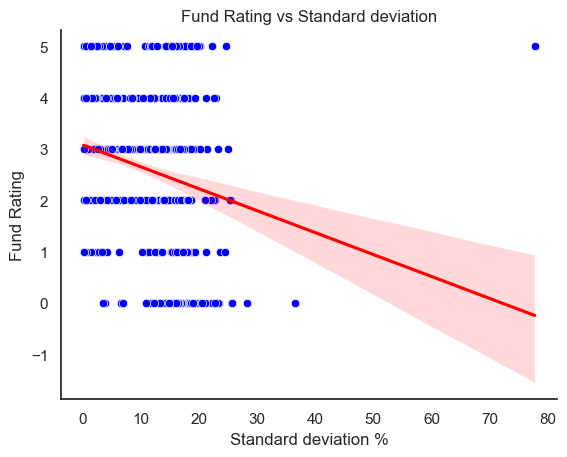

In [1713]:
sns.scatterplot(data=df,y='rating',x='sd',color='blue')

sns.regplot(data=df,y='rating',x='sd',color='red',scatter=False)


plt.title('Fund Rating vs Standard deviation')
plt.xlabel('Standard deviation %')
plt.ylabel('Fund Rating')
sns.despine()

plt.show()


The correlation coefficient of -0.227 indicates a weak negative relationship between the standard deviation (volatility) of a fund and its assigned rating. This suggests that, to some extent, lower volatility is associated with higher fund ratings. However, it's important to note that correlation does not imply causation, and other factors may also influence the fund ratings. Therefore, while there is a weak negative relationship between volatility and fund rating, it should not be considered as the sole determining factor for the rating.

In [857]:
df['rating'].corr(df['sd'])

-0.22706917850340397

In [866]:
df['rating'].corr(df['fund_size_cr'])

0.1943225580668658

In [873]:
df['rating'].corr(df['fund_age_yr'])

0.09016019491081406

# Fund Age - Part 5

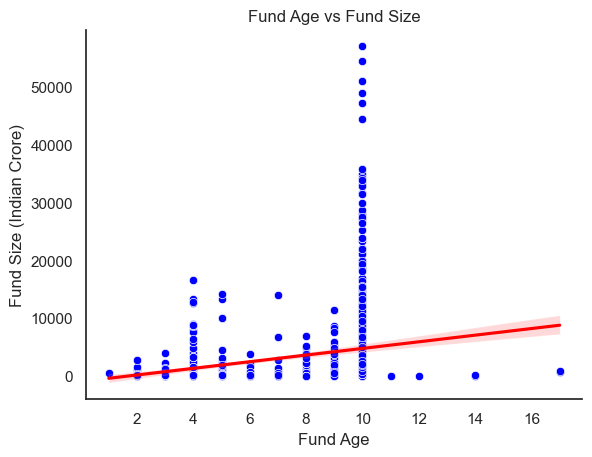

In [1715]:
sns.scatterplot(data=df,x='fund_age_yr',y='fund_size_cr',color='blue')

sns.regplot(data=df,x='fund_age_yr',y='fund_size_cr',color='red',scatter=False)


plt.title('Fund Age vs Fund Size')
plt.ylabel('Fund Size (Indian Crore)')
plt.xlabel('Fund Age')
sns.despine()

plt.show()

In [1321]:
df['fund_size_cr'].corr(df['fund_age_yr'])

0.21119548556509926


The correlation coefficient of 0.211 suggests a weak positive relationship between the age of a fund and its fund size (assets under management). This implies that, to some extent, older funds tend to have slightly larger assets under management compared to newer funds. However, it's important to note that correlation does not necessarily imply causation, and there may be other factors influencing the fund size as well.

In [880]:
df['returns_1yr'].corr(df['fund_age_yr'])

0.06508501857419259

# Expense Ratio - Part 5


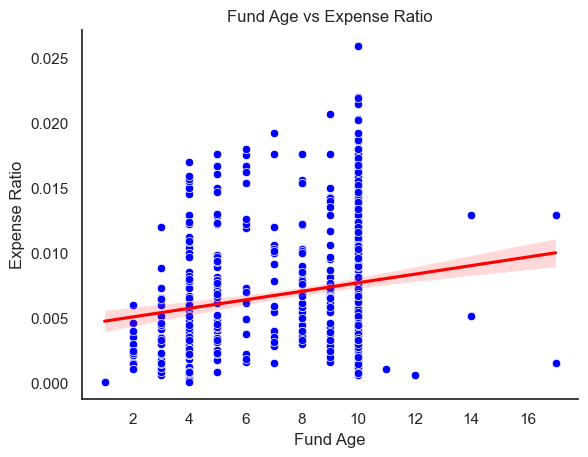

In [1716]:
sns.scatterplot(data=df,x='fund_age_yr',y='expense_ratio',color='blue')

sns.regplot(data=df,x='fund_age_yr',y='expense_ratio',color='red',scatter=False)


plt.title('Fund Age vs Expense Ratio')
plt.ylabel('Expense Ratio')
plt.xlabel('Fund Age')
sns.despine()

plt.show()

The correlation coefficient of 0.18 suggests a weak positive relationship between the age of a fund (its experience) and the expense ratio. This indicates that, to some extent, older funds do not necessarily charge higher expense fees compared to newer funds. In other words, there is no strong evidence to support the idea that fund age directly influences expense ratios.

In [882]:
df['expense_ratio'].corr(df['fund_age_yr'])

0.18030825169320816

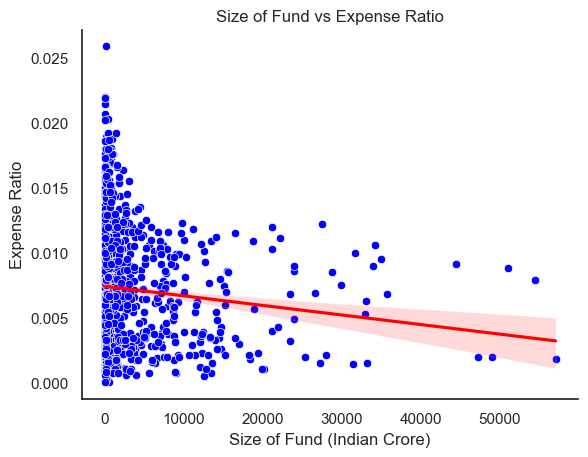

In [1717]:
sns.scatterplot(data=df,x='fund_size_cr',y='expense_ratio',color='blue')

sns.regplot(data=df,x='fund_size_cr',y='expense_ratio',color='red',scatter=False)


plt.title('Size of Fund vs Expense Ratio')
plt.ylabel('Expense Ratio')
plt.xlabel('Size of Fund (Indian Crore)')
sns.despine()

plt.show()

The correlation coefficient of -0.11 indicates a weak negative relationship between the fund size and expense fees of mutual fund schemes. This implies that, to a limited extent, larger fund schemes do not necessarily charge lower expense fees compared to smaller fund schemes. However, the correlation coefficient is too small to draw any significant insights or make strong conclusions about the relationship between these variables. 

In [988]:
df['expense_ratio'].corr(df['fund_size_cr'])

-0.10988278658192438

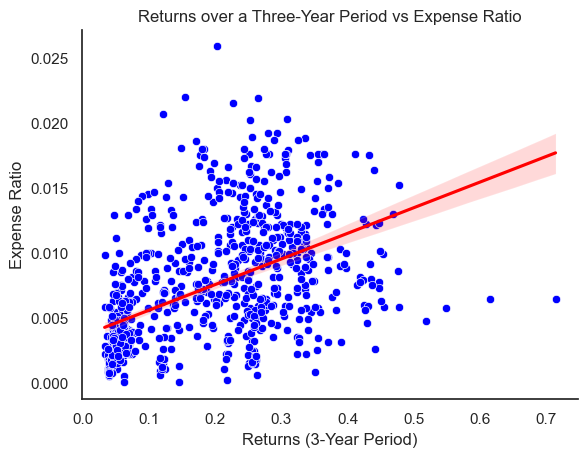

In [1720]:
sns.scatterplot(data=df,y='expense_ratio',x='returns_3yr',color='blue')

sns.regplot(data=df,y='expense_ratio',x='returns_3yr',color='red',scatter=False)


plt.title('Returns over a Three-Year Period vs Expense Ratio')
plt.ylabel('Expense Ratio')
plt.xlabel('Returns (3-Year Period)')
sns.despine()

plt.show()

The correlation coefficient of 0.49 suggests a moderate positive relationship between the expense fees and returns of mutual fund schemes over a three-year period. This indicates that mutual fund schemes with higher returns tend to charge higher expense fees, although the relationship is not particularly strong. 

In [1330]:
df['expense_ratio'].corr(df['returns_3yr'])

0.4956145622524407

# Fund Manager - Part 6

In this section, we focus on the top-performing fund managers. 

In [1637]:
fund_manager=df['fund_manager'].value_counts().reset_index().head(10)
fund_manager.rename(columns={'index':"Fund_manager",'fund_manager':"Frequency"},inplace=True)
fund_manager


,Fund_manager,Frequency
0,Rohit Seksaria,18
1,Deepak Agrawal,12
2,R Srinivasan,12
3,Devang Shah,11
4,Alok Ranjan,11
5,Manish Banthia,11
6,Puneet Pal,10
7,Sankaran Naren,9
8,Rahul Goswami,8
9,Shriram Ramanathan,8


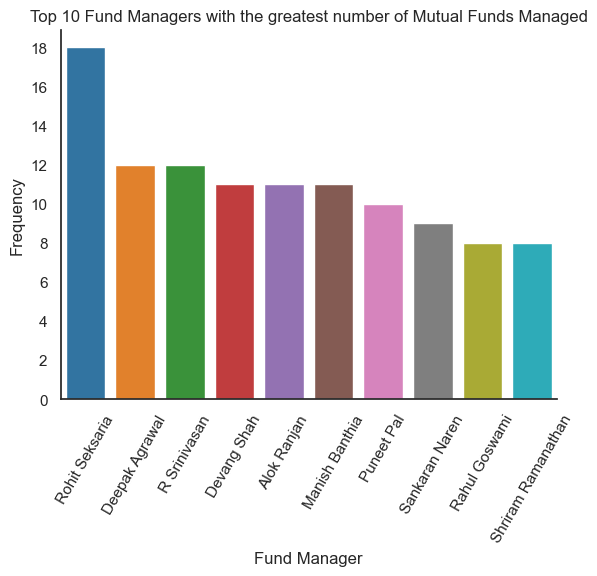

In [1721]:
sns.barplot(data=fund_manager,y='Frequency',x='Fund_manager')
plt.xlabel('Fund Manager')
plt.title('Top 10 Fund Managers with the greatest number of Mutual Funds Managed')
plt.xticks(rotation=60)
sns.despine()
plt.yticks([0,2,4,6,8,10,12,14,16,18])
plt.show()


The graph illustrates the top 10 Mutual Fund Managers based on the number of mutual fund schemes they manage. Among all the mutual fund managers, 
Rohit Seksaria stands out with the highest number of mutual fund schemes managed, specifically 18 schemes.

In [1359]:
manager=df.groupby('fund_manager')[['returns_1yr','returns_3yr','alpha','sharpe','sd','risk_level','rating','expense_ratio']].mean().reset_index()
manager

,fund_manager,returns_1yr,returns_3yr,alpha,sharpe,sd,risk_level,rating,expense_ratio
0,Abhinav Khandelwal,0.032333,0.260000,-0.130000,1.383333,15.396667,6.000000,2.333333,0.007167
1,Abhinav Sharma,0.062000,0.314500,7.160000,1.630000,15.810000,6.000000,1.500000,0.011800
2,Abhishek Bisen,0.071750,0.078000,0.937500,0.590000,5.792500,2.750000,3.500000,0.004075
3,Abhishek Gupta,0.012000,0.278000,2.770000,1.470000,15.870000,6.000000,4.000000,0.006000
4,Abhishek Iyer,0.055000,0.041000,0.985000,0.600000,0.355000,1.500000,4.000000,0.001400
5,Abhishek Singh,0.036000,0.218000,-1.790000,1.180000,15.880000,6.000000,1.000000,0.012700
6,Aditya Khemani,0.096000,0.269500,3.145000,1.455000,15.920000,6.000000,3.000000,0.007650
7,Aditya Mulki,0.014333,0.271500,2.814000,1.490000,14.602000,6.000000,2.500000,0.003750
8,Aditya Pagaria,0.071800,0.069250,1.675000,0.985000,4.070000,2.800000,3.600000,0.002040
9,Ajay Argal,0.105500,0.335000,5.825000,1.515000,18.840000,6.000000,3.500000,0.012300


In [1018]:
manager_alpha=manager.sort_values(by='alpha',ascending=False).head(10)
manager_alpha

,fund_manager,returns_1yr,returns_3yr,alpha,sharpe,sd,risk_level,rating,expense_ratio
240,Vasav Sahgal,0.059750,0.516750,20.080000,2.015000,19.192500,6.000000,5.000000,0.005875
169,Rajeev Thakkar,0.051500,0.333000,11.645000,1.985000,13.705000,6.000000,5.000000,0.007750
201,Sanjeev Sharma,0.057429,0.388286,11.131429,2.098571,16.124286,5.428571,4.285714,0.005471
52,Bhavin Vithiani,0.128000,0.335000,10.520000,1.790000,16.140000,6.000000,4.000000,0.018800
129,Mittul Kalawadia,0.085000,0.376000,10.390000,1.940000,15.420000,6.000000,0.000000,0.006600
195,Samir Rachh,0.087000,0.476000,10.010000,2.060000,19.310000,6.000000,4.000000,0.008600
88,Harshal Joshi,0.044000,0.062000,9.780000,0.640000,3.980000,3.000000,0.000000,0.000500
200,Sanjay Doshi,0.204000,0.372000,9.720000,1.670000,19.090000,6.000000,3.000000,0.015800
91,Ihab Dalwai,0.169000,0.386000,9.625000,1.755000,18.570000,6.000000,4.500000,0.013650
238,Vaibhav Dusad,-0.197000,0.453000,9.300000,1.480000,23.400000,6.000000,0.000000,0.009900


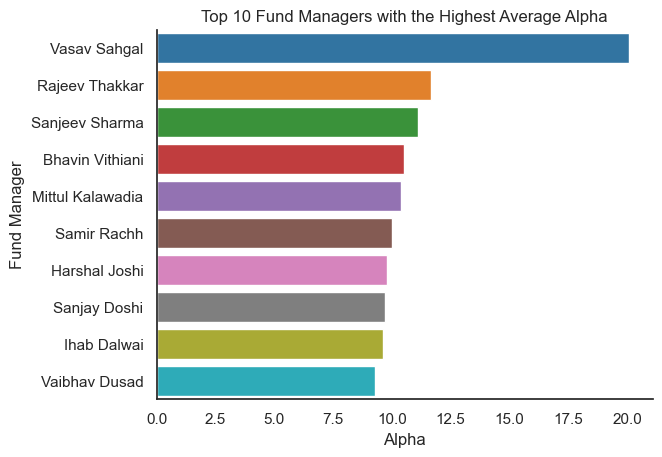

In [1726]:
sns.barplot(data=manager_alpha,y='fund_manager',x='alpha')
plt.title("Top 10 Fund Managers with the Highest Average Alpha")
plt.xlabel('Alpha')
plt.ylabel('Fund Manager')
sns.despine()
plt.show()

In [1024]:
manager_sharpe=manager.sort_values(by='sharpe',ascending=False).head(10)
manager_sharpe 

,fund_manager,returns_1yr,returns_3yr,alpha,sharpe,sd,risk_level,rating,expense_ratio
201,Sanjeev Sharma,0.057429,0.388286,11.131429,2.098571,16.124286,5.428571,4.285714,0.005471
195,Samir Rachh,0.087000,0.476000,10.010000,2.060000,19.310000,6.000000,4.000000,0.008600
240,Vasav Sahgal,0.059750,0.516750,20.080000,2.015000,19.192500,6.000000,5.000000,0.005875
169,Rajeev Thakkar,0.051500,0.333000,11.645000,1.985000,13.705000,6.000000,5.000000,0.007750
192,Sahil Shah,0.030000,0.425000,8.580000,1.980000,17.990000,6.000000,4.000000,0.006000
137,Niket Shah,0.146000,0.340000,7.690000,1.980000,15.340000,6.000000,5.000000,0.008700
129,Mittul Kalawadia,0.085000,0.376000,10.390000,1.940000,15.420000,6.000000,0.000000,0.006600
244,Vikas Agrawal,0.056000,0.056000,3.080000,1.890000,0.690000,3.000000,3.000000,0.002100
144,Pankaj Tibrewal,0.036333,0.346667,6.496667,1.886667,15.480000,6.000000,2.666667,0.005533
64,Devender Singhal,0.071750,0.223000,6.250000,1.880000,9.647500,4.750000,2.250000,0.004825


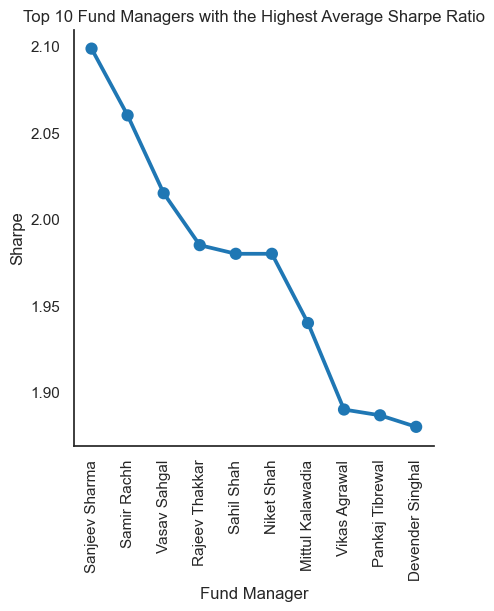

In [1727]:
sns.catplot(x='fund_manager',y='sharpe',kind='point',data=manager_sharpe)
plt.xticks(rotation=90)
plt.ylabel('Sharpe')
plt.xlabel('Fund Manager')
plt.title('Top 10 Fund Managers with the Highest Average Sharpe Ratio')
plt.show() 

In [1037]:
manager_sd=manager.sort_values(by='sd',ascending=True).head(10)
manager_sd

,fund_manager,returns_1yr,returns_3yr,alpha,sharpe,sd,risk_level,rating,expense_ratio
164,Raj Mehta,0.053000,0.040000,0.870000,0.130000,0.340000,2.00,1.000000,0.001700
158,Rahul Dedhia,0.054500,0.041500,1.050000,0.545000,0.355000,2.00,3.000000,0.001250
4,Abhishek Iyer,0.055000,0.041000,0.985000,0.600000,0.355000,1.50,4.000000,0.001400
97,Kapil Punjabi,0.055500,0.041000,1.015000,0.535000,0.360000,1.50,4.000000,0.001100
65,Devesh Thacker,0.055500,0.041500,0.975000,0.480000,0.365000,1.50,3.500000,0.000750
171,Rakesh Shetty,0.049500,0.038500,1.100000,-0.085000,0.370000,1.50,1.000000,0.003950
196,Sandeep Agarwal,0.055000,0.044333,1.543333,1.046667,0.416667,2.00,2.666667,0.001533
247,Vikram Pamnani,0.054500,0.043750,1.562500,0.782500,0.427500,1.75,3.250000,0.001725
248,Vikrant Mehta,0.051667,0.036667,0.356667,-0.310000,0.453333,1.50,2.666667,0.001300
22,Amit Sharma,0.055000,0.046000,1.675000,1.000000,0.465000,2.00,3.500000,0.001350


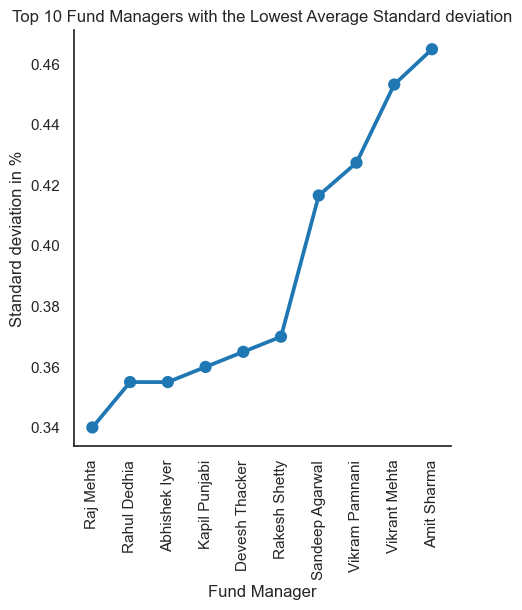

In [1732]:
sns.catplot(data=manager_sd,x='fund_manager',y='sd',kind='point')
plt.xticks(rotation=90)
plt.ylabel('Standard deviation in %')
plt.xlabel('Fund Manager')
plt.title('Top 10 Fund Managers with the Lowest Average Standard deviation')
plt.show()

In [1046]:
manager_returns_3yr=manager.sort_values(by='returns_3yr',ascending=False).head(10)
manager_returns_3yr

,fund_manager,returns_1yr,returns_3yr,alpha,sharpe,sd,risk_level,rating,expense_ratio
240,Vasav Sahgal,0.059750,0.516750,20.080000,2.015000,19.192500,6.000000,5.000000,0.005875
195,Samir Rachh,0.087000,0.476000,10.010000,2.060000,19.310000,6.000000,4.000000,0.008600
238,Vaibhav Dusad,-0.197000,0.453000,9.300000,1.480000,23.400000,6.000000,0.000000,0.009900
192,Sahil Shah,0.030000,0.425000,8.580000,1.980000,17.990000,6.000000,4.000000,0.006000
201,Sanjeev Sharma,0.057429,0.388286,11.131429,2.098571,16.124286,5.428571,4.285714,0.005471
91,Ihab Dalwai,0.169000,0.386000,9.625000,1.755000,18.570000,6.000000,4.500000,0.013650
31,Aniruddha Naha,-0.001500,0.384500,6.085000,1.760000,18.165000,6.000000,5.000000,0.004300
129,Mittul Kalawadia,0.085000,0.376000,10.390000,1.940000,15.420000,6.000000,0.000000,0.006600
200,Sanjay Doshi,0.204000,0.372000,9.720000,1.670000,19.090000,6.000000,3.000000,0.015800
184,Rohit Singhania,0.050250,0.352750,9.180000,1.520000,18.485000,6.000000,2.500000,0.010675


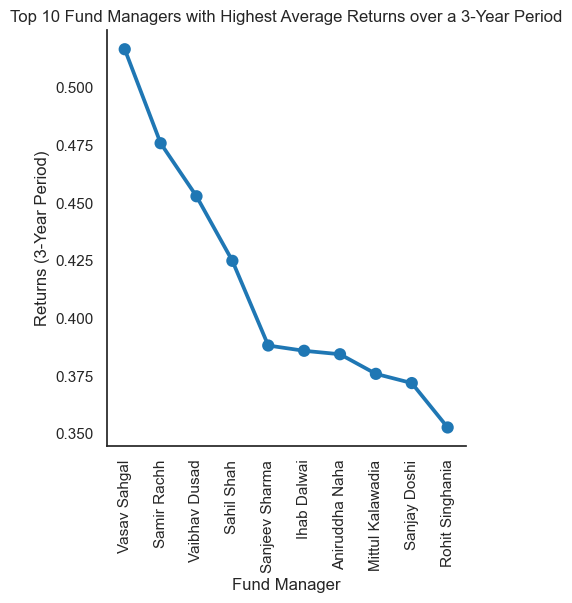

In [1738]:
sns.catplot(data=manager_returns_3yr,x='fund_manager',y='returns_3yr',kind='point')
plt.xticks(rotation=90)
plt.ylabel('Returns (3-Year Period)')
plt.xlabel('Fund Manager')
plt.title('Top 10 Fund Managers with Highest Average Returns over a 3-Year Period')
sns.set_style('white')

plt.show()

In almost all the metrics we studied, one name shows up at almost every top ten list. The name is Vasav Sahgal. Vasav Sahgal had the highest average alpha value across all the mutual fund scheme he has managed at 20.08. The third larges sharpe ratio, amounting to 2.01. The highest returns over a three-year period among all fund managers, amounting to 51.6%. Vasav Sahgal has an average standard deviatio of 19.12 across all the funds hes has been managing, which is one of the highest standard deviations among all fund managers. His average risk level is 6.0, which stands for very high risk.  

# Mutual Fund House - Part 7

In this section, I'm looking at the top performing Mutual Fund Houses in India. 

In [1010]:
amc=df.groupby('amc_name')[['returns_1yr','returns_3yr','returns_5yr','sortino','alpha','sd','beta','sharpe','risk_level','rating','expense_ratio']].mean()

                           
amc

,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
amc_name,,,,,,,,,,,
Aditya Birla Sun Life Mutual Fund,0.023102,0.165653,0.085488,2.518571,1.271957,10.425918,0.833261,1.172245,4.653061,2.489796,0.007812
Axis Mutual Fund,0.013029,0.126235,0.097167,2.487576,-0.113939,8.128438,0.943333,1.172121,4.200000,3.028571,0.004640
Bandhan Mutual Fund,0.028500,0.094500,0.069000,1.585000,5.255000,5.285000,2.915000,0.975000,4.000000,0.000000,0.002350
Bank of India Mutual Fund,0.144467,0.190467,0.070545,2.398000,2.839333,15.330667,-1.546000,1.007333,4.266667,3.066667,0.012120
Baroda BNP Paribas Mutual Fund,0.036750,0.127913,0.083706,2.100000,1.053478,7.146957,0.716087,1.017391,3.875000,3.041667,0.006379
Canara Robeco Mutual Fund,0.038722,0.163611,0.097062,2.412222,2.835000,7.664444,0.895000,1.100556,4.000000,3.388889,0.005550
DSP Mutual Fund,0.022543,0.172559,0.089034,2.228529,2.296667,10.975000,0.964000,1.080588,4.371429,2.171429,0.006863
Edelweiss Mutual Fund,0.027950,0.186368,0.098176,2.668947,2.603125,11.216316,0.977500,1.177368,4.550000,2.800000,0.006180
Franklin Templeton Mutual Fund,0.041692,0.205846,0.099083,2.554231,3.649600,11.630000,0.812000,1.251538,4.576923,2.307692,0.007765


In [1092]:
amc_fund=amc.sort_values(by='alpha',ascending=False).head(10).reset_index()
amc_fund

,amc_name,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
0,Quant Mutual Fund,0.058273,0.435000,0.179273,3.913636,14.385455,17.240000,0.809091,2.068182,5.636364,4.545455,0.005618
1,PPFAS Mutual Fund,0.052000,0.235333,0.176000,2.606667,8.053333,9.250000,0.646667,1.366667,4.666667,3.666667,0.005733
2,Bandhan Mutual Fund,0.028500,0.094500,0.069000,1.585000,5.255000,5.285000,2.915000,0.975000,4.000000,0.000000,0.002350
3,ICICI Prudential Mutual Fund,0.057526,0.215456,0.106340,3.182281,4.453091,10.678596,0.887455,1.454386,4.736842,2.894737,0.007921
4,SBI Mutual Fund,0.039292,0.209447,0.110024,2.812979,4.112128,10.889362,0.980851,1.355745,4.500000,2.333333,0.008819
5,Sundaram Mutual Fund,0.038857,0.241976,0.083667,3.233095,3.731951,12.698571,0.757317,1.365238,4.714286,1.833333,0.008474
6,Franklin Templeton Mutual Fund,0.041692,0.205846,0.099083,2.554231,3.649600,11.630000,0.812000,1.251538,4.576923,2.307692,0.007765
7,Kotak Mahindra Mutual Fund,0.057531,0.163656,0.102393,2.650313,3.539375,7.676875,0.865000,1.305937,4.093750,3.125000,0.004791
8,HDFC Mutual Fund,0.072605,0.188184,0.095108,2.947632,3.381842,9.394474,0.837632,1.362895,4.473684,3.052632,0.006963
9,Nippon India Mutual Fund,0.048513,0.183846,0.089108,2.753333,2.851316,10.487179,0.948947,1.271538,4.538462,2.615385,0.007631


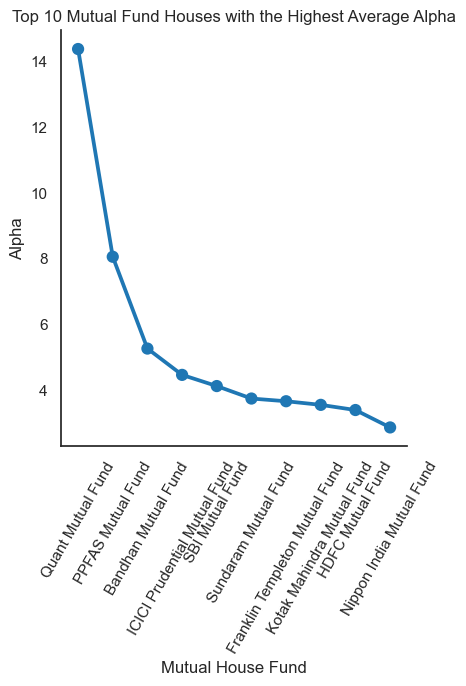

In [1740]:
sns.catplot(data=amc_fund,x='amc_name',y='alpha',kind='point')
plt.xticks(rotation=60)
plt.ylabel('Alpha')
plt.xlabel('Mutual House Fund')
plt.title('Top 10 Mutual Fund Houses with the Highest Average Alpha')

plt.show()

In [1097]:
amc_rating=amc.sort_values(by='rating',ascending=False).head(10).reset_index()
amc_rating 

,amc_name,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
0,Quant Mutual Fund,0.058273,0.435000,0.179273,3.913636,14.385455,17.240000,0.809091,2.068182,5.636364,4.545455,0.005618
1,IIFL Mutual Fund,0.045000,0.130333,0.098000,1.736667,2.086667,6.150000,0.716667,0.853333,4.000000,3.666667,0.004567
2,PPFAS Mutual Fund,0.052000,0.235333,0.176000,2.606667,8.053333,9.250000,0.646667,1.366667,4.666667,3.666667,0.005733
3,Mirae Asset Mutual Fund,0.022667,0.187857,0.104222,3.079286,2.557857,10.142857,0.974286,1.235000,3.888889,3.388889,0.004006
4,Canara Robeco Mutual Fund,0.038722,0.163611,0.097062,2.412222,2.835000,7.664444,0.895000,1.100556,4.000000,3.388889,0.005550
5,Mahindra Manulife Mutual Fund,0.032929,0.192846,0.112667,2.870000,2.069231,9.216154,0.876154,1.281538,4.357143,3.142857,0.005014
6,Kotak Mahindra Mutual Fund,0.057531,0.163656,0.102393,2.650313,3.539375,7.676875,0.865000,1.305937,4.093750,3.125000,0.004791
7,JM Financial Mutual Fund,0.045545,0.166545,0.085000,3.434545,1.941818,10.225455,0.889091,0.943636,4.181818,3.090909,0.010591
8,Bank of India Mutual Fund,0.144467,0.190467,0.070545,2.398000,2.839333,15.330667,-1.546000,1.007333,4.266667,3.066667,0.012120
9,HDFC Mutual Fund,0.072605,0.188184,0.095108,2.947632,3.381842,9.394474,0.837632,1.362895,4.473684,3.052632,0.006963


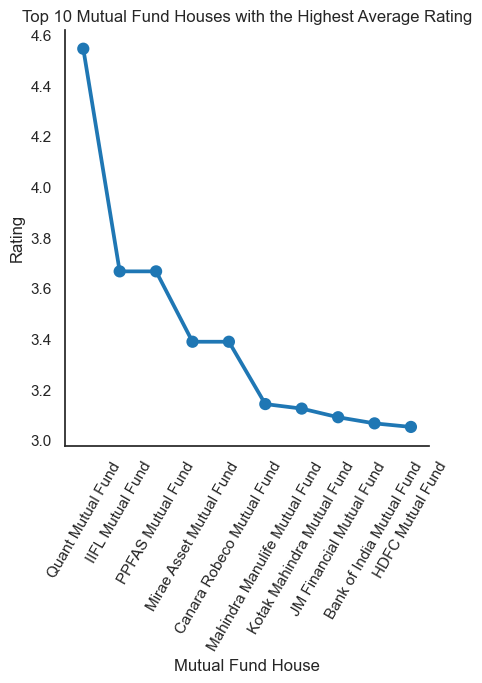

In [1742]:
sns.catplot(data=amc_rating,x='amc_name',y='rating',kind='point')
plt.xticks(rotation=60)
plt.ylabel('Rating')
plt.xlabel('Mutual Fund House')
plt.title('Top 10 Mutual Fund Houses with the Highest Average Rating')
plt.show() 

In [1348]:
df[df['amc_name']=='Quant Mutual Fund']

,scheme_name,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,fund_manager,sortino,alpha,sd,...,sub_category,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr,risk_level_cat,Fund_rating
599,Quant Absolute Fund,1000,5000,0.0056,1013.0,10,Sanjeev Sharma,3.75,16.98,14.41,...,Aggressive Hybrid Mutual Funds,0.073,0.382,0.191,100000,106740.0,137640.0,118540.0,Very_high,Excellent
600,Quant Active Fund,1000,5000,0.0058,3531.0,10,Sanjeev Sharma,3.33,13.82,19.65,...,Multi Cap Funds,0.010,0.455,0.199,100000,100420.0,144920.0,119320.0,Very_high,Disaster
601,Quant Flexi Cap Fund,1000,5000,0.0058,1044.0,10,Vasav Sahgal,3.65,15.93,19.16,...,Flexi Cap Funds,0.068,0.477,0.182,100000,106220.0,147120.0,117620.0,Very_high,Excellent
602,Quant Focused Fund,1000,5000,0.0057,219.0,10,Sanjeev Sharma,3.14,8.60,17.34,...,Focused Funds,0.052,0.337,0.131,100000,104630.0,133130.0,112530.0,Very_high,Excellent
603,Quant Infrastructure Fund,1000,5000,0.0064,822.0,10,Vasav Sahgal,3.44,27.24,19.24,...,Sectoral / Thematic Mutual Funds,0.056,0.615,0.211,100000,104960.0,160860.0,120460.0,Very_high,Excellent
604,Quant Large and Mid Cap Fund,1000,5000,0.0056,652.0,10,Sanjeev Sharma,3.12,6.57,17.72,...,Large & Mid Cap Funds,0.069,0.330,0.142,100000,106340.0,132440.0,113640.0,Very_high,Excellent
605,Quant Liquid Plan – Direct Growth,1000,5000,0.0029,1561.0,10,Sanjeev Sharma,8.60,1.58,0.27,...,Liquid Mutual Funds,0.056,0.049,0.059,100000,105310.0,104610.0,105610.0,Low_to_moderate,Excellent
606,Quant Mid Cap Fund,1000,5000,0.0063,1550.0,10,Sanjeev Sharma,3.58,11.21,18.73,...,Mid Cap Mutual Funds,0.088,0.451,0.198,100000,108170.0,144470.0,119170.0,Very_high,Excellent
607,Quant Multi Asset Fund,1000,5000,0.0056,634.0,10,Vasav Sahgal,3.23,19.52,18.63,...,Multi Asset Allocation Mutual Funds,0.106,0.426,0.205,100000,110040.0,142040.0,119940.0,Very_high,Excellent
608,Quant Small Cap Fund,1000,5000,0.0064,3301.0,10,Sanjeev Sharma,3.71,19.16,24.75,...,Small Cap Mutual Funds,0.054,0.714,0.232,100000,104760.0,170760.0,122560.0,Very_high,Excellent


In [1349]:
amc_return1=amc.sort_values(by='returns_1yr',ascending=False).head(10).reset_index()
amc_return1

,amc_name,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
0,Bank of India Mutual Fund,0.144467,0.190467,0.070545,2.398000,2.839333,15.330667,-1.546000,1.007333,4.266667,3.066667,0.012120
1,HDFC Mutual Fund,0.072605,0.188184,0.095108,2.947632,3.381842,9.394474,0.837632,1.362895,4.473684,3.052632,0.006963
2,Quant Mutual Fund,0.058273,0.435000,0.179273,3.913636,14.385455,17.240000,0.809091,2.068182,5.636364,4.545455,0.005618
3,Kotak Mahindra Mutual Fund,0.057531,0.163656,0.102393,2.650313,3.539375,7.676875,0.865000,1.305937,4.093750,3.125000,0.004791
4,ICICI Prudential Mutual Fund,0.057526,0.215456,0.106340,3.182281,4.453091,10.678596,0.887455,1.454386,4.736842,2.894737,0.007921
5,PPFAS Mutual Fund,0.052000,0.235333,0.176000,2.606667,8.053333,9.250000,0.646667,1.366667,4.666667,3.666667,0.005733
6,Quantum Mutual Fund,0.050571,0.157143,0.085286,2.160000,0.634286,9.797143,0.790000,0.958571,4.428571,2.285714,0.005729
7,Nippon India Mutual Fund,0.048513,0.183846,0.089108,2.753333,2.851316,10.487179,0.948947,1.271538,4.538462,2.615385,0.007631
8,ITI Mutual Fund,0.047667,0.127333,NaN,1.018333,-0.733333,8.218333,0.600000,0.421667,3.000000,2.222222,0.002233
9,JM Financial Mutual Fund,0.045545,0.166545,0.085000,3.434545,1.941818,10.225455,0.889091,0.943636,4.181818,3.090909,0.010591


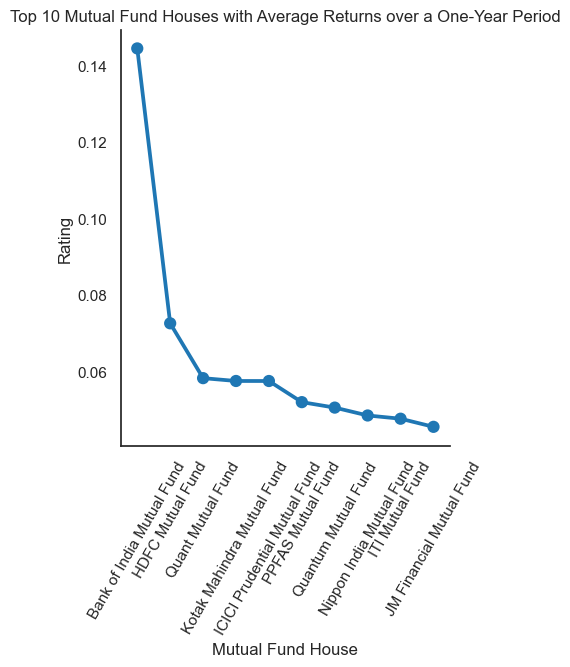

In [1745]:
sns.catplot(data=amc_return1,x='amc_name',y='returns_1yr',kind='point')
plt.xticks(rotation=60)
plt.ylabel('Rating')
plt.xlabel('Mutual Fund House')
plt.title('Top 10 Mutual Fund Houses with Average Returns over a One-Year Period')

plt.show() 

In [1346]:
amc_return3=amc.sort_values(by='returns_3yr',ascending=False).head(10).reset_index()
amc_return3

,amc_name,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
0,Quant Mutual Fund,0.058273,0.435000,0.179273,3.913636,14.385455,17.240000,0.809091,2.068182,5.636364,4.545455,0.005618
1,L&T Mutual Fund,0.000500,0.333500,0.117000,2.600000,-2.340000,16.620000,0.970000,1.180000,6.000000,2.500000,0.012900
2,Navi Mutual Fund,0.018375,0.254625,0.113000,2.954286,2.307143,10.952857,0.762857,1.374286,5.250000,2.375000,0.004213
3,Sundaram Mutual Fund,0.038857,0.241976,0.083667,3.233095,3.731951,12.698571,0.757317,1.365238,4.714286,1.833333,0.008474
4,PPFAS Mutual Fund,0.052000,0.235333,0.176000,2.606667,8.053333,9.250000,0.646667,1.366667,4.666667,3.666667,0.005733
5,Taurus Mutual Fund,0.012250,0.232250,0.098750,2.372500,-1.207500,16.700000,0.837500,1.196250,6.000000,1.875000,0.015312
6,Motilal Oswal Mutual Fund,0.027688,0.229000,0.089429,2.171875,-0.661333,15.029375,0.894000,1.051875,5.437500,2.250000,0.005625
7,ICICI Prudential Mutual Fund,0.057526,0.215456,0.106340,3.182281,4.453091,10.678596,0.887455,1.454386,4.736842,2.894737,0.007921
8,SBI Mutual Fund,0.039292,0.209447,0.110024,2.812979,4.112128,10.889362,0.980851,1.355745,4.500000,2.333333,0.008819
9,Tata Mutual Fund,0.032324,0.206939,0.108600,2.792727,2.712121,11.283030,0.902727,1.321515,4.617647,2.588235,0.006312


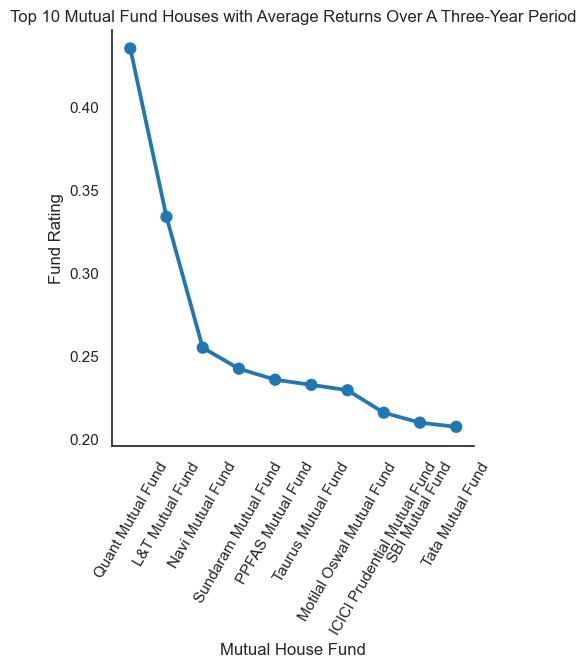

In [1747]:
sns.catplot(data=amc_return3,x='amc_name',y='returns_3yr',kind='point')
plt.xticks(rotation=60)
plt.ylabel('Fund Rating')
plt.xlabel('Mutual House Fund')
plt.title('Top 10 Mutual Fund Houses with Average Returns Over A Three-Year Period')

plt.show() 

In [1101]:
amc_return5=amc.sort_values(by='returns_5yr',ascending=False).head(10).reset_index()
amc_return5 

,amc_name,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
0,Quant Mutual Fund,0.058273,0.435000,0.179273,3.913636,14.385455,17.240000,0.809091,2.068182,5.636364,4.545455,0.005618
1,PPFAS Mutual Fund,0.052000,0.235333,0.176000,2.606667,8.053333,9.250000,0.646667,1.366667,4.666667,3.666667,0.005733
2,WhiteOak Capital Mutual Fund,0.041000,0.135667,0.133000,0.656667,1.020000,0.500000,0.636667,0.220000,1.000000,1.333333,0.002700
3,L&T Mutual Fund,0.000500,0.333500,0.117000,2.600000,-2.340000,16.620000,0.970000,1.180000,6.000000,2.500000,0.012900
4,Navi Mutual Fund,0.018375,0.254625,0.113000,2.954286,2.307143,10.952857,0.762857,1.374286,5.250000,2.375000,0.004213
5,Mahindra Manulife Mutual Fund,0.032929,0.192846,0.112667,2.870000,2.069231,9.216154,0.876154,1.281538,4.357143,3.142857,0.005014
6,SBI Mutual Fund,0.039292,0.209447,0.110024,2.812979,4.112128,10.889362,0.980851,1.355745,4.500000,2.333333,0.008819
7,Tata Mutual Fund,0.032324,0.206939,0.108600,2.792727,2.712121,11.283030,0.902727,1.321515,4.617647,2.588235,0.006312
8,ICICI Prudential Mutual Fund,0.057526,0.215456,0.106340,3.182281,4.453091,10.678596,0.887455,1.454386,4.736842,2.894737,0.007921
9,Mirae Asset Mutual Fund,0.022667,0.187857,0.104222,3.079286,2.557857,10.142857,0.974286,1.235000,3.888889,3.388889,0.004006


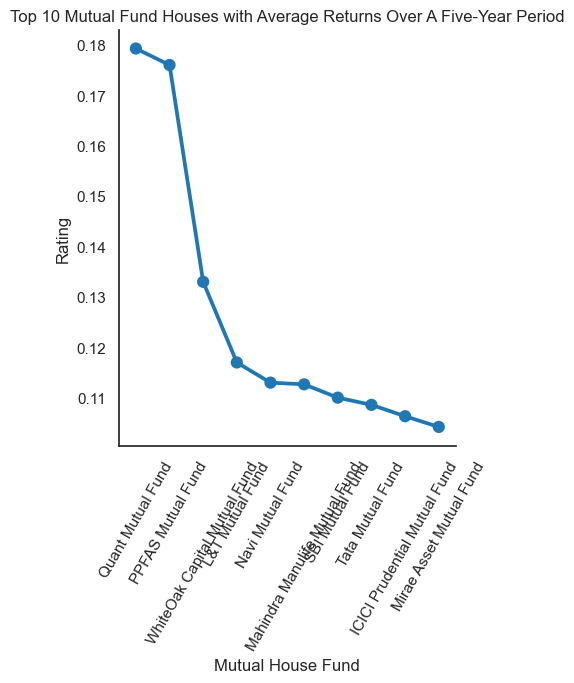

In [1748]:
sns.catplot(data=amc_return5,x='amc_name',y='returns_5yr',kind='point')
plt.xticks(rotation=60)
plt.ylabel('Rating')
plt.xlabel('Mutual House Fund')
plt.title('Top 10 Mutual Fund Houses with Average Returns Over A Five-Year Period')

plt.show()  

In [1104]:
amc_sharpe=amc.sort_values(by='sharpe',ascending=False).head(10).reset_index()
amc_sharpe

,amc_name,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
0,Quant Mutual Fund,0.058273,0.435000,0.179273,3.913636,14.385455,17.240000,0.809091,2.068182,5.636364,4.545455,0.005618
1,ICICI Prudential Mutual Fund,0.057526,0.215456,0.106340,3.182281,4.453091,10.678596,0.887455,1.454386,4.736842,2.894737,0.007921
2,Navi Mutual Fund,0.018375,0.254625,0.113000,2.954286,2.307143,10.952857,0.762857,1.374286,5.250000,2.375000,0.004213
3,PPFAS Mutual Fund,0.052000,0.235333,0.176000,2.606667,8.053333,9.250000,0.646667,1.366667,4.666667,3.666667,0.005733
4,Sundaram Mutual Fund,0.038857,0.241976,0.083667,3.233095,3.731951,12.698571,0.757317,1.365238,4.714286,1.833333,0.008474
5,HDFC Mutual Fund,0.072605,0.188184,0.095108,2.947632,3.381842,9.394474,0.837632,1.362895,4.473684,3.052632,0.006963
6,SBI Mutual Fund,0.039292,0.209447,0.110024,2.812979,4.112128,10.889362,0.980851,1.355745,4.500000,2.333333,0.008819
7,Tata Mutual Fund,0.032324,0.206939,0.108600,2.792727,2.712121,11.283030,0.902727,1.321515,4.617647,2.588235,0.006312
8,Kotak Mahindra Mutual Fund,0.057531,0.163656,0.102393,2.650313,3.539375,7.676875,0.865000,1.305937,4.093750,3.125000,0.004791
9,Mahindra Manulife Mutual Fund,0.032929,0.192846,0.112667,2.870000,2.069231,9.216154,0.876154,1.281538,4.357143,3.142857,0.005014


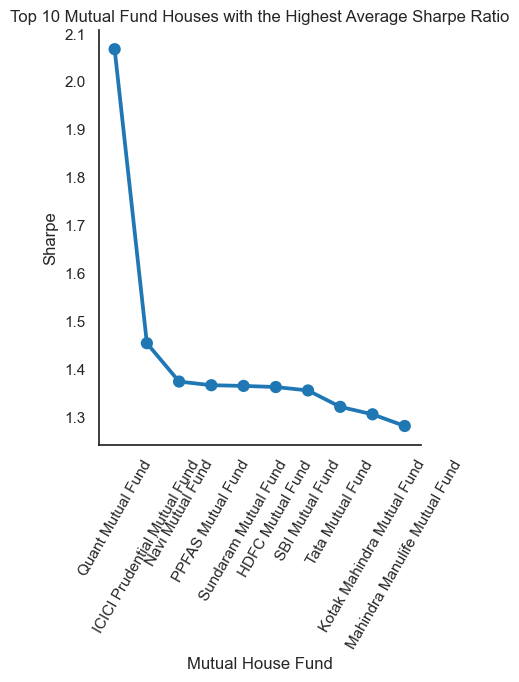

In [1749]:
sns.catplot(data=amc_sharpe,x='amc_name',y='sharpe',kind='point')
plt.xticks(rotation=60)
plt.ylabel('Sharpe')
plt.xlabel('Mutual House Fund')
plt.title('Top 10 Mutual Fund Houses with the Highest Average Sharpe Ratio')

plt.show()

In [1107]:
amc_sd=amc.sort_values(by='sd',ascending=True).head(10).reset_index()
amc_sd 

,amc_name,returns_1yr,returns_3yr,returns_5yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,expense_ratio
0,WhiteOak Capital Mutual Fund,0.041000,0.135667,0.133000,0.656667,1.020000,0.500000,0.636667,0.220000,1.000000,1.333333,0.002700
1,Bandhan Mutual Fund,0.028500,0.094500,0.069000,1.585000,5.255000,5.285000,2.915000,0.975000,4.000000,0.000000,0.002350
2,IIFL Mutual Fund,0.045000,0.130333,0.098000,1.736667,2.086667,6.150000,0.716667,0.853333,4.000000,3.666667,0.004567
3,PGIM India Mutual Fund,0.034667,0.134889,0.089563,2.626111,2.479412,6.823333,0.847647,1.139444,3.277778,3.000000,0.004744
4,Baroda BNP Paribas Mutual Fund,0.036750,0.127913,0.083706,2.100000,1.053478,7.146957,0.716087,1.017391,3.875000,3.041667,0.006379
5,Indiabulls Mutual Fund,0.032778,0.123444,0.065333,1.225556,0.204444,7.244444,0.982222,0.583333,3.666667,2.000000,0.006156
6,Canara Robeco Mutual Fund,0.038722,0.163611,0.097062,2.412222,2.835000,7.664444,0.895000,1.100556,4.000000,3.388889,0.005550
7,Kotak Mahindra Mutual Fund,0.057531,0.163656,0.102393,2.650313,3.539375,7.676875,0.865000,1.305937,4.093750,3.125000,0.004791
8,Axis Mutual Fund,0.013029,0.126235,0.097167,2.487576,-0.113939,8.128438,0.943333,1.172121,4.200000,3.028571,0.004640
9,HSBC Mutual Fund,0.029657,0.166286,0.082469,2.087143,1.731176,8.159143,0.869706,1.024000,4.057143,2.228571,0.007203


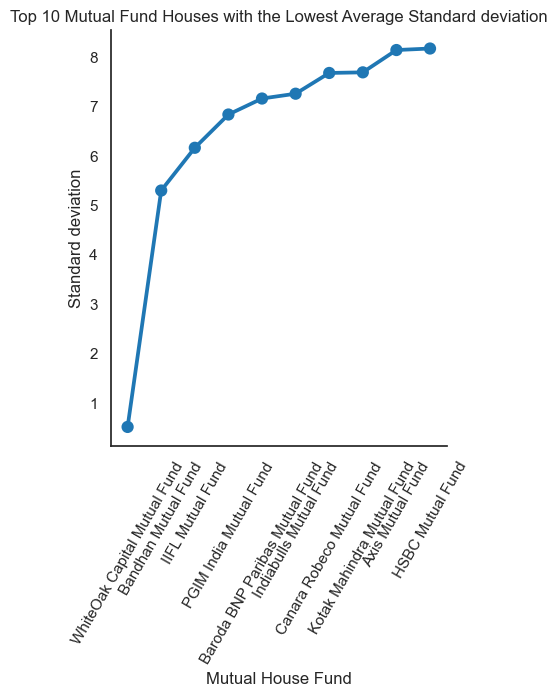

In [1751]:
sns.catplot(data=amc_sd,x='amc_name',y='sd',kind='point')
plt.xticks(rotation=60)
plt.ylabel('Standard deviation')
plt.xlabel('Mutual House Fund')
plt.title('Top 10 Mutual Fund Houses with the Lowest Average Standard deviation')

plt.show()

After comprehensive analysis of various variables across multiple mutual fund schemes, one particular fund stands out: Quant Mutual Fund. This fund demonstrates exceptional performance in several key areas. Firstly, it achieved the largest first-year returns among all mutual fund houses. Additionally, it boasts the highest returns over a five-year period, outperforming other funds in the market. Furthermore, Quant Mutual Fund holds the top position in terms of Sharpe ratio, alpha, and fund rating, indicating its strong performance relative to risk and market benchmarks.

Although not the highest, the fund still secured the third-largest returns over a three-year span, further demonstrating its consistent performance. In terms of asset allocation, Quantum Mutual Fund follows an investment strategy that allocates 80% of its assets in equities and 20% in gold.

Overall, Quantum Mutual Fund exhibits a remarkable track record and solid performance across multiple timeframes and evaluation criteria, positioning it as a standout choice among mutual fund options 

## Prediction of Rating

In [1393]:
df.columns

Index(['scheme_name', 'min_sip', 'min_lumpsum', 'expense_ratio',
       'fund_size_cr', 'fund_age_yr', 'fund_manager', 'sortino', 'alpha', 'sd',
       'beta', 'sharpe', 'risk_level', 'amc_name', 'rating', 'category',
       'sub_category', 'returns_1yr', 'returns_3yr', 'returns_5yr',
       'Money_Invested', 'Final_Value_1yr', 'Final_Value_3yr',
       'Final_Value_5yr', 'risk_level_cat', 'Fund_rating'],
      dtype='object')

In [1417]:
import statsmodels.api as sm

In [1398]:
from sklearn.linear_model import LinearRegression

In [1375]:
import statsmodels.formula.api as smf

In [1401]:
results = smf.ols('rating~ returns_1yr',data=df).fit()
results.params

Intercept      2.417404
returns_1yr    5.709051
dtype: float64

In [1404]:
from scipy.stats import linregress

In [1405]:
columns = ['scheme_name','rating','returns_1yr','returns_3yr','returns_5yr','expense_ratio','sortino','alpha','sd','beta',
           'sharpe','risk_level']

d3 = df[columns]

d3['returns_1yr'] = d3['returns_1yr'] *100
d3['returns_3yr'] = d3['returns_3yr'] *100
d3['returns_5yr'] = d3['returns_5yr'] *100
d3['expense_ratio'] = d3['expense_ratio'] *100




/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/2684809680.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d3['returns_1yr'] = d3['returns_1yr'] *100
/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/2684809680.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d3['returns_3yr'] = d3['returns_3yr'] *100
/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/2684809680.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

In [1433]:
model = smf.ols('rating~returns_1yr + returns_3yr',data=d3).fit()
model.params

Intercept      2.673367
returns_1yr    0.055289
returns_3yr   -0.013648
dtype: float64

In [1434]:
subset = d3.dropna(subset = ['returns_1yr','returns_3yr','rating'])

xs  = subset[['returns_1yr','returns_3yr']]
ys = subset['rating']


xs = sm.add_constant(xs)

model=sm.OLS(ys,xs)

results = model.fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.081
Model:                            OLS   Adj. R-squared:                  0.079
Method:                 Least Squares   F-statistic:                     34.89
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           3.01e-15
Time:                        19:11:05   Log-Likelihood:                -1397.6
No. Observations:                 793   AIC:                             2801.
Df Residuals:                     790   BIC:                             2815.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.6734      0.098     27.269      

In [1436]:
d3

,scheme_name,rating,returns_1yr,returns_3yr,returns_5yr,expense_ratio,sortino,alpha,sd,beta,sharpe,risk_level
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,3,4.0,6.5,6.9,0.27,0.32,2.24,9.39,0.01,0.24,3
1,Aditya Birla SL Arbitrage Fund,3,5.6,4.8,5.5,0.36,1.33,1.53,0.72,0.56,1.10,1
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,3,2.0,18.9,9.7,0.53,3.44,2.67,10.58,0.67,1.42,5
3,Aditya Birla SL Bal Bhavishya Yojna – Dir Growth,2,-0.7,17.1,NaN,0.76,2.18,-6.37,14.99,0.85,0.90,6
4,Aditya Birla SL Balanced Advantage Fund,4,4.5,18.6,9.7,0.61,3.69,1.99,10.38,0.68,1.39,6
5,Aditya Birla SL Banking&Financial Services-Dir...,2,5.3,24.6,9.2,1.17,2.07,1.24,25.53,0.96,0.97,6
6,Aditya Birla SL Banking&PSU Debt Fund,4,4.5,6.8,7.3,0.37,1.92,4.46,1.91,1.78,1.09,3
7,Aditya Birla SL CEF – Global Agri Plan-Direct ...,0,-10.3,29.4,9.3,1.29,1.42,NaN,20.18,NaN,1.06,6
8,Aditya Birla SL Corporate Bond Fund,4,4.9,7.1,7.4,0.31,2.28,2.38,1.93,0.78,1.35,2
9,Aditya Birla SL Credit Risk Fund,4,8.7,9.0,7.2,0.69,1.82,3.01,2.90,-0.95,1.47,4


In [1443]:
corr_matrix=d3.corr()

corr_matrix

,rating,returns_1yr,returns_3yr,returns_5yr,expense_ratio,sortino,alpha,sd,beta,sharpe,risk_level
rating,1.000000,0.260413,-0.130421,0.020079,-0.279715,0.215876,0.091882,-0.227069,-0.105380,0.191503,-0.170460
returns_1yr,0.260413,1.000000,-0.071401,-0.168604,-0.041015,0.072944,0.177959,0.055629,-0.639966,0.030161,-0.176473
returns_3yr,-0.130421,-0.071401,1.000000,0.810370,0.495615,0.402614,0.437960,0.805314,0.012906,0.564637,0.794269
returns_5yr,0.020079,-0.168604,0.810370,1.000000,0.241636,0.236431,0.414889,0.589955,0.159341,0.444442,0.645521
expense_ratio,-0.279715,-0.041015,0.495615,0.241636,1.000000,0.142331,0.093522,0.555962,-0.093047,0.247885,0.580970
sortino,0.215876,0.072944,0.402614,0.236431,0.142331,1.000000,0.357031,0.232576,0.034165,0.811052,0.317612
alpha,0.091882,0.177959,0.437960,0.414889,0.093522,0.357031,1.000000,0.089484,0.173623,0.475832,0.071906
sd,-0.227069,0.055629,0.805314,0.589955,0.555962,0.232576,0.089484,1.000000,-0.292831,0.330320,0.840715
beta,-0.105380,-0.639966,0.012906,0.159341,-0.093047,0.034165,0.173623,-0.292831,1.000000,0.054377,0.002705
sharpe,0.191503,0.030161,0.564637,0.444442,0.247885,0.811052,0.475832,0.330320,0.054377,1.000000,0.455482


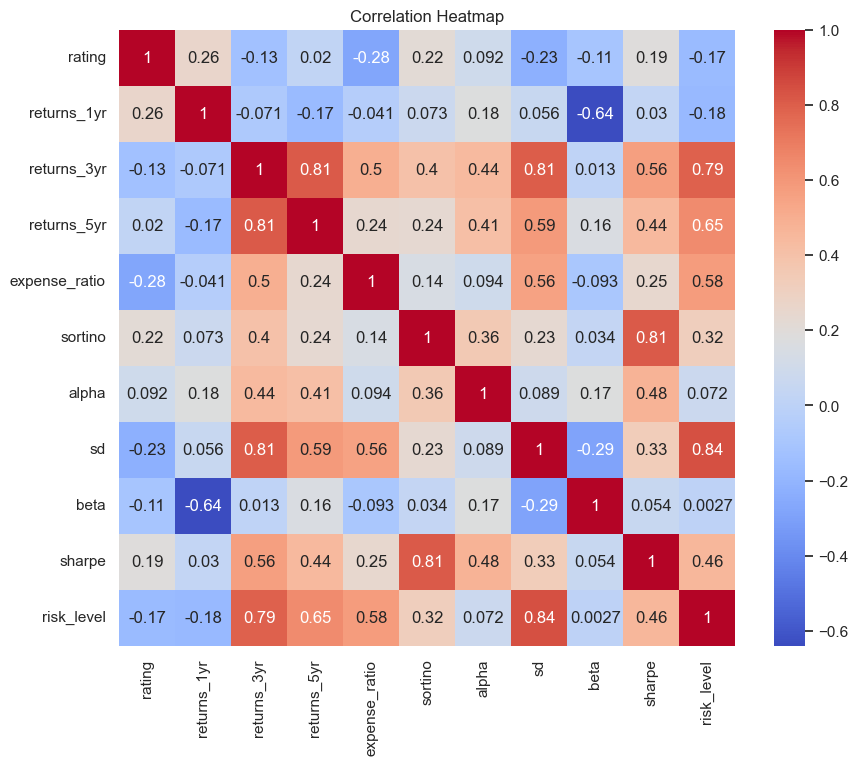

In [1752]:
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix,annot=True,cmap='coolwarm',square=True)

plt.title('Correlation Heatmap')

plt.show()

The correlation heatmap serves as a valuable tool for identifying strong correlations between independent variables in a multiple regression model. It allows you to visually analyze the relationships between different independent variables and identify instances of high correlation.

In a multiple regression analysis, it is generally recommended to avoid including independent variables that exhibit strong correlations with each other. Strong correlations between independent variables can introduce multicollinearity, which can lead to issues such as unstable coefficient estimates and difficulty in interpreting the effects of individual variables.

In [1450]:
subset = d3.dropna(subset= ['rating','returns_1yr','returns_3yr','returns_5yr','expense_ratio','sortino','alpha','sd','beta',
           'sharpe','risk_level'])

In [1452]:
subset

,scheme_name,rating,returns_1yr,returns_3yr,returns_5yr,expense_ratio,sortino,alpha,sd,beta,sharpe,risk_level
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,3,4.0,6.5,6.9,0.27,0.32,2.24,9.39,0.01,0.24,3
1,Aditya Birla SL Arbitrage Fund,3,5.6,4.8,5.5,0.36,1.33,1.53,0.72,0.56,1.10,1
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,3,2.0,18.9,9.7,0.53,3.44,2.67,10.58,0.67,1.42,5
4,Aditya Birla SL Balanced Advantage Fund,4,4.5,18.6,9.7,0.61,3.69,1.99,10.38,0.68,1.39,6
5,Aditya Birla SL Banking&Financial Services-Dir...,2,5.3,24.6,9.2,1.17,2.07,1.24,25.53,0.96,0.97,6
6,Aditya Birla SL Banking&PSU Debt Fund,4,4.5,6.8,7.3,0.37,1.92,4.46,1.91,1.78,1.09,3
8,Aditya Birla SL Corporate Bond Fund,4,4.9,7.1,7.4,0.31,2.28,2.38,1.93,0.78,1.35,2
9,Aditya Birla SL Credit Risk Fund,4,8.7,9.0,7.2,0.69,1.82,3.01,2.90,-0.95,1.47,4
10,Aditya Birla SL Digital India Fund,0,-14.6,39.8,21.1,0.88,2.42,9.37,21.12,0.83,1.53,6
11,Aditya Birla SL Dividend Yield Fund,0,6.2,30.5,10.0,1.73,3.78,5.04,15.77,0.85,1.58,6


In [1483]:
ys = subset['rating']
xs = subset[['returns_1yr']]

xs = sm.add_constant(xs)

model = sm.OLS(ys,xs)

result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.066
Model:                            OLS   Adj. R-squared:                  0.064
Method:                 Least Squares   F-statistic:                     43.98
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           7.19e-11
Time:                        19:54:02   Log-Likelihood:                -1079.2
No. Observations:                 625   AIC:                             2162.
Df Residuals:                     623   BIC:                             2171.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           2.5558      0.063     40.280      

In [1490]:
subset['returns2_1yr'] = subset['returns_1yr']**2
subset['returns2_3yr'] = subset['returns_3yr']**2
subset['returns2_5yr'] = subset['returns_5yr']**2
subset['alpha2'] = subset['alpha']**2
subset['sd2'] = subset['sd']**2
subset['expense_ratio2'] = subset['expense_ratio']**2
subset['sharpe2'] = subset['sharpe']**2
subset['risk_level2'] = subset['risk_level']**2
subset['beta2'] = subset['beta']**2

/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/2216904926.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['returns2_1yr'] = subset['returns_1yr']**2
/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/2216904926.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['returns2_3yr'] = subset['returns_3yr']**2
/var/folders/92/_kz_fht558b0hh0627_7zzk00000gn/T/ipykernel_57556/2216904926.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice 

In [1491]:
subset

,scheme_name,rating,returns_1yr,returns_3yr,returns_5yr,expense_ratio,sortino,alpha,sd,beta,...,returns2_1yr,returns2_3yr,returns3_5yr,returns2_5yr,alpha2,sd2,expense_ratio2,sharpe2,risk_level2,beta2
0,Aditya Birla SL Active Debt Multi-Mgr FoF-Dir ...,3,4.0,6.5,6.9,0.27,0.32,2.24,9.39,0.01,...,16.00,42.25,47.61,47.61,5.0176,88.1721,0.0729,0.0576,9,0.0001
1,Aditya Birla SL Arbitrage Fund,3,5.6,4.8,5.5,0.36,1.33,1.53,0.72,0.56,...,31.36,23.04,30.25,30.25,2.3409,0.5184,0.1296,1.2100,1,0.3136
2,Aditya Birla SL Asset Allocator FoF-Dir Growth,3,2.0,18.9,9.7,0.53,3.44,2.67,10.58,0.67,...,4.00,357.21,94.09,94.09,7.1289,111.9364,0.2809,2.0164,25,0.4489
4,Aditya Birla SL Balanced Advantage Fund,4,4.5,18.6,9.7,0.61,3.69,1.99,10.38,0.68,...,20.25,345.96,94.09,94.09,3.9601,107.7444,0.3721,1.9321,36,0.4624
5,Aditya Birla SL Banking&Financial Services-Dir...,2,5.3,24.6,9.2,1.17,2.07,1.24,25.53,0.96,...,28.09,605.16,84.64,84.64,1.5376,651.7809,1.3689,0.9409,36,0.9216
6,Aditya Birla SL Banking&PSU Debt Fund,4,4.5,6.8,7.3,0.37,1.92,4.46,1.91,1.78,...,20.25,46.24,53.29,53.29,19.8916,3.6481,0.1369,1.1881,9,3.1684
8,Aditya Birla SL Corporate Bond Fund,4,4.9,7.1,7.4,0.31,2.28,2.38,1.93,0.78,...,24.01,50.41,54.76,54.76,5.6644,3.7249,0.0961,1.8225,4,0.6084
9,Aditya Birla SL Credit Risk Fund,4,8.7,9.0,7.2,0.69,1.82,3.01,2.90,-0.95,...,75.69,81.00,51.84,51.84,9.0601,8.4100,0.4761,2.1609,16,0.9025
10,Aditya Birla SL Digital India Fund,0,-14.6,39.8,21.1,0.88,2.42,9.37,21.12,0.83,...,213.16,1584.04,445.21,445.21,87.7969,446.0544,0.7744,2.3409,36,0.6889
11,Aditya Birla SL Dividend Yield Fund,0,6.2,30.5,10.0,1.73,3.78,5.04,15.77,0.85,...,38.44,930.25,100.00,100.00,25.4016,248.6929,2.9929,2.4964,36,0.7225


In [1479]:
subset[['returns_1yr','returns2_1yr']]

,returns_1yr,returns2_1yr
0,4.0,16.00
1,5.6,31.36
2,2.0,4.00
4,4.5,20.25
5,5.3,28.09
6,4.5,20.25
8,4.9,24.01
9,8.7,75.69
10,-14.6,213.16
11,6.2,38.44


In [1492]:
ys = subset['rating']
xs = subset[['returns_1yr','returns2_1yr']]

xs = sm.add_constant(xs)

model = sm.OLS(ys,xs)

result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.101
Model:                            OLS   Adj. R-squared:                  0.098
Method:                 Least Squares   F-statistic:                     35.07
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           3.69e-15
Time:                        20:01:26   Log-Likelihood:                -1067.1
No. Observations:                 625   AIC:                             2140.
Df Residuals:                     622   BIC:                             2154.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            2.4167      0.068     35.371   

In [1500]:
ys = subset['rating']
xs = subset[['returns_1yr','returns2_1yr','risk_level','risk_level2']]

xs = sm.add_constant(xs)

model = sm.OLS(ys,xs)

result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.117
Model:                            OLS   Adj. R-squared:                  0.112
Method:                 Least Squares   F-statistic:                     20.63
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           5.58e-16
Time:                        20:10:48   Log-Likelihood:                -1061.4
No. Observations:                 625   AIC:                             2133.
Df Residuals:                     620   BIC:                             2155.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            2.0679      0.406      5.090   

In [1504]:
ys = subset['rating']
xs = subset[['sd','sd2']]

xs = sm.add_constant(xs)

model = sm.OLS(ys,xs)

result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.045
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     14.74
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           5.59e-07
Time:                        20:16:56   Log-Likelihood:                -1086.0
No. Observations:                 625   AIC:                             2178.
Df Residuals:                     622   BIC:                             2191.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.2174      0.099     32.359      0.0

In [1506]:
ys = subset['rating']
xs = subset[['returns_1yr','expense_ratio','sharpe','sd']]

xs = sm.add_constant(xs)

model = sm.OLS(ys,xs)

result = model.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.222
Model:                            OLS   Adj. R-squared:                  0.217
Method:                 Least Squares   F-statistic:                     44.21
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           1.15e-32
Time:                        20:18:23   Log-Likelihood:                -1022.1
No. Observations:                 625   AIC:                             2054.
Df Residuals:                     620   BIC:                             2076.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             2.3807      0.149     15.937

In [1509]:
ys = subset['rating']
xs = subset[['returns_1yr','returns2_1yr','expense_ratio','expense_ratio2','sharpe','sharpe2','sd','sd2']]

xs = sm.add_constant(xs)

model = sm.OLS(ys,xs)
 
result = model.fit()

print(result.summary()) 

                            OLS Regression Results                            
Dep. Variable:                 rating   R-squared:                       0.237
Model:                            OLS   Adj. R-squared:                  0.227
Method:                 Least Squares   F-statistic:                     23.95
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           4.11e-32
Time:                        20:19:57   Log-Likelihood:                -1015.9
No. Observations:                 625   AIC:                             2050.
Df Residuals:                     616   BIC:                             2090.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              1.8739      0.229      8.

In conclusion, despite running multiple regression models with various independent variables, the resulting models did not exhibit strong predictive power based on metrics such as R-squared, p-values, and the F-statistic. The models explained only a relatively small amount of the variation in the dependent variable, rating, typically ranging from 0.2 to 0.29.

These findings suggest that the entity responsible for rating the mutual fund schemes likely considered additional factors or criteria beyond the independent variables included in the regression models. It implies that the rating process may involve subjective assessments or other qualitative aspects that cannot be adequately captured by the selected independent variables.

# Comparing High Fund Ratings to Low Fund Ratings

Since I was not able to create a strong predictive model to predict fund rating. I thought I would group the funds based on their rating and look for patterns that differentiate funds that recieve a poor rating and funds that recieve an excellent rating. 
In this section, I created a rating_category, where I grouped mutual funds schem based on their rating. I grouped fund that received a rating of 0 and 1 together, funds that received a rating of 2 and 3 together and funds that received that were assigned a rating of 4 and 5. I want to identify the different characteristics between the funds. 

In [1551]:
bins = [-1,1,3,5]
labels=['Low(0-1)','Moderate(2-3)','High(4-5)']

In [1552]:
df['rating_category'] = pd.cut(df['rating'],bins=bins, labels= labels)

In [1553]:
df[['rating','rating_category']]

,rating,rating_category
0,3,Moderate(2-3)
1,3,Moderate(2-3)
2,3,Moderate(2-3)
3,2,Moderate(2-3)
4,4,High(4-5)
5,2,Moderate(2-3)
6,4,High(4-5)
7,0,Low(0-1)
8,4,High(4-5)
9,4,High(4-5)


In [1558]:
rating = df.groupby('rating_category').mean().reset_index()

In [1564]:
rating

,rating_category,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr
0,Low(0-1),439.457831,2984.939759,0.009737,1427.739880,7.963855,2.368598,3.066897,14.300184,0.927448,1.128963,5.066265,0.349398,0.015741,0.232448,0.102124,100000.0,100600.421687,122266.727273,109162.480620
1,Moderate(2-3),552.673966,3042.673966,0.006656,3764.509976,8.289538,2.428677,1.521628,9.098651,0.901247,1.108244,4.214112,2.591241,0.036740,0.163742,0.086620,100000.0,103008.321168,115692.759494,107948.255452
2,High(4-5),548.945148,3099.578059,0.006133,5567.278101,8.620253,3.227863,3.810470,9.439017,0.624359,1.418034,4.257384,4.333333,0.059945,0.188300,0.103685,100000.0,105381.181435,118211.287554,109715.685279


In [1568]:
color = {'Low(0-1)':'red',
         'Moderate(2-3)':'orange',
         'High(4-5)': 'Green'}

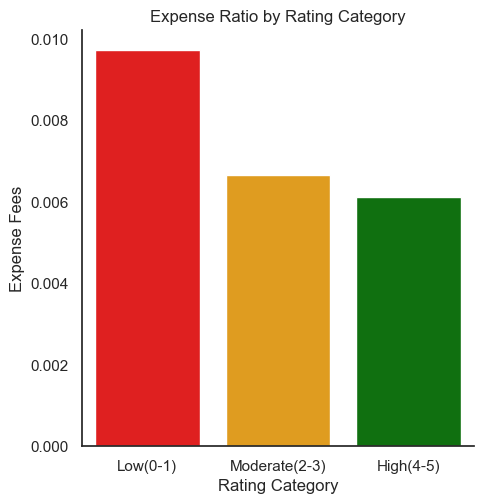

In [1754]:
sns.set_style('white')
sns.set_context('notebook')
sns.catplot(data=rating,x='rating_category',y='expense_ratio',kind='bar',palette=color)
plt.title('Expense Ratio by Rating Category')
plt.ylabel('Expense Fees')
plt.xlabel('Rating Category')




plt.show()

The bar graph displays the average expense fees by rating category. Low rated funds have the highest average expense fees, amouting to 0.97%. In contrast, High rated funds had the lowest average expense fees at 0.61%. Expense fees might negatively impact fund rating. Funds with higher rating have lower expense fees. 

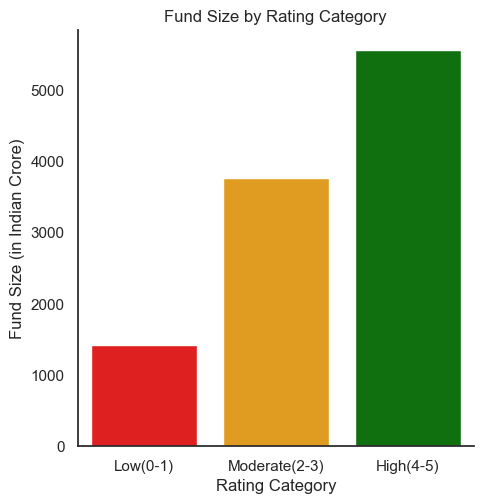

In [1759]:
sns.catplot(data=rating,x='rating_category',y='fund_size_cr',kind='bar',palette=color)
plt.title('Fund Size by Rating Category')
plt.ylabel('Fund Size (in Indian Crore)')
plt.xlabel('Rating Category')





plt.show()

High rated funds have the highest average fund sizes, amounting to 5567 Indian crores. Low rated funds have the lowest average fund sizes at 1427 crores, which is considerable lower than the average fund size of high rates funds. The data suggests that mutual fund schemes with large assets under management received a higher rating than funds who are smaller in terms of asset under management.  

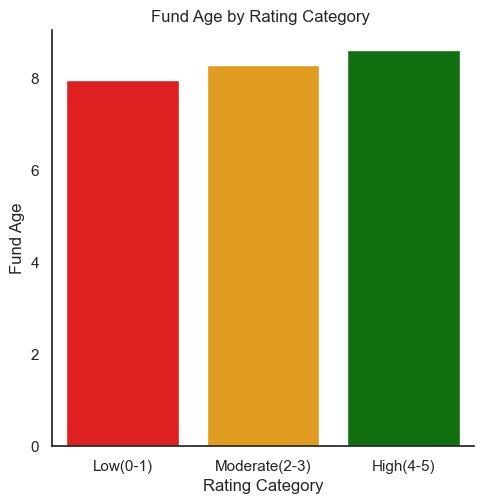

In [1620]:
sns.catplot(data=rating,x='rating_category',y='fund_age_yr',kind='bar',palette=color)
plt.title('Fund Age by Rating Category ')
plt.ylabel('Fund Age')
plt.xlabel('Rating Category')




plt.show()

High rated funds have the highest average fund life, amouting to 8.6 years. Low rated movies have an average fund life of 7.96 years. Moderate rated funds have an average life of 8.3 years. The data suggests that high rated funds have a longer fund life than low rates, even when the difference is small.

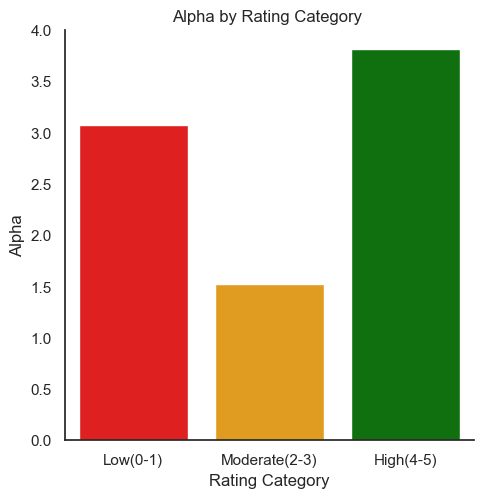

In [1621]:
sns.catplot(data=rating,x='rating_category',y='alpha',kind='bar',palette=color)
plt.title('Alpha by Rating Category ')
plt.ylabel('Alpha')
plt.xlabel('Rating Category')





plt.show()

High rated funds have an average alpha of 3.8, while low rated funds have an average alpha of 3.0. High rated funds outpeformed the market by a larger percentage point than low rated after adjusting for systematic risk. 

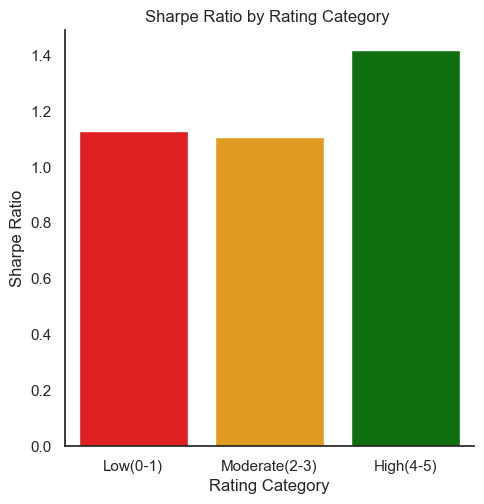

In [1622]:
sns.catplot(data=rating,x='rating_category',y='sharpe',kind='bar',palette=color)
plt.title('Sharpe Ratio by Rating Category ')
plt.ylabel('Sharpe Ratio')
plt.xlabel('Rating Category')




plt.show()

High rated funds have an average sharpe ratio of 1.4, which is the highest sharpe ratio in among it's category. The difference in sharpe ratio between the low and moderate category is small. 

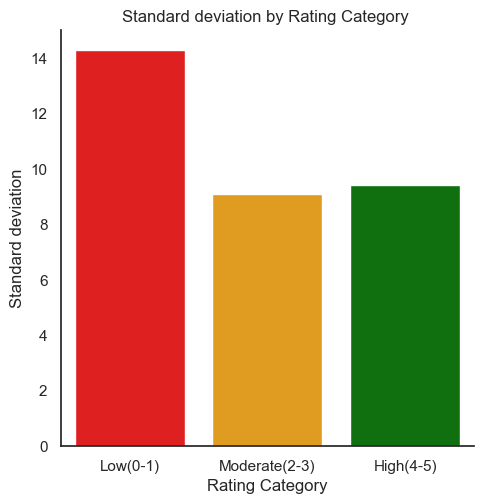

In [1623]:
sns.catplot(data=rating,x='rating_category',y='sd',kind='bar',palette=color)
plt.title('Standard deviation by Rating Category ')
plt.ylabel('Standard deviation')
plt.xlabel('Rating Category')





plt.show()

Low rated funds have a higher standard deviation than moderate and high rated funds. Low rated funds have an average standard deviation of 14.3, while moderate funds have a sd of 9.09, and high rated funds have an average sd of 9.43. The data suggests that funds with higher volatility receive a lower rating than funds with moderate levels of volatility. 

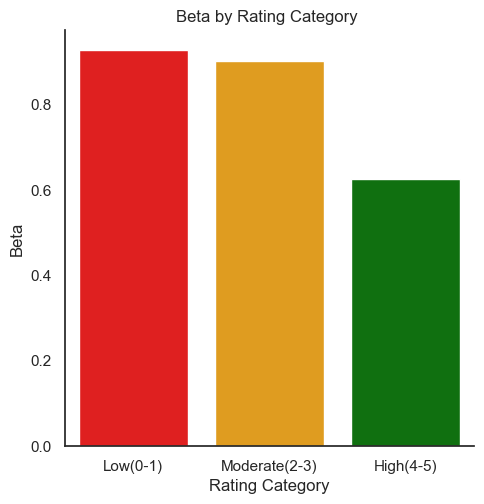

In [1624]:
sns.catplot(data=rating,x='rating_category',y='beta',kind='bar',palette=color)
plt.title('Beta by Rating Category ')
plt.ylabel('Beta')
plt.xlabel('Rating Category')





plt.show()

Low rated funds have the highest average beta in its category, amounting to 0.93. A higher beta, indicates that the investment is sensitive to market changes and has some systematic risk.In constrast, High rated funds have the lowest beta at 0.62, which means that they have lower systematic risk. It seems that lower systematic risk is preferred by the entity that rates the mutual fund schemes. 

In [1589]:
rating

,rating_category,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr
0,Low(0-1),439.457831,2984.939759,0.009737,1427.739880,7.963855,2.368598,3.066897,14.300184,0.927448,1.128963,5.066265,0.349398,0.015741,0.232448,0.102124,100000.0,100600.421687,122266.727273,109162.480620
1,Moderate(2-3),552.673966,3042.673966,0.006656,3764.509976,8.289538,2.428677,1.521628,9.098651,0.901247,1.108244,4.214112,2.591241,0.036740,0.163742,0.086620,100000.0,103008.321168,115692.759494,107948.255452
2,High(4-5),548.945148,3099.578059,0.006133,5567.278101,8.620253,3.227863,3.810470,9.439017,0.624359,1.418034,4.257384,4.333333,0.059945,0.188300,0.103685,100000.0,105381.181435,118211.287554,109715.685279


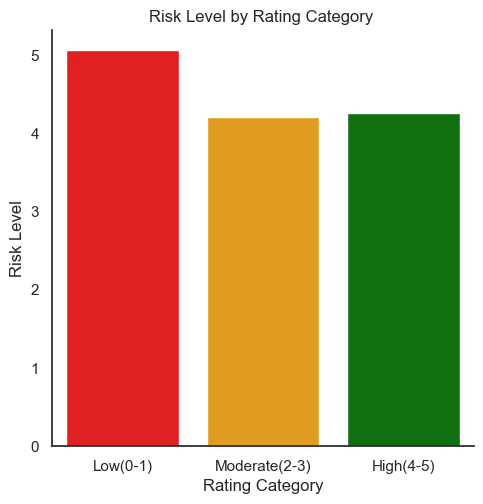

In [1626]:
sns.catplot(data=rating,x='rating_category',y='risk_level',kind='bar',palette=color)
plt.title('Risk Level by Rating Category ')
plt.ylabel('Risk Level')
plt.xlabel('Rating Category')





plt.show()

Low rated funds have the highest average risk level, amounting to 5.06. High rated and moderate rated funds have an average risk level of 4.22. The data suggests that riskier funds receive a lower rating than high and moderate rated funds. 

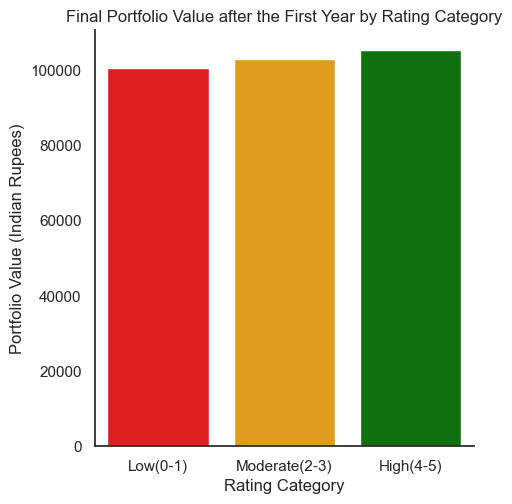

In [1760]:
sns.catplot(data=rating,x='rating_category',y='Final_Value_1yr',kind='bar',palette=color)
plt.title('Final Portfolio Value after the First Year by Rating Category')
plt.ylabel('Portfolio Value (Indian Rupees)')
plt.xlabel('Rating Category')





plt.show()

In this graph, I'm looking at the average portfolio value after the first year by rating category. High rated funds had the highest average portfolio value at the end of year one,amounting to 105381 after expenses. Low rated funds had the lowest portfolio value at the end of year one,amounting to 106,000 after expenses. On average, High rated funds outperformed the low rated and moderated funds. 

In [1628]:
rating

,rating_category,min_sip,min_lumpsum,expense_ratio,fund_size_cr,fund_age_yr,sortino,alpha,sd,beta,sharpe,risk_level,rating,returns_1yr,returns_3yr,returns_5yr,Money_Invested,Final_Value_1yr,Final_Value_3yr,Final_Value_5yr
0,Low(0-1),439.457831,2984.939759,0.009737,1427.739880,7.963855,2.368598,3.066897,14.300184,0.927448,1.128963,5.066265,0.349398,0.015741,0.232448,0.102124,100000.0,100600.421687,122266.727273,109162.480620
1,Moderate(2-3),552.673966,3042.673966,0.006656,3764.509976,8.289538,2.428677,1.521628,9.098651,0.901247,1.108244,4.214112,2.591241,0.036740,0.163742,0.086620,100000.0,103008.321168,115692.759494,107948.255452
2,High(4-5),548.945148,3099.578059,0.006133,5567.278101,8.620253,3.227863,3.810470,9.439017,0.624359,1.418034,4.257384,4.333333,0.059945,0.188300,0.103685,100000.0,105381.181435,118211.287554,109715.685279


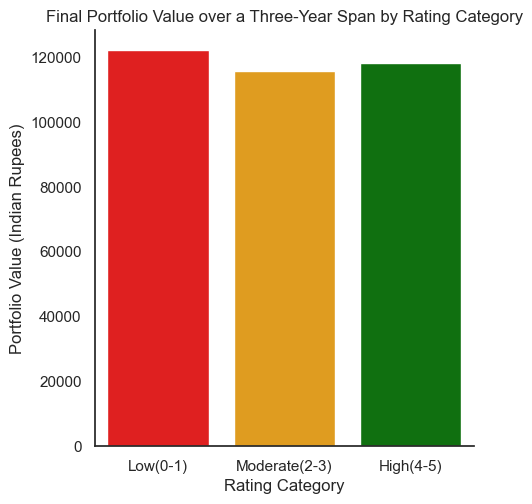

In [1761]:
sns.catplot(data=rating,x='rating_category',y='Final_Value_3yr',kind='bar',palette=color)
plt.title('Final Portfolio Value over a Three-Year Span by Rating Category')
plt.ylabel('Portfolio Value (Indian Rupees)')
plt.xlabel('Rating Category')





plt.show()

Low rated funds, on average, outperformed both high rated and moderate rated funds in terms of portfolio value at the end of year three. The average porfolio value after three years of investing with the fund was 122,266 Indian rupees, while high rated and moderate rated funds had a portfolio value of 118,211 and 115,692, respectively.

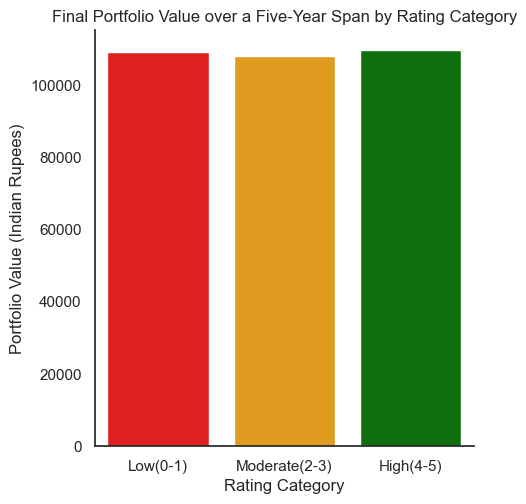

In [1762]:
sns.catplot(data=rating,x='rating_category',y='Final_Value_5yr',kind='bar',palette=color)
plt.title('Final Portfolio Value over a Five-Year Span by Rating Category')
plt.ylabel('Portfolio Value (Indian Rupees)')
plt.xlabel('Rating Category')





plt.show()

High rated funds, on average had a portfolio value of 109,715 Indian rupees if you stayed with the fund for over five years. Low rated funds, on average, had a slightly lower porfolio value after the fifth year at 109,162. 

After conducting a comparative analysis of low-rated, moderate-rated, and high-rated funds across various numerical variables, these are the results.

1. Low-rated funds had higher average expense ratios compared to moderate-rated and high-rated funds. In contrast, high-rated funds exhibited the lowest average expense ratio.

2. High-rated funds had significantly larger average fund sizes compared to low-rated and moderate-rated funds.

3. The average Sortino ratio of high-rated funds surpassed that of the other categories.

4. High-rated funds displayed the highest average alpha ratio, while low-rated funds ranked second in terms of average alpha ratio.

5. On average, low-rated funds exhibited the highest standard deviation and beta among the categories. This indicates that they carried higher volatility and systematic risk, which might not align with the preference of most investors seeking lower volatility and systematic risk.

6. High-rated funds boasted the largest Sharpe ratio among all categories, indicating better risk-adjusted returns.

7. Low-rated funds demonstrated the highest average risk level among the categories.

8. In terms of final portfolio values, high-rated funds achieved the highest average portfolio value after the first year and over a five-year period. Conversely, low-rated funds had the highest average portfolio value over a three-year period.

Based on the analysis, funds with higher ratings tended to exhibit lower standard deviation, beta, and risk levels, as most investors prefer lower volatility and risk. Factors such as higher Sortino, Sharpe, and alpha ratios were associated with better ratings. These ratios are risk-adjusted measures that investors consider crucial when selecting a fund. Higher values of these ratios indicate that the fund generated excess returns relative to the level of risk taken.

Regarding final portfolio values, no definitive conclusion can be drawn as there were no consistent patterns observed over the one-year, three-year, and five-year periods.

In summary, the analysis suggests that lower volatility, higher risk-adjusted ratios, and larger fund sizes positively influenced fund ratings. However, the impact of these factors on final portfolio values varied and did not exhibit consistent trends across the different time periods analyzed.




Source: https://www.kaggle.com/datasets/ravibarnawal/mutual-funds-india-detailed